# EDA Plots
----
Library to imports for plotting

In [1]:
#Imports Library:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Additional Settings

In [2]:
# Plot Style Sheets
plt.style.use('default')
sns.set_style('white')

# Optional setting to setup Jupyter
from IPython.display import display, HTML

display(HTML(data="""
<style>
    div#notebook-container    { width: 80%; }
    div#menubar-container     { width: 80%; }
    div#maintoolbar-container { width: 80%; }
</style>
"""))

pd.set_option("display.width", 120)
pd.set_option("display.max_rows", 100)
pd.set_option("display.max_columns", 100)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

## User Custom Fuctions

In [3]:
# Create a function that plot numeric columns.
def plot_num_col(dataframe, x_var, y_var,displot_min_xlim=None, displot_max_xlim=None, dist_kde=True, xlabrot=0):
    '''Create a correlation of (x_var, y_var), regplot of (x_var, y_var), distplot of (x_var) and 
       dist_kde=True, to plot KDE
       
       Parameters: 
       arg1 (dataframe) : target dataframe
       arg2 (x_var): column name of x variable to plot
       arg3 (y_var): column name of y variable to plot
       arg4 (int): minimum of x-axis of distplot
       arg5 (int): maximum of x-axis of displot
       arg6 (bool): to draw KDE
       arg7 (int): x label rotation
       
       Returns:
       dataframe of x_var summary statistic
    '''
    
    # Create a dataframe of summary statistic
    df = pd.DataFrame(dataframe[x_var].describe())

    #Plot Setting
    fig = plt.figure(figsize=(13,10))
    gs = fig.add_gridspec(2, 2,top = 0.85, hspace= 0.2, wspace=0.2)
    plt.title(x_var + ' plots', fontsize=20, pad=10)
    plt.axis('off')
    
    
    # Correlation wtih price
    f_ax1 = fig.add_subplot(gs[0, 0])
    f_ax1.set_title("Correlation Heatmap of " + x_var + " vs " + y_var)
    f_ax1.tick_params(axis='x', labelrotation=xlabrot)
    sns.heatmap(dataframe[[x_var, y_var]].corr(), annot=True, ax=f_ax1)
    
    
    # Regplot
    f_ax2 = fig.add_subplot(gs[1, :2])
    f_ax2.set_title('Regplot of '+ x_var + " vs " + y_var)
    f_ax2.axhline(dataframe[y_var].median(), label= y_var + " median", color='r')
    f_ax2.axhline(dataframe[y_var].mean(), label= y_var + " mean", color='r', linestyle='--')
    f_ax2.axvline(dataframe[x_var].median(), label= x_var + " median", color='green')
    f_ax2.axvline(dataframe[x_var].mean(), label= x_var + " median", color='green', linestyle='--')
    f_ax2.legend()
    f_ax2.tick_params(axis='x',labelrotation=xlabrot)
    sns.regplot(x=x_var, y=y_var, data=dataframe,ax=f_ax2, scatter_kws={'color': 'blue', 'alpha': 0.6}, line_kws={'color':'purple'})
    
    # Distribution Plot
    f_ax3 = fig.add_subplot(gs[0, 1])
    f_ax3.set_title('distribution plot of '+ x_var)
    
    ## Change the Xmin and Xmax limit
    if displot_min_xlim == None:
        displot_min_xlim = 0
        
    if displot_max_xlim == None:
        displot_max_xlim = max(dataframe[x_var])
  
    f_ax3.set_xlim(displot_min_xlim, displot_max_xlim)
    f_ax3.axvline(dataframe[x_var].mean(), label='mean', color='r', linewidth=1)
    f_ax3.axvline(dataframe[x_var].median(), label='median', color='purple', linewidth=1)
    f_ax3.legend()
    f_ax3.tick_params(axis='x',labelrotation=xlabrot)
    
    if dist_kde==True:
        sns.distplot(dataframe[x_var], ax=f_ax3, kde=True)
    else:
        sns.distplot(dataframe[x_var], ax=f_ax3, kde=False)
        
    
    # Creating Single column correlation Heatmap
    #if s_corr_hp ==True:
        #f_ax4 = fig.add_subplot(gs[:, 2])
        #f_ax4.set_title("Correlation Heatmap of " + x_var + " vs other numeric")
        #df_corr = dataframe[num_col_list].corr()
        #sns.heatmap(data=df_corr[[x_var]].sort_values(by=x_var, ascending=False), annot=True, ax=f_ax4)
    
    return df.T
    

In [4]:
# Create a function that mapping Nominal value to categorial data and plot correlation vs price and distribution of data

def plot_non_num_col(dataframe, x_var, y_var, xlabrot=0):
    '''
    Create a correlation of (x_var, y_var), regplot of (x_var, y_var), distplot of (x_var) and 
    dist_kde=True, to plot KDE
       
    Parameters: 
    arg1 (dataframe) : target dataframe
    arg2 (x_var): column name of x variable to plot
    arg3 (y_var): column name of y variable to plot
    arg4 (int): x label rotation


    Returns:
    dataframe of x_var summary statistic
    '''
    
    # Print out statistic
    s1 = pd.Series(dataframe[x_var].value_counts(dropna=False), name=x_var +' val_count')
    s2 = pd.Series(dataframe[x_var].value_counts(normalize=True, dropna=False), name=x_var + ' weight')
    df = pd.concat([s1,s2], axis=1).sort_values(by=(x_var + ' weight'), ascending=False)
    order = df.sort_values(by=(x_var + ' weight'), ascending=False).index
    
    mapping = {}
    dataframe_1 = pd.DataFrame()
    ls = list(dataframe[x_var].unique())
    for i, element in enumerate(ls):
        mapping[element] = i+1
    dataframe_1[[x_var,y_var]] = dataframe[[x_var,y_var]]  
    dataframe_1[x_var] = dataframe_1[x_var].map(mapping)

    #Plotting
    fig = plt.figure(figsize=(15,10))
    gs = fig.add_gridspec(2, 2)
    f_ax1 = fig.add_subplot(gs[0, 0])
    f_ax1.set_title("Correlation Heatmap of " + x_var + " vs " + y_var)
    f_ax1.tick_params(axis='x',labelrotation=xlabrot)
    sns.heatmap(dataframe_1[[x_var, y_var]].corr(), annot=True, ax=f_ax1)
    
    
    f_ax2 = fig.add_subplot(gs[0, 1])
    f_ax2.set_title('Boxplot of '+ x_var + " vs " + y_var)
    f_ax2.tick_params(axis='x',labelrotation=xlabrot)
    sns.boxplot(x=x_var, y=y_var, data=dataframe, ax=f_ax2, order=order)
    
    f_ax3 = fig.add_subplot(gs[1, :])
    f_ax3.set_title('Swarmplot of '+ x_var + " vs " + y_var)
    f_ax3.tick_params(axis='x',labelrotation=xlabrot)
    sns.swarmplot(x=x_var, y=y_var, data=dataframe, ax=f_ax3, order=order)
    

    return df.T
    
    #ax[1].legend([mapping.values()], [mapping.keys()])
    #ax[1].set_xlabel(mapping)

<a id='plot_dictionary'></a>
## Data Dictionary (Plot)

|No.|Feature|Data Type|Category|Description|Link|Drop|
|---|---|---|---|---|---|---|
|01|ms_subclass|int64|nomial|The building class|[ms_subclass](#ms_subclass)||
|02|ms_zoning|object|nomial|Identifies the general zoning classification of the sale.|[ms_zoning](#ms_zoning)||
|03|lot_frontage|float64|continuous|Linear feet of street connected to property|[lot_frontage](#frontage)||
|04|lot_area|int64|continuous|Lot size in square feet|[lot_area](#area)||
|05|street|object|nomial|Type of road access to property|[street](#street)|<span style='color:red'>(Drop)</span>|
|06|alley|object|nomial|Type of alley access to property|[alley](#alley)|<span style='color:red'>(Drop)</span>|
|07|lot_shape|object|nomial|General shape of property|[lot_shape](#shape)||
|08|land_contour|object|nomial|Flatness of the property|[land_contour](#land_contour)||
|09|utilities|object|nomial|Type of utilities available|[utilities](#utilities)|<span style='color:red'>(Drop)</span>|
|10|lot_config|object|nomial|Lot configuration|[lot_config](#lot_config)||
|11|land_slope|object|nomial|Slope of property|[land_slope](#land_slope)||
|12|neighborhood|object|nomial|Physical locations within Ames city limits|[neighborhood](#neighborhood)||
|13|condition_1|object|nomial|Proximity to main road or railroad|[condition_1](#condition_1)||
|14|condition_2|object|nomial|Proximity to main road or railroad (if a second is present)|[condition_2](#condition_2)|<span style='color:red'>(Drop)</span>|
|15|bldg_type|object|nomial|Type of dwelling|[bldg_type](#bldg_type)||
|16|house_style|object|nomial|Style of dwelling|[house_style](#house_style)||
|17|overall_qual|int64|ordinal|Overall material and finish quality|[overall_qual](#overall_qual)||
|18|overall_cond|int64|ordinal|Overall condition rating|[overall_cond](#overall_cond)||
|19|year_built|int64|continuous|Original construction date|[year_built](#year_built)|<span style='color:red'>(Drop)</span>|
|20|year_remod/add|int64|continuous|Remodel date (same as construction date if no remodeling or additions)|[year_remod/add](#year_remod/add)|<span style='color:red'>(Drop)</span>|
|21|roof_style|object|nomial|Type of roof|[roof_style](#roof_style)||
|22|roof_matl|object|nomial|Roof material|[roof_matl](#roof_matl)|<span style='color:red'>(Drop)</span>|
|23|exterior_1st|object|nomial|Exterior covering on house|[exterior_1st](#exterior_1st)||
|24|exterior_2nd|object|nomial|Exterior covering on house (if more than one material)|[exterior_2nd](#exterior_2nd)||
|25|mas_vnr_type|object|nomial|Masonry veneer type|[mas_vnr_type](#mas_vnr_type)|<span style='color:red'>(Drop)</span>|
|26|mas_vnr_area|float64|continuous|Masonry veneer area in square feet|[mas_vnr_area](#vnr_area)||
|27|exter_qual|object|ordinal|Exterior material quality|[exter_qual](#exter_qual)||
|28|exter_cond|object|ordinal|Present condition of the material on the exterior|[exter_cond](#exter_cond)||
|29|foundation|object|nomial|Type of foundation|[foundation](#founation)||
|30|bsmt_qual|object|ordinal|Height of the basement|[bsmt_qual](#bsmt_qual)||
|31|bsmt_cond|object|ordinal|General condition of the basement|[bsmt_cond](#bsmt_cond)||
|32|bsmt_exposure|object|ordinal|Walkout or garden level basement walls|[bsmt_exposure](#bsmt_exposure)||
|33|bsmtfin_type_1|object|ordinal|Quality of basement finished area|[bsmtfin_type_1](#bsmtfin_type_1)||
|34|bsmtfin_sf_1|float64|continuous|Type 1 finished square feet|[bsmtfin_sf_1](#bsmtfin_sf_1)|<span style='color:red'>(Drop)</span>|
|35|bsmtfin_type_2|object|ordinal|Quality of second finished area (if present)|[bsmtfin_type_2](#bsmtfin_type_2)||
|36|bsmtfin_sf_2|float64|continuous|Type 2 finished square feet|[bsmtfin_sf_2](#bsmtfin_sf_2)|<span style='color:red'>(Drop)</span>|
|37|bsmt_unf_sf|float64|continuous|Unfinished square feet of basement area|[bsmt_unf_sf](#bsmt_unf_sf)|<span style='color:red'>(Drop)</span>|
|38|total_bsmt_sf|float64|continuous|Total square feet of basement area|[total_bsmt_sf](#total_bsmt_sf)||
|39|heating|object|nomial|Type of heating|[heating](#heating)|<span style='color:red'>(Drop)</span>|
|40|heating_qc|object|ordinal|Heating quality and condition|[heating_qc](#heating_qc)||
|41|central_air|object|ordinal|Central air conditioning|[central_air](#central_air)|<span style='color:red'>(Drop)</span>|
|42|electrical|object|nomial|Electrical System|[electrical](#electrical)|<span style='color:red'>(Drop)</span>|
|43|1st_flr_sf|int64|continuous|First Floor square feet|[1st_flr_sf](#1st_flr_sf)|<span style='color:red'>(Drop)</span>|
|44|2nd_flr_sf|int64|continuous|Second floor square feet|[2nd_flr_sf](#2nd_flr_sf)|<span style='color:red'>(Drop)</span>|
|45|low_qual_fin_sf|int64|continuous|Low quality finished square feet (all floors)|[low_qual_fin_sf](#low_qual_fin_sf)|<span style='color:red'>(Drop)</span>|
|46|gr_liv_area|int64|continuous|Above grade (ground) living area square feet|[gr_liv_area](#gr_liv_area)||
|47|bsmt_full_bath|float64|discrete|Basement full bathrooms|[bsmt_full_bath](#bsmt_full_bath)|<span style='color:red'>(Drop)</span>|
|48|bsmt_half_bath|float64|discrete|Basement half bathrooms|[bsmt_half_bath](#bsmt_half_bath)|<span style='color:red'>(Drop)</span>|
|49|full_bath|int64|discrete|Full bathrooms above grade|[full_bath](#full_bath)|<span style='color:red'>(Drop)</span>|
|50|half_bath|int64|discrete|Half baths above grade|[half_bath](#half_bath)|<span style='color:red'>(Drop)</span>|
|51|bedroom_abvgr|int64|discrete|Number of bedrooms above basement level|[bedroom_abvgr](#bedroom_abvgr)||
|52|kitchen_abvgr|int64|discrete|Number of kitchens|[kitchen_abvgr](#kitchen_abvgr)|<span style='color:red'>(Drop)</span>|
|53|kitchen_qual|object|ordinal|Kitchen quality|[kitchen_qual](#kitchen_qual)||
|54|totrms_abvgrd|in64|discrete|Total rooms above grade (does not include bathrooms)|[totrms_abvgrd](#totrms_abvgrd)||
|55|functional|object|ordinal|Home functionality rating|[functional](#functional)||
|56|fireplaces|int64|discrete|Number of fireplaces|[fireplaces](#fireplaces)||
|57|fireplace_qu|object|ordinal|Fireplace quality|[fireplace_qu](#fireplace_qu)||
|58|garage_type|object|nomial|Garage location|[garage_type](#garage_type)||
|59|garage_yr_blt|int64|continuous|Year garage was built|[garage_yr_blt](#garage_yr_blt)||
|60|garage_finish|object|nomial|Interior finish of the garage|[garage_finish](#garage_finish)||
|61|garage_cars|float64|discrete|Size of garage in car capacity|[garage_cars](#garage_cars)||
|62|garage_area|float64|continuous|Size of garage in square feet|[garage_area](#garage_area)||
|63|garage_qual|object|ordinal|Garage quality|[garage_qual](#garage_qual)||
|64|garage_cond|object|ordinal|Garage condition|[garage_cond](#garage_cond)||
|65|paved_drive|object|ordinal|Paved driveway|[paved_drive](#paved_drive)|<span style='color:red'>(Drop)</span>|
|66|wood_deck_sf|int64|continuous|Wood deck area in square feet|[wood_deck_sf](#wood_deck_sf)||
|67|open_porch_sf|int64|continuous|Open porch area in square feet|[open_porch_sf](#open_porch_sf)|<span style='color:red'>(Drop)</span>|
|68|enclosed_porch|int64|continuous|Enclosed porch area in square feet|[enclosed_porch](#enclosed_porch)|<span style='color:red'>(Drop)</span>|
|69|3ssn_porch|int64|continuous|Three season porch area in square feet|[3ssn_porch](#3ssn_porch)|<span style='color:red'>(Drop)</span>|
|70|screen_porch|int64|continuous|Screen porch area in square feet|[screen_porch](#screen_porch)|<span style='color:red'>(Drop)</span>|
|71|pool_area|int64|continuous|Pool area in square feet|[pool_area](#pool_area)|<span style='color:red'>(Drop)</span>|
|72|pool_qc|object|ordinal|Pool quality|[pool_qc](#pool_qc)|<span style='color:red'>(Drop)</span>|
|73|fence|object|ordinal|Fence quality|[fence](#fence)|<span style='color:red'>(Drop)</span>|
|74|misc_feature|object|nomial|Miscellaneous feature not covered in other categories|[misc_feature](#misc_feature)|<span style='color:red'>(Drop)</span>|
|75|misc_val|int64|continuous|Dollar Value of miscellaneous feature|[misc_val](#misc_val)|<span style='color:red'>(Drop)</span>|
|76|mo_sold|int64|discrete|Month Sold|[mo_sold](#mo_sold)||
|77|yr_sold|int64|continuous|Year Sold|[yr_sold](#yr_sold)||
|78|sale_type|object|nomial|Type of sale|[sale_type](#sale_type)||
|---|---|---|---|---|---|
|79|id|int64|id|||
|80|pid|int64|id|||
|81|saleprice|int64|continuous|Target Variable|[saleprice](#saleprice)||

## Import Dataset

In [5]:
rs = pd.read_csv('../datasets/clean_rs_ex_encode.csv')

In [6]:
rs.head()

,id,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,basmt_total_bath,total_bath_abvgr,total_bath,open_space_area,year_build_remod
0,109,533352170,60,RL,73.486,13517,Pave,None,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.000,Gd,TA,CBlock,TA,TA,No,GLQ,533.000,Unf,0.000,192.000,725.000,GasA,Ex,Y,SBrkr,725,754,0,1479,0.000,0.000,2,1,3,1,Gd,6,Typ,0,None,Attchd,1976.000,RFn,2.000,475.000,TA,TA,Y,0,44,0,0,0,0,None,None,None,0,3,2010,WD,130500,0.000,2.500,2.500,1,2005
1,544,531379050,60,RL,43.000,11492,Pave,None,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.000,Gd,TA,PConc,Gd,TA,No,GLQ,637.000,Unf,0.000,276.000,913.000,GasA,Ex,Y,SBrkr,913,1209,0,2122,1.000,0.000,2,1,4,1,Gd,8,Typ,1,TA,Attchd,1997.000,RFn,2.000,559.000,TA,TA,Y,0,74,0,0,0,0,None,None,None,0,4,2009,WD,220000,1.000,2.500,3.500,1,1997
2,153,535304180,20,RL,68.000,7922,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.000,TA,Gd,CBlock,TA,TA,No,GLQ,731.000,Unf,0.000,326.000,1057.000,GasA,TA,Y,SBrkr,1057,0,0,1057,1.000,0.000,1,0,3,1,Gd,5,Typ,0,None,Detchd,1953.000,Unf,1.000,246.000,TA,TA,Y,0,52,0,0,0,0,None,None,None,0,1,2010,WD,109000,1.000,1.000,2.000,1,2007
3,318,916386060,60,RL,73.000,9802,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.000,TA,TA,PConc,Gd,TA,No,Unf,0.000,Unf,0.000,384.000,384.000,GasA,Gd,Y,SBrkr,744,700,0,1444,0.000,0.000,2,1,3,1,TA,7,Typ,0,None,BuiltIn,2007.000,Fin,2.000,400.000,TA,TA,Y,100,0,0,0,0,0,None,None,None,0,4,2010,WD,174000,0.000,2.500,2.500,1,2007
4,255,906425045,50,RL,82.000,14235,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.000,TA,TA,PConc,Fa,Gd,No,Unf,0.000,Unf,0.000,676.000,676.000,GasA,TA,Y,SBrkr,831,614,0,1445,0.000,0.000,2,0,3,1,TA,6,Typ,0,None,Detchd,1957.000,Unf,2.000,484.000,TA,TA,N,0,59,0,0,0,0,None,None,None,0,3,2010,WD,138500,0.000,2.000,2.000,1,1993


In [7]:
# Shape of dataset
rs.shape

(2048, 86)

<a id='ms_subclass'></a>
### ms_subclass  
[Top](#plot_dictionary)

,20,60,50,120,30,70,160,80,90,190,85,75,180,45,40,150
ms_subclass val_count,768.000,394.000,198.000,132.000,101.000,89.000,88.000,86.000,75.000,46.000,28.000,16.000,11.000,11.000,4.000,1.000
ms_subclass weight,0.375,0.192,0.097,0.064,0.049,0.043,0.043,0.042,0.037,0.022,0.014,0.008,0.005,0.005,0.002,0.000


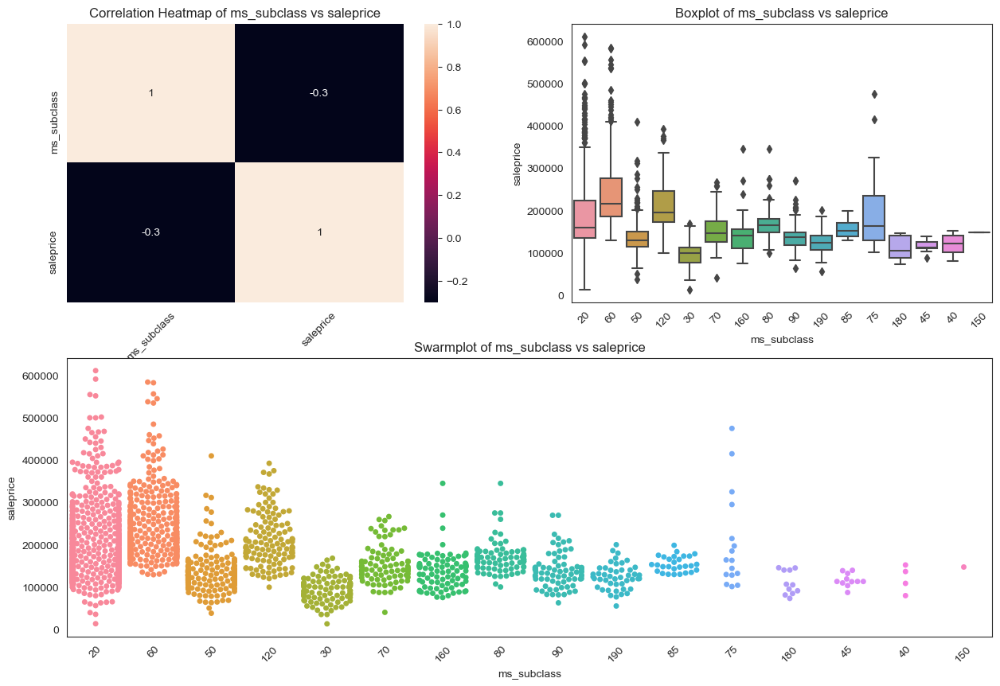

In [8]:
plot_non_num_col(rs,'ms_subclass','saleprice', xlabrot=45)

<span style="color:orange">Conclusion</span>: 
- From heatmap, `ms_subclass` exhibit weak negative correlation wth sale price. 
- From Boxplot & swamplot, it shows a good spread of different elements across price range. 
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='ms_zoning'></a>
### ms_zoning
[Top](#plot_dictionary)

,RL,RM,FV,C (all),RH,A (agr),I (all)
ms_zoning val_count,1597.000,314.000,101.000,19.000,14.000,2.000,1.000
ms_zoning weight,0.780,0.153,0.049,0.009,0.007,0.001,0.000


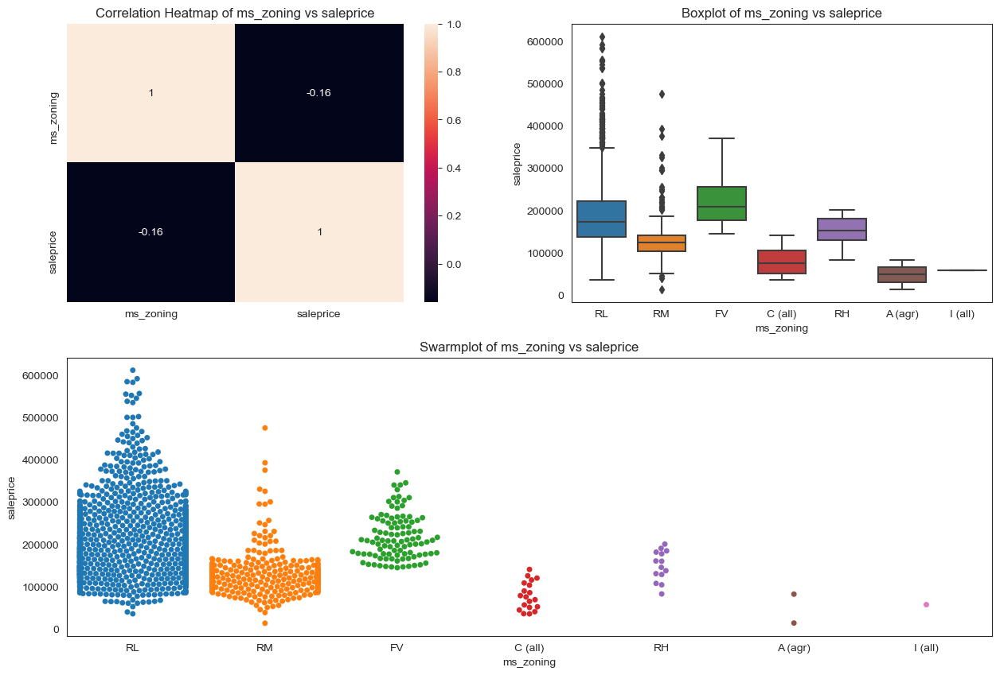

In [9]:
plot_non_num_col(rs,'ms_zoning','saleprice')

<span style="color:orange">Conclusion</span>: 
- `ms_zoning` has negative correlation to saleprice.
- Residential Low Density and Residential Medium Density made up 92% of the total observation while the next nearest element consist of almost 5% of the observation. 
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='frontage'></a>
### lot_frontage
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
lot_frontage,2048.000,69.192,21.670,21.000,60.000,70.000,78.000,313.000


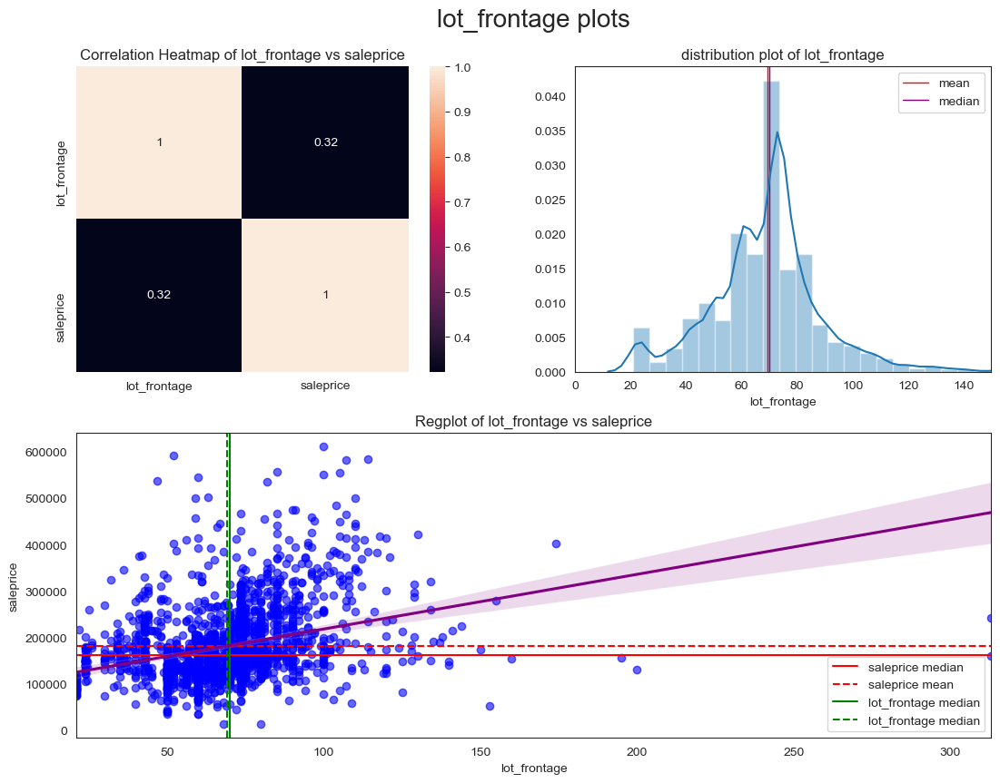

In [10]:
plot_num_col(rs, 'lot_frontage', 'saleprice',displot_max_xlim=150)

<span style="color:orange">Conclusion</span>: 
- From heatmap, `lot_frontage` exhibit weak correlation wth sale price. 
- From regplot there large number of observations clustering around the mean/median of `lot_frontage`. But there are 5 outliers beyond 180 range
- Observation are almost normally distributed with mean & median close each other. However it could be due to filling of 330 observations that has missing value with mean.
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='area'></a>
### lot_area
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
lot_area,2048.000,10049.675,6697.168,1300.000,7500.000,9432.000,11512.750,159000.000


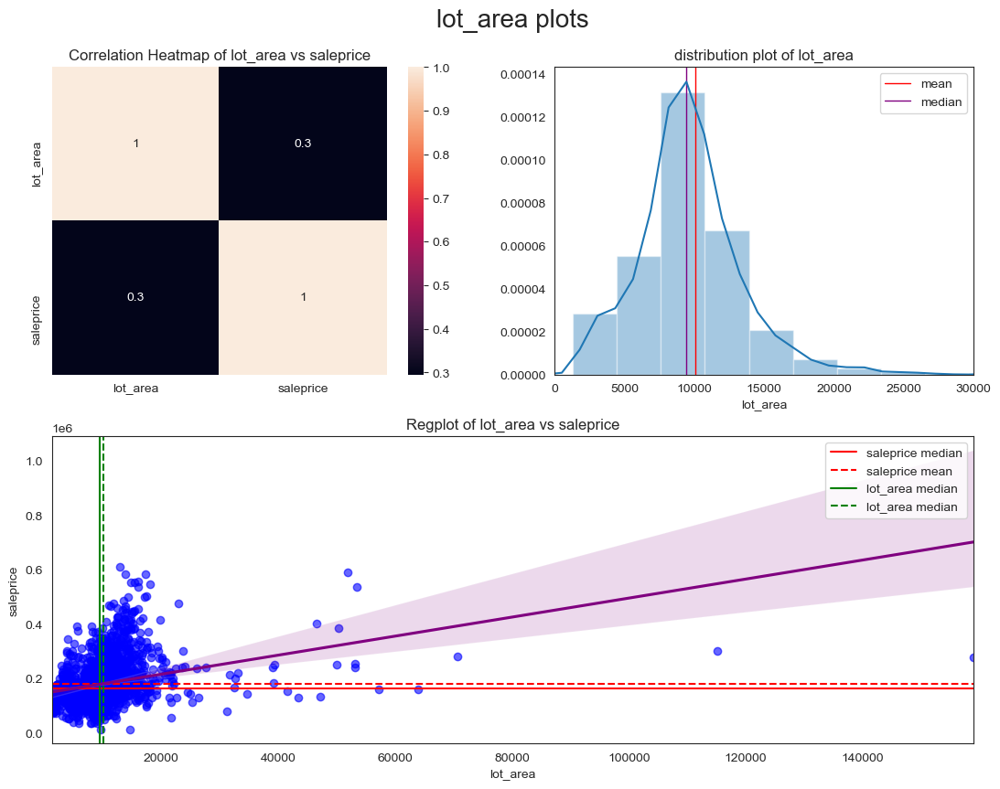

In [11]:
plot_num_col(rs, 'lot_area', 'saleprice',displot_max_xlim=30000)

<span style="color:orange">Conclusion</span>: 
- From heatmap, `lot_area` exhibit weak correlation wth saleprice and other features. 
- Regplot shows strong clustering  around mean/median of `lot_area`. But there are about 4-5 outliers beyond the 60,000 range
- Observations are almost normally distributed with mean & median close each other.
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='street'></a>
### Street
[Top](#plot_dictionary)

,Pave,Grvl
street val_count,2041.000,7.000
street weight,0.997,0.003


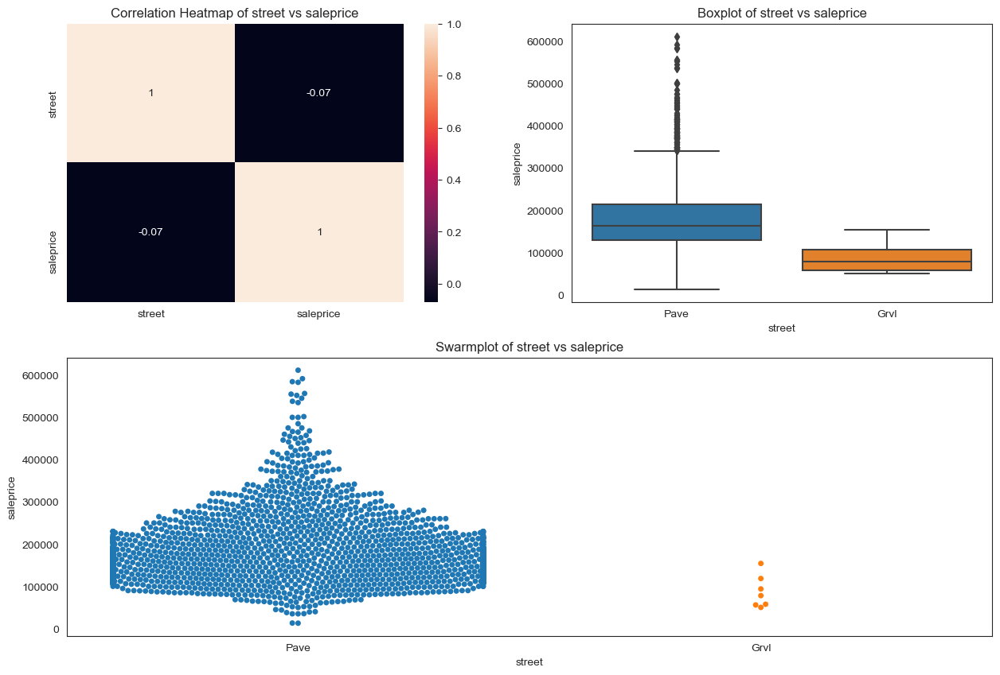

In [12]:
plot_non_num_col(rs,'street','saleprice')

<span style="color:orange">Conclusion</span>:
- very weak correlation with price
- 99% of observation are Pave street.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='alley'></a>
### Alley
[Top](#plot_dictionary)

,None,Grvl,Pave
alley val_count,1908.000,85.000,55.000
alley weight,0.932,0.042,0.027


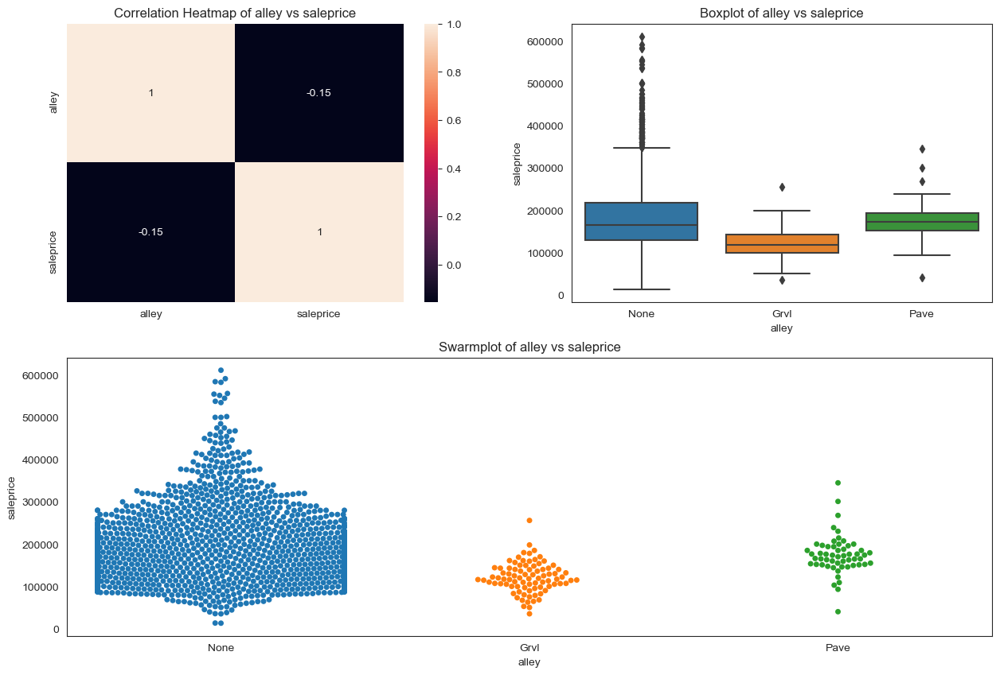

In [13]:
plot_non_num_col(rs,'alley','saleprice')

<span style="color:orange">Conclusion</span>: 
- `alley` have weak correlation with price
- `No alley access` in `alley` is almost 93% of observations.
- <span style="color:red">Variable can be dropped without affect model</span>

<a id='shape'></a>
### lot_shape
[Top](#plot_dictionary)

,Reg,IR1,IR2,IR3
lot_shape val_count,1294.000,690.000,55.000,9.000
lot_shape weight,0.632,0.337,0.027,0.004


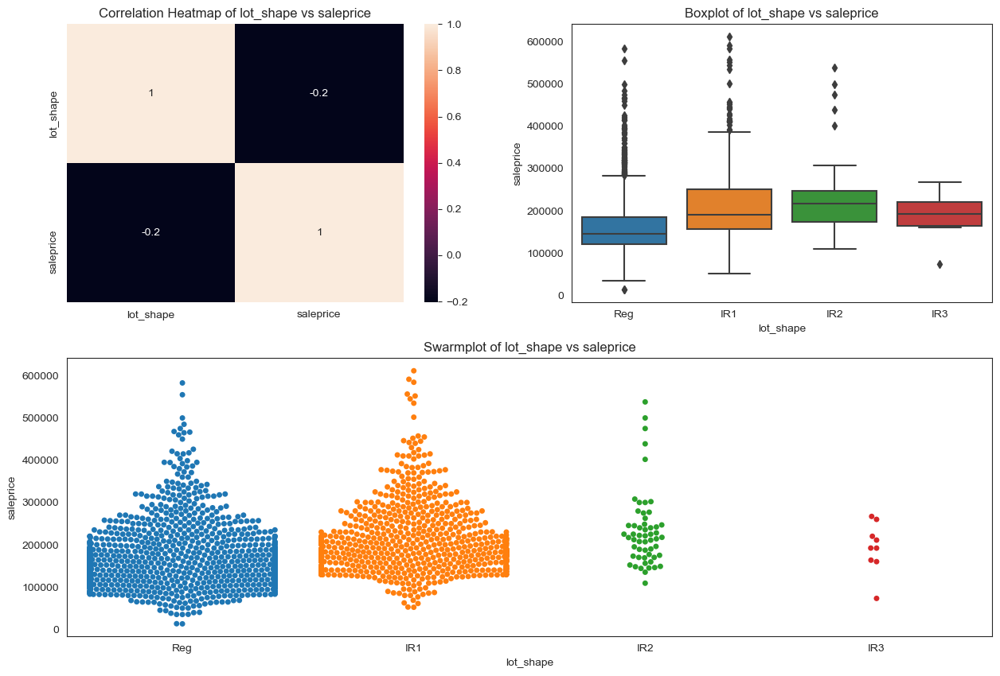

In [14]:
plot_non_num_col(rs, 'lot_shape','saleprice')

<span style="color:orange">Conclusion</span>:
- `lot shape` has low correlation with price
- Reg & IR1 make up almost 96% of the observations. 
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='lot_contour'></a>
### land_contour
[Top](#plot_dictionary)

,Lvl,HLS,Bnk,Low
land_contour val_count,1840.000,85.000,80.000,43.000
land_contour weight,0.898,0.042,0.039,0.021


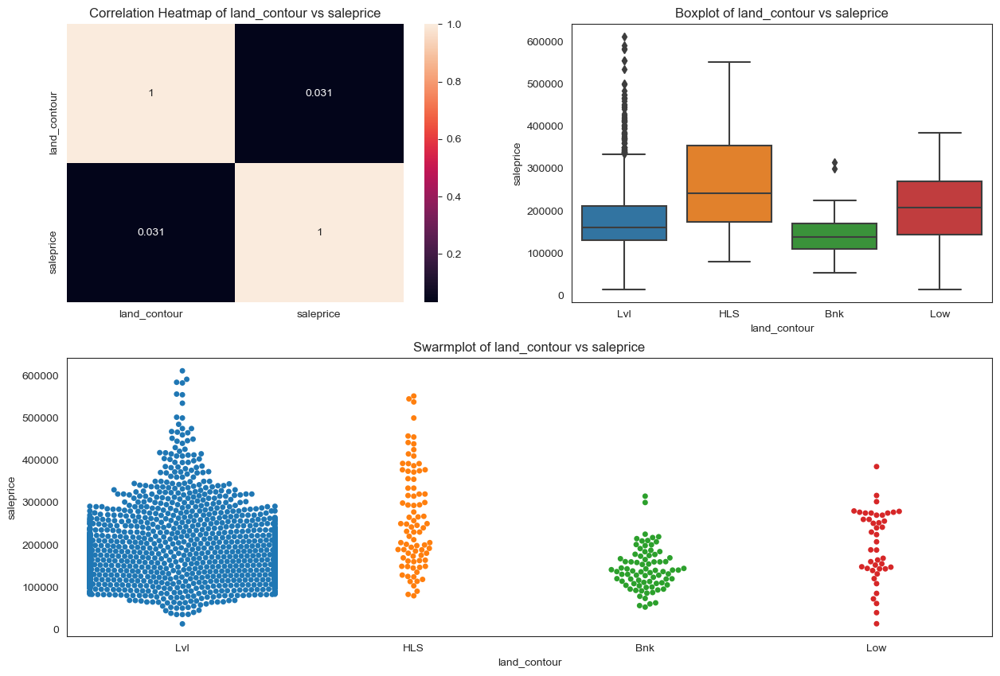

In [15]:
plot_non_num_col(rs, 'land_contour','saleprice')

<span style="color:orange">Conclusion</span>: 
- `Land Contour` has very weak correlation to sale price. 
- Lvl made up 90% of total observations while the proportion of the rest of the elements are less than 5%.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='utilities'></a>
### utilities
[Top](#plot_dictionary)

,AllPub,NoSeWa,NoSewr
utilities val_count,2046.000,1.000,1.000
utilities weight,0.999,0.000,0.000


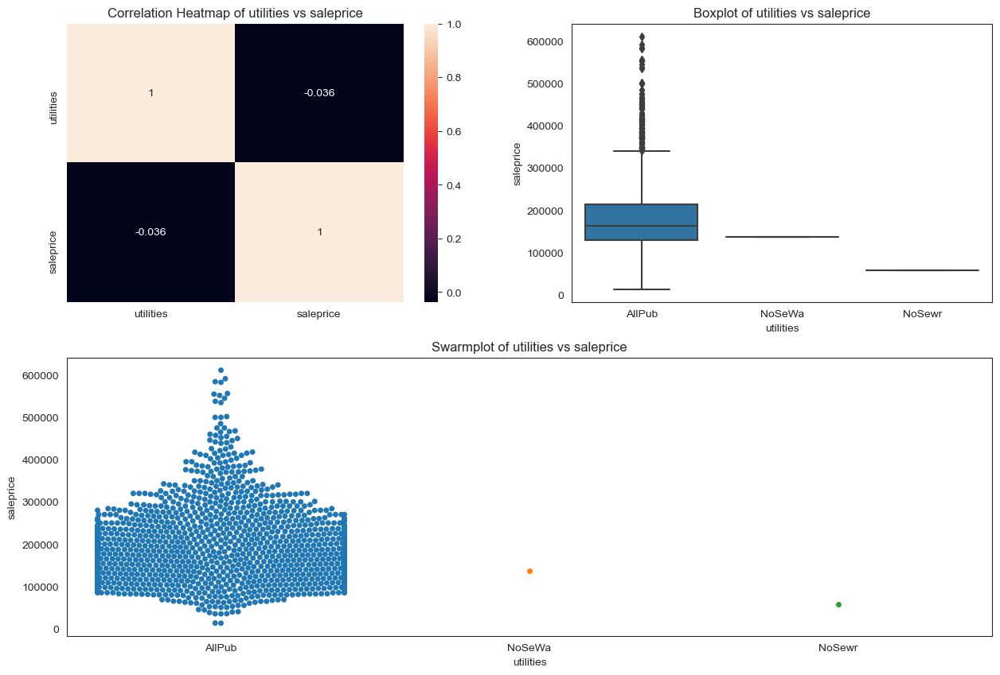

In [16]:
plot_non_num_col(rs, 'utilities','saleprice')

<span style="color:orange">Conclusion</span>: 
- `utilities` has very weak correlation to sale price.
- AllPub made up almost 100% of total observations 
- <span style="color:red">Variable can be dropped without affect model</span>

<a id='lot_config'></a>
### lot_config
[Top](#plot_dictionary)

,Inside,Corner,CulDSac,FR2,FR3
lot_config val_count,1501.000,348.000,131.000,60.000,8.000
lot_config weight,0.733,0.170,0.064,0.029,0.004


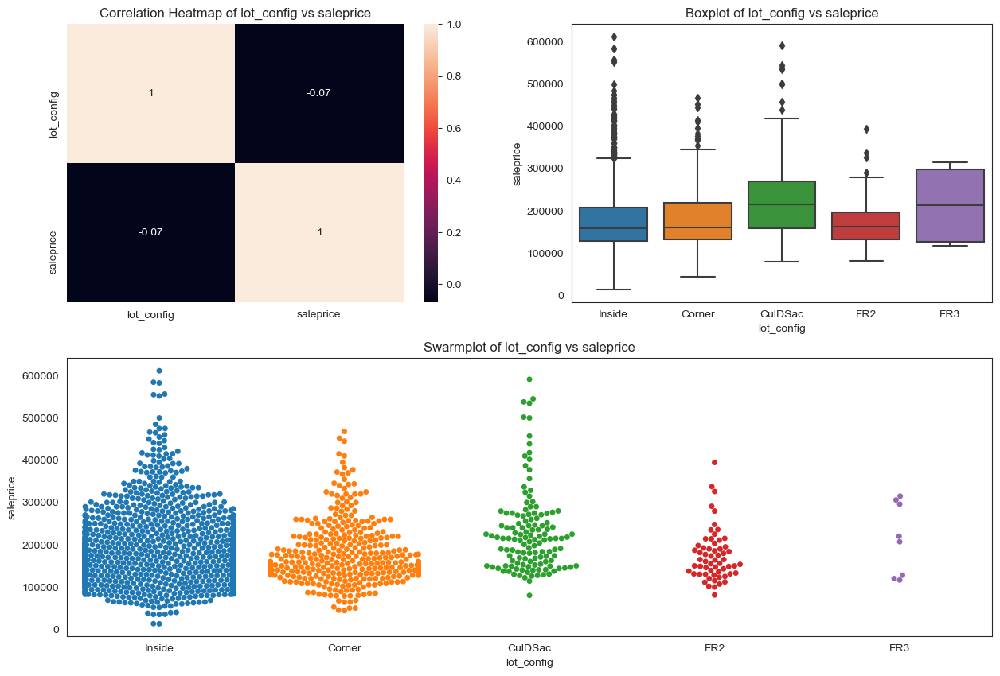

In [17]:
plot_non_num_col(rs, 'lot_config','saleprice')

<span style="color:orange">Conclusion</span>: 
- `lot_config` has very weak correlation with price.
- Boxplot and swarmplot shows that there are good spread around all elements and price range
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='land_slope'></a>
### land_slope
[Top](#plot_dictionary)

,Gtl,Mod,Sev
land_slope val_count,1950.000,88.000,10.000
land_slope weight,0.952,0.043,0.005


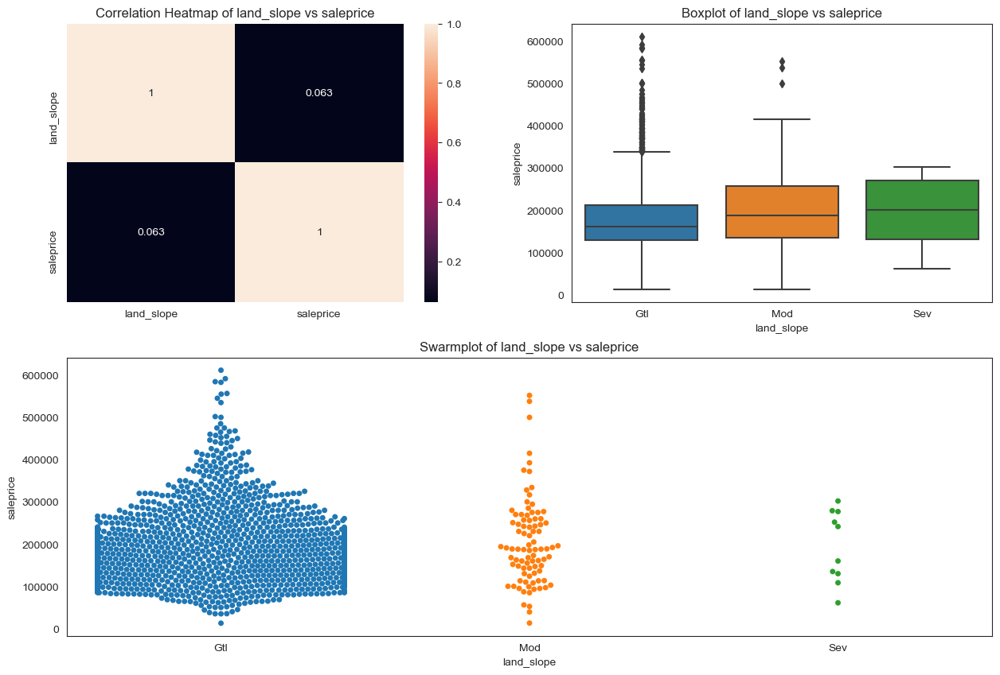

In [18]:
plot_non_num_col(rs, 'land_slope','saleprice')

<span style="color:orange">Conclusion</span>: 
- `land_slope` has very weak correlation with price
- Boxplot & Swarmplot shows that Gtl made up 95% of all the observations
- <span style="color:red">Variable can be dropped without affect model</span> 

<a id='neighborhood'></a>
### neighborhood
[Top](#plot_dictionary)

,NAmes,CollgCr,OldTown,Edwards,Somerst,NridgHt,Gilbert,Sawyer,NWAmes,SawyerW,Mitchel,BrkSide,Crawfor,IDOTRR,NoRidge,Timber,StoneBr,SWISU,ClearCr,MeadowV,Blmngtn,BrDale,Veenker,NPkVill,Blueste,Greens,GrnHill,Landmrk
neighborhood val_count,310.000,180.000,163.000,142.000,130.000,122.000,116.000,111.000,87.000,87.000,82.000,75.000,71.000,68.000,48.000,48.000,38.000,32.000,27.000,24.000,22.000,19.000,17.000,17.000,6.000,3.000,2.000,1.000
neighborhood weight,0.151,0.088,0.080,0.069,0.063,0.060,0.057,0.054,0.042,0.042,0.040,0.037,0.035,0.033,0.023,0.023,0.019,0.016,0.013,0.012,0.011,0.009,0.008,0.008,0.003,0.001,0.001,0.000


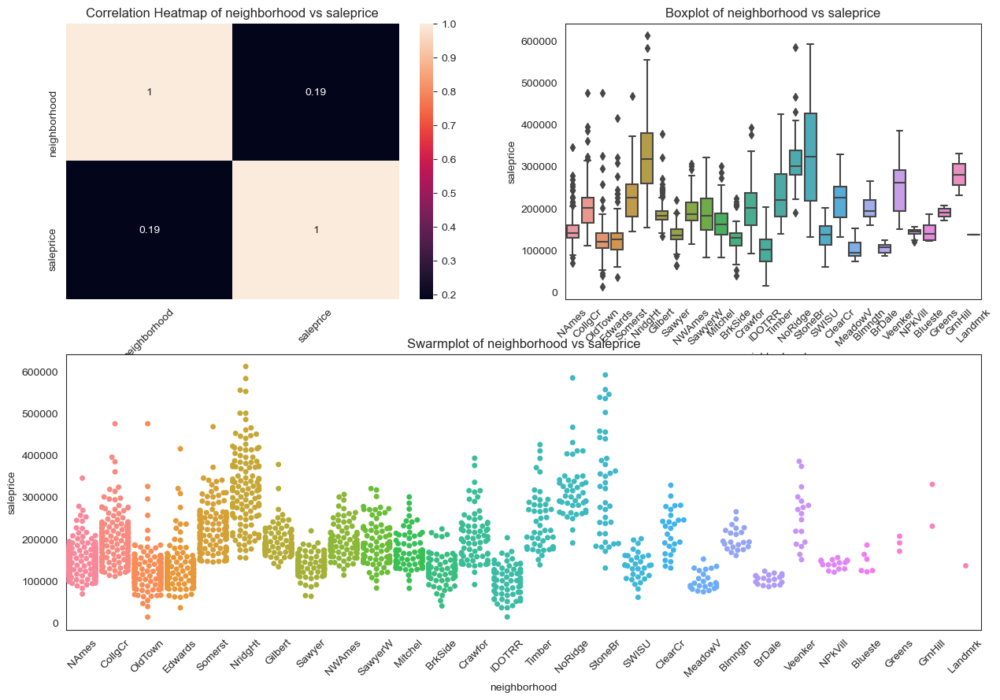

In [19]:
plot_non_num_col(rs, 'neighborhood','saleprice', xlabrot=45)

<span style="color:orange">Conclusion</span>: 
- `neighborhood` has low correlation to sale price, h
- Boxplot & Swarm shows good distribution of observations across all elements.
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='condition_1'></a>
### condition_1
[Top](#plot_dictionary)

,Norm,Feedr,Artery,RRAn,PosN,RRAe,PosA,RRNn,RRNe
condition_1 val_count,1765.000,108.000,70.000,36.000,27.000,21.000,12.000,6.000,3.000
condition_1 weight,0.862,0.053,0.034,0.018,0.013,0.010,0.006,0.003,0.001


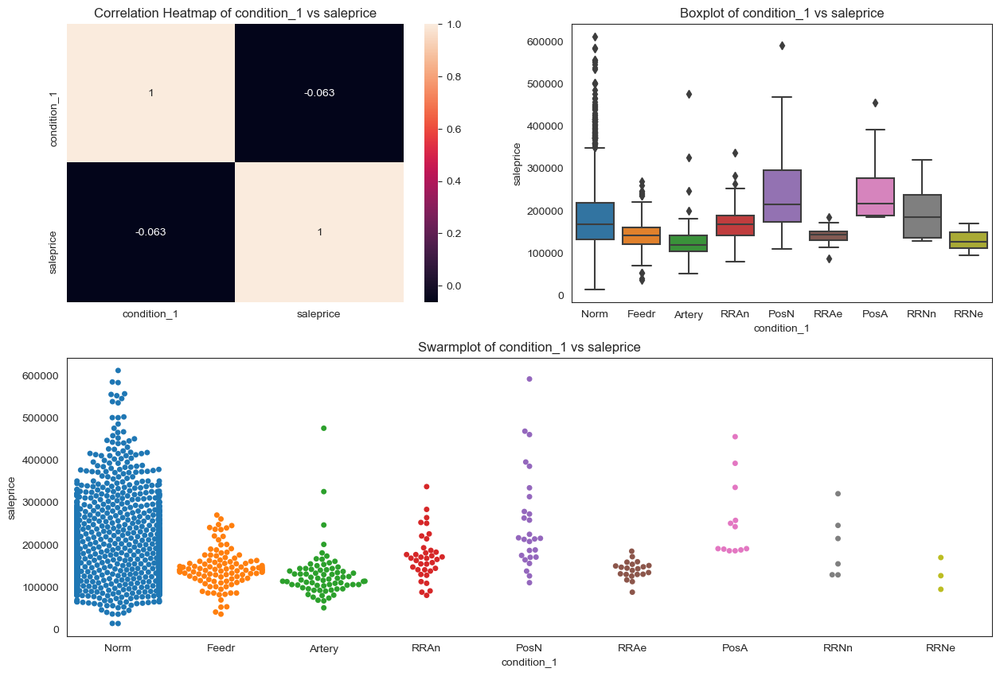

In [20]:
plot_non_num_col(rs, 'condition_1','saleprice')

<span style="color:orange">Conclusion</span>:
- `condition_1` has very weak negative correlation to sale price
- Boxplot & Swarm shows go
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='condition_2'></a>
### condition_2
[Top](#plot_dictionary)

,Norm,Feedr,Artery,PosA,PosN,RRNn,RRAn,RRAe
condition_2 val_count,2022.000,11.000,5.000,3.000,3.000,2.000,1.000,1.000
condition_2 weight,0.987,0.005,0.002,0.001,0.001,0.001,0.000,0.000


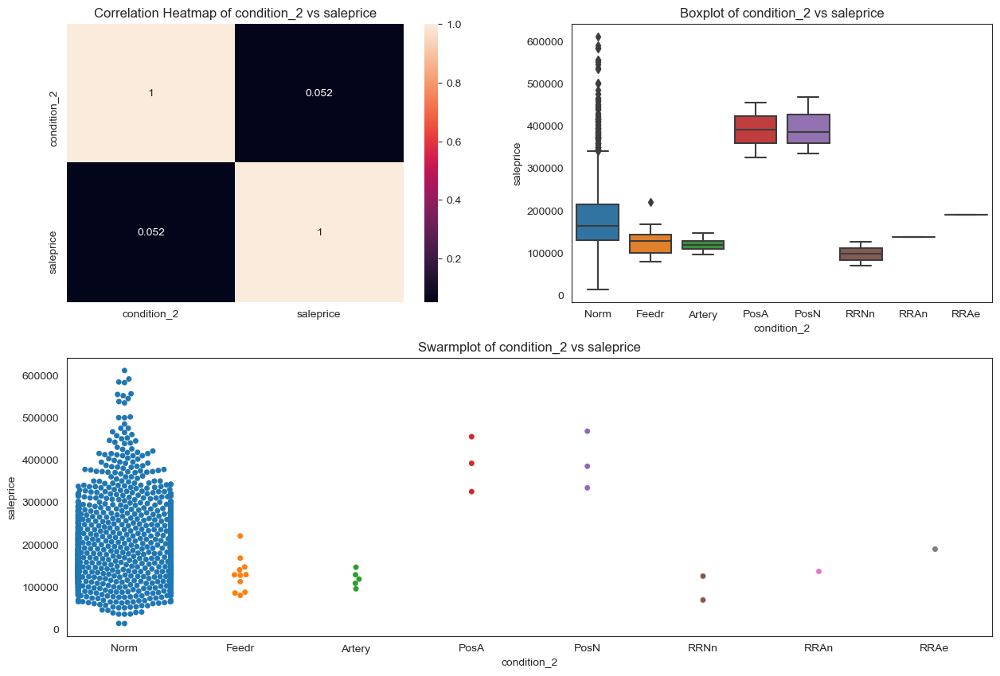

In [21]:
plot_non_num_col(rs, 'condition_2','saleprice')

<span style="color:orange">Conclusion</span>:
- `condition_2` has very weak correlation to saleprice 
- Boxplot shows that there are not much distribution across all elements.
- Swarmplot show that Norm element made up 98% of the observations 
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='bldg_type'></a>
### Building Type
[Top](#plot_dictionary)

,1Fam,TwnhsE,Duplex,Twnhs,2fmCon
bldg_type val_count,1697.000,161.000,75.000,69.000,46.000
bldg_type weight,0.829,0.079,0.037,0.034,0.022


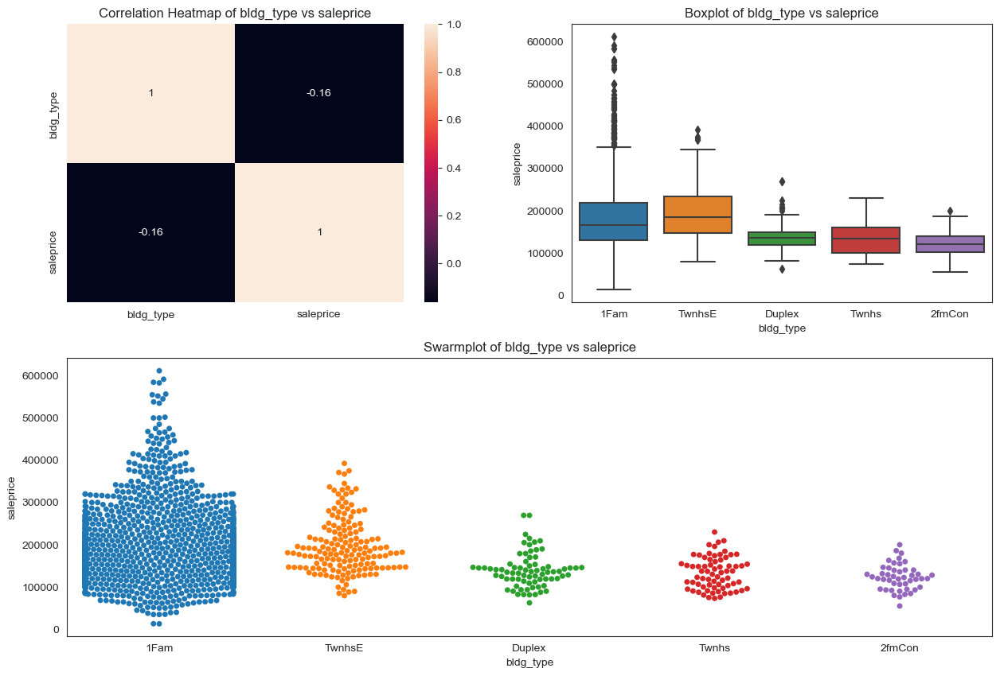

In [22]:
plot_non_num_col(rs, 'bldg_type','saleprice')

<span style="color:orange">Conclusion</span>:
- `bldg_type` has weak correlation to saleprice.
- Swarmplot & Boxplot do shown observations dominated by 1 element & the distributions are within a narrow range of price 0 - 300K
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='house_style'></a>
### House Style
[Top](#plot_dictionary)

,1Story,2Story,1.5Fin,SLvl,SFoyer,2.5Unf,1.5Unf,2.5Fin
house_style val_count,1057.000,597.000,218.000,94.000,50.000,14.000,12.000,6.000
house_style weight,0.516,0.292,0.106,0.046,0.024,0.007,0.006,0.003


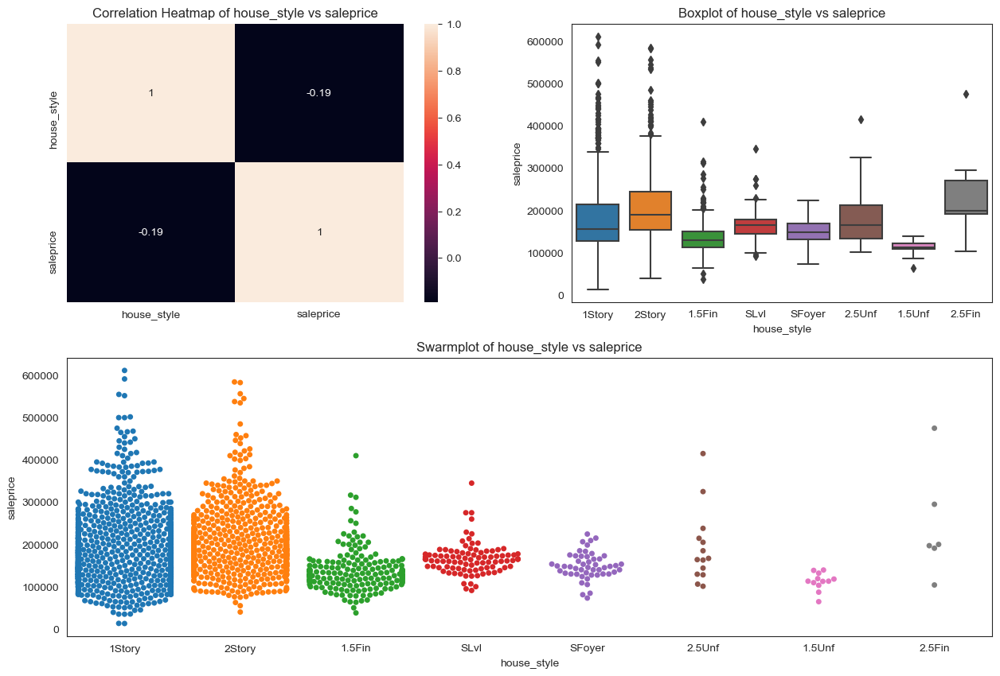

In [23]:
plot_non_num_col(rs, 'house_style','saleprice')

<span style="color:orange">Conclusion</span>: 
- Although `house_style` has weak negative correlation to sale price
- Boxplot & Swarmplot show a good spread across elements and price
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='overall_qual'></a>
### overall_qual
[Top](#plot_dictionary)

,5,6,7,8,4,9,3,10,2,1
overall_qual val_count,561.000,506.000,431.000,250.000,158.000,77.000,29.000,23.000,9.000,4.000
overall_qual weight,0.274,0.247,0.210,0.122,0.077,0.038,0.014,0.011,0.004,0.002


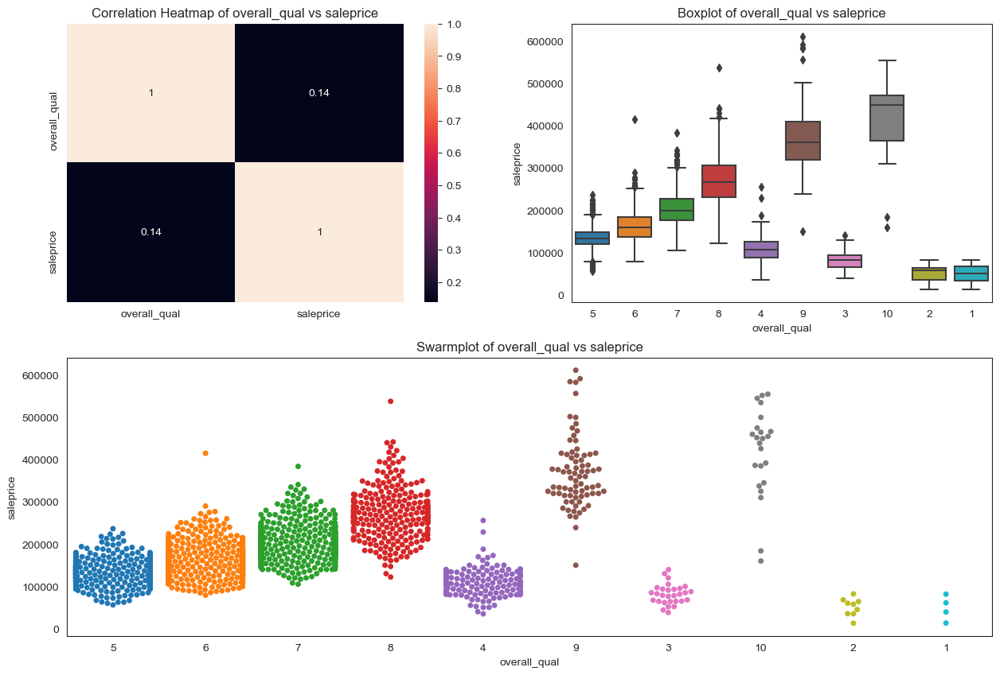

In [24]:
plot_non_num_col(rs, 'overall_qual', 'saleprice')

<span style="color:orange">Conclusion</span>: 
- From heatmap, `overall_qual` exhibit strong correlation wth saleprice
- Boxplot & Swarmplot show a good distribution across elements. 
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='overall_cond'></a>
### overall_cond
[Top](#plot_dictionary)

,5,6,7,8,4,3,9,2,1
overall_cond val_count,1168.000,367.000,268.000,101.000,70.000,35.000,29.000,6.000,4.000
overall_cond weight,0.570,0.179,0.131,0.049,0.034,0.017,0.014,0.003,0.002


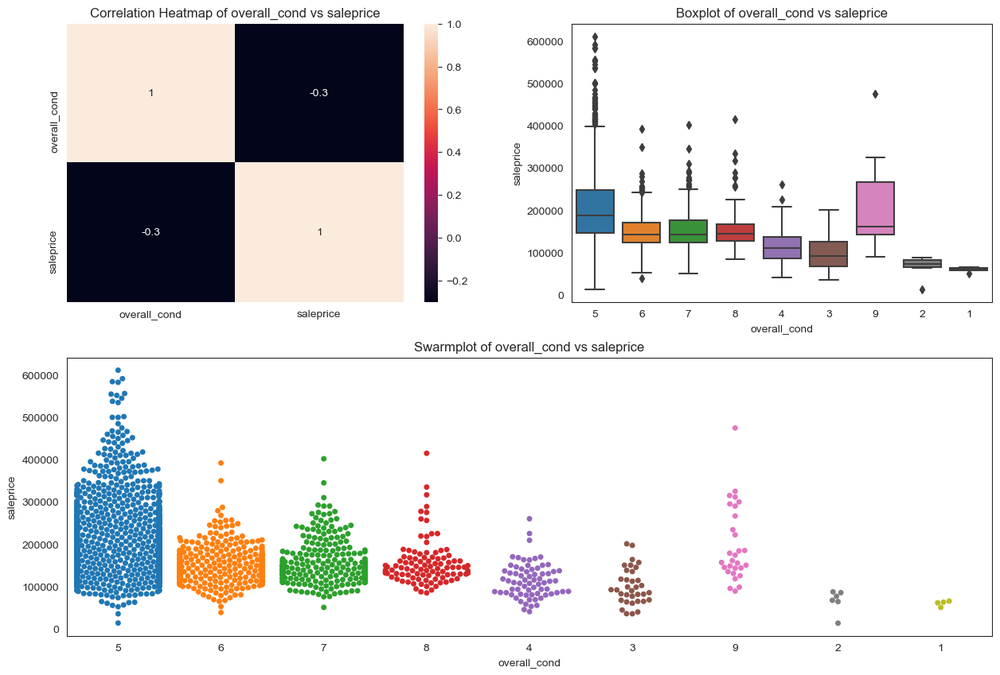

In [25]:
plot_non_num_col(rs, 'overall_cond', 'saleprice')

<span style="color:orange">Conclusion</span>:
- From heatmap, `overall_cond` exhibit strong correlation wth saleprice
- Boxplot & Swarmplot show a good distribution across elements. 
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='year_built'></a>
### year_built
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
year_built,2048.000,1971.751,30.174,1872.000,1954.000,1974.000,2001.000,2010.000


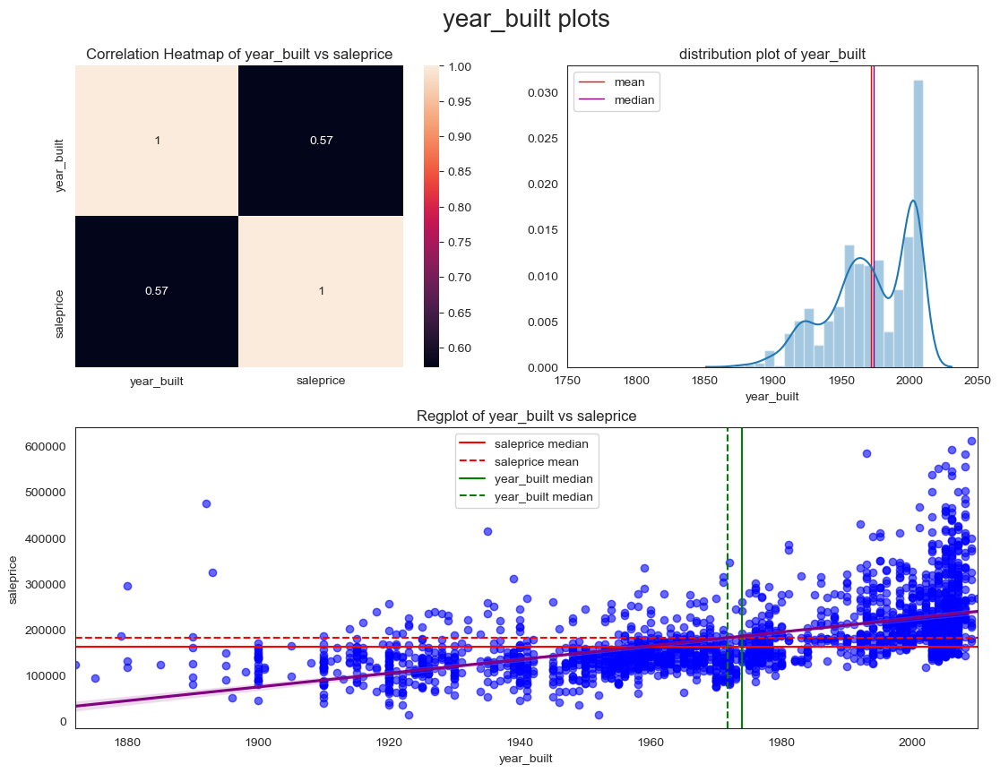

In [26]:
plot_num_col(rs, 'year_built', 'saleprice',displot_min_xlim=1750, displot_max_xlim= 2050)

<span style="color:orange">Conclusion</span>: 
- From heatmap, `year_built` exhibit moderate correlation wth saleprice.
- Regplot shows good spread of observation along regression line. 
- Observation are right skewed. Further feature analysis is required.
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='year_remod/add'></a>
### year_remod/add
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
year_remod/add,2048.000,1984.194,21.034,1950.000,1964.750,1993.000,2004.000,2010.000


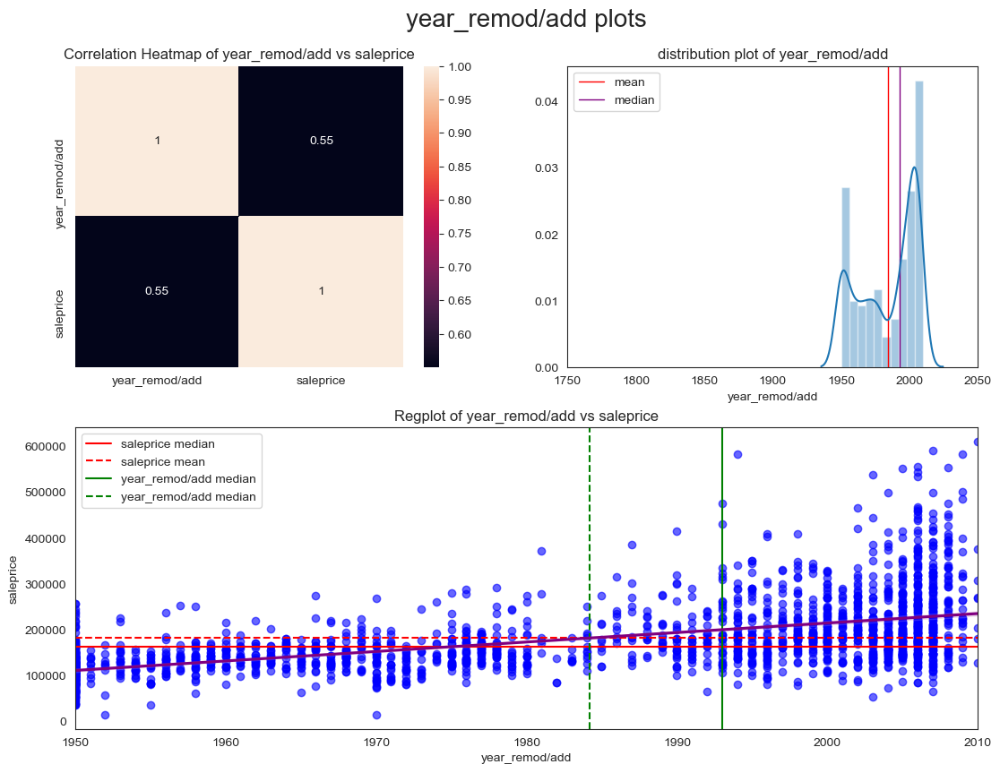

In [27]:
plot_num_col(rs, 'year_remod/add', 'saleprice',displot_min_xlim=1750, displot_max_xlim= 2050)

<span style="color:orange">Conclusion</span>:
- From heatmap, `year_remod/add` exhibit moderate correlation wth saleprice.
- Regplot shows good spread of observation along regression line. 
- Observation are right skewed.
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='roof_style'></a>
### Roof Style
[Top](#plot_dictionary)

,Gable,Hip,Flat,Gambrel,Mansard,Shed
roof_style val_count,1616.000,397.000,13.000,12.000,7.000,3.000
roof_style weight,0.789,0.194,0.006,0.006,0.003,0.001


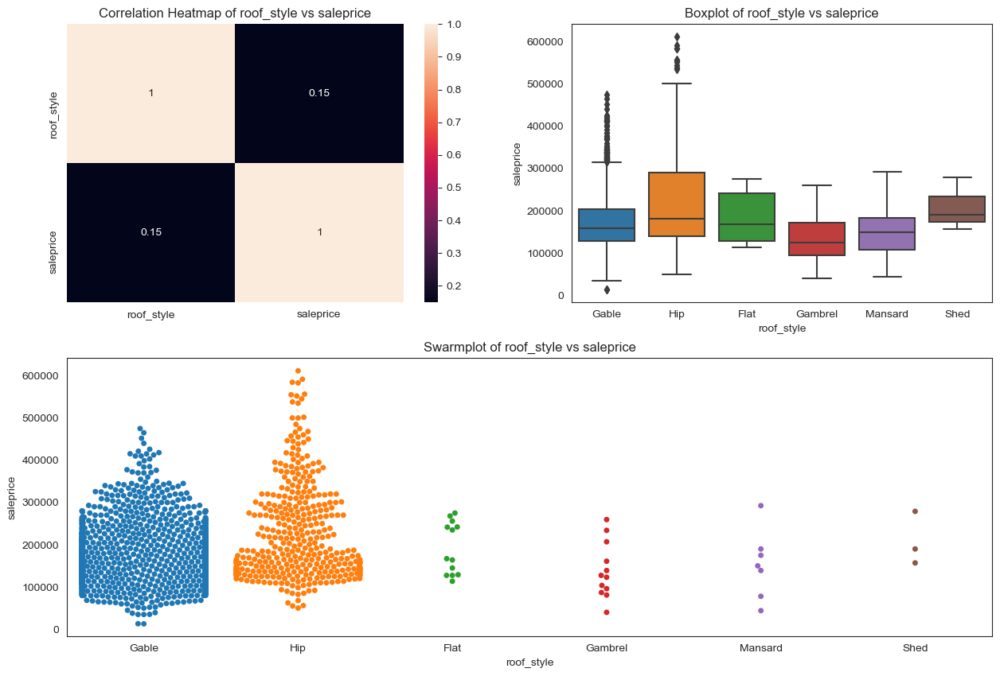

In [28]:
plot_non_num_col(rs, 'roof_style','saleprice')

<span style="color:orange">Conclusion</span>:
- `roof_style` has low correlation to sale price
- From Boxplot, most of the elements observed are within a narrow range of price: 0 - 300K
- Swarmplot the top 2 element make up almost 97% of the total observations. 
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='roof_matl'></a>
### Roof Material
[Top](#plot_dictionary)

,CompShg,Tar&Grv,WdShngl,WdShake,Membran,ClyTile
roof_matl val_count,2022.000,15.000,5.000,4.000,1.000,1.000
roof_matl weight,0.987,0.007,0.002,0.002,0.000,0.000


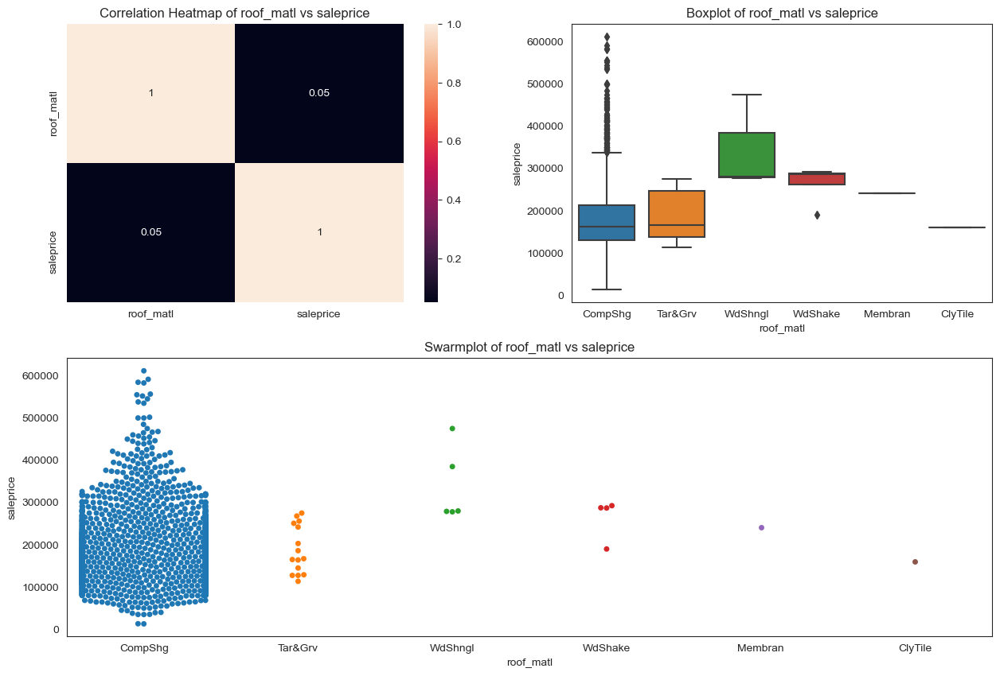

In [29]:
plot_non_num_col(rs, 'roof_matl','saleprice')

<span style="color:orange">Conclusion</span>: 
- `roof_matl` has low correlation to sale price
- Boxplot shows that some elements have almost non-existent inter-quartile range over a narrow range of price.
- From Swarmplot `CompShg` is almost 99% of observations
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='exterior_1st'></a>
### Exterior_1st
[Top](#plot_dictionary)

,VinylSd,MetalSd,HdBoard,Wd Sdng,Plywood,CemntBd,BrkFace,WdShing,AsbShng,Stucco,BrkComm,CBlock,Stone,ImStucc,AsphShn
exterior_1st val_count,724.000,330.000,300.000,275.000,151.000,90.000,64.000,45.000,33.000,27.000,3.000,2.000,2.000,1.000,1.000
exterior_1st weight,0.354,0.161,0.146,0.134,0.074,0.044,0.031,0.022,0.016,0.013,0.001,0.001,0.001,0.000,0.000


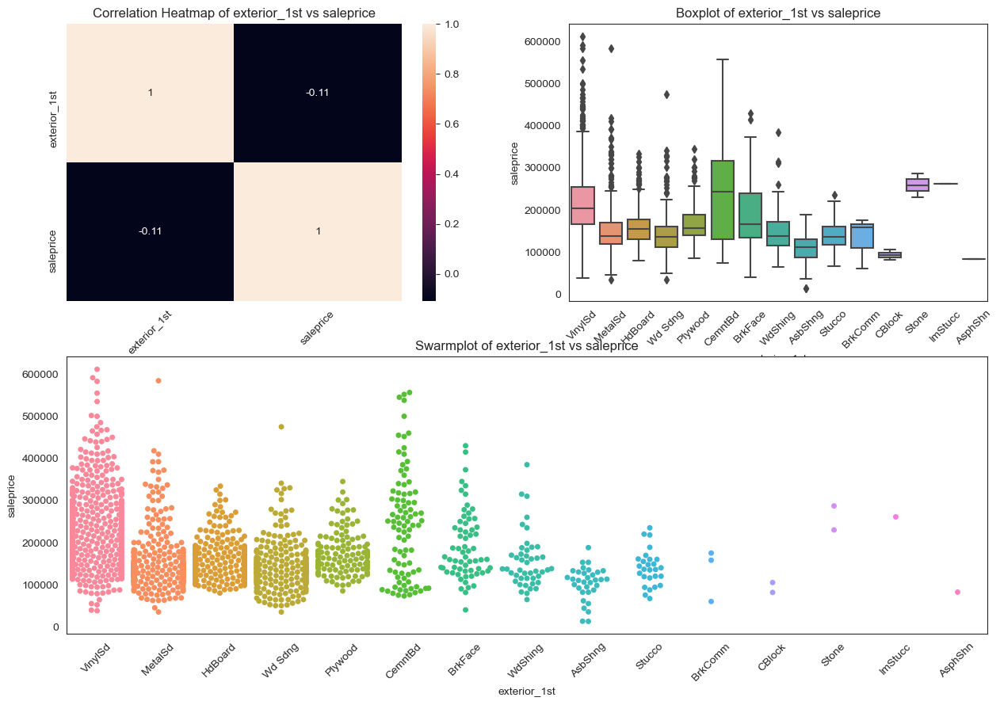

In [30]:
plot_non_num_col(rs, 'exterior_1st','saleprice', xlabrot=45)

<span style="color:orange">Conclusion</span>:
- `exterior_1st` has weak correlation to sale price
- Boxplot & Swarmplot show a good distribution across elements and across price range. Though some elements have almost non-existent IQR
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='exterior_2nd'></a>
### Exterior_2nd
[Top](#plot_dictionary)

,VinylSd,MetalSd,HdBoard,Wd Sdng,Plywood,CmentBd,Wd Shng,BrkFace,Stucco,AsbShng,Brk Cmn,ImStucc,Stone,AsphShn,CBlock
exterior_2nd val_count,721.000,324.000,275.000,262.000,183.000,90.000,63.000,34.000,30.000,28.000,17.000,11.000,6.000,3.000,1.000
exterior_2nd weight,0.352,0.158,0.134,0.128,0.089,0.044,0.031,0.017,0.015,0.014,0.008,0.005,0.003,0.001,0.000


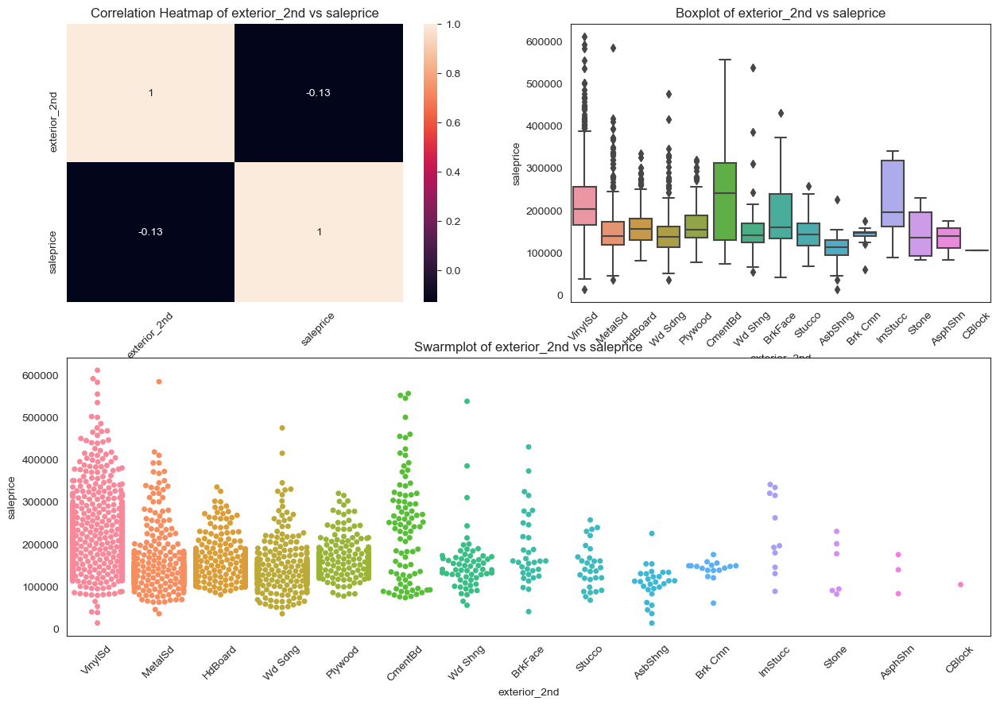

In [31]:
plot_non_num_col(rs, 'exterior_2nd','saleprice', xlabrot=45)

<span style="color:orange">Conclusion</span>: 
- `exterior_2nd` has weak correlation to sale price
- Boxplot & Swarmplot show a good distribution across elements and across price range. Though some elements have almost non-existent IQR
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='mas_vnr_type'></a>
### Mas Vnr Type
[Top](#plot_dictionary)

,None,BrkFace,Stone,BrkCmn
mas_vnr_type val_count,1237.000,630.000,168.000,13.000
mas_vnr_type weight,0.604,0.308,0.082,0.006


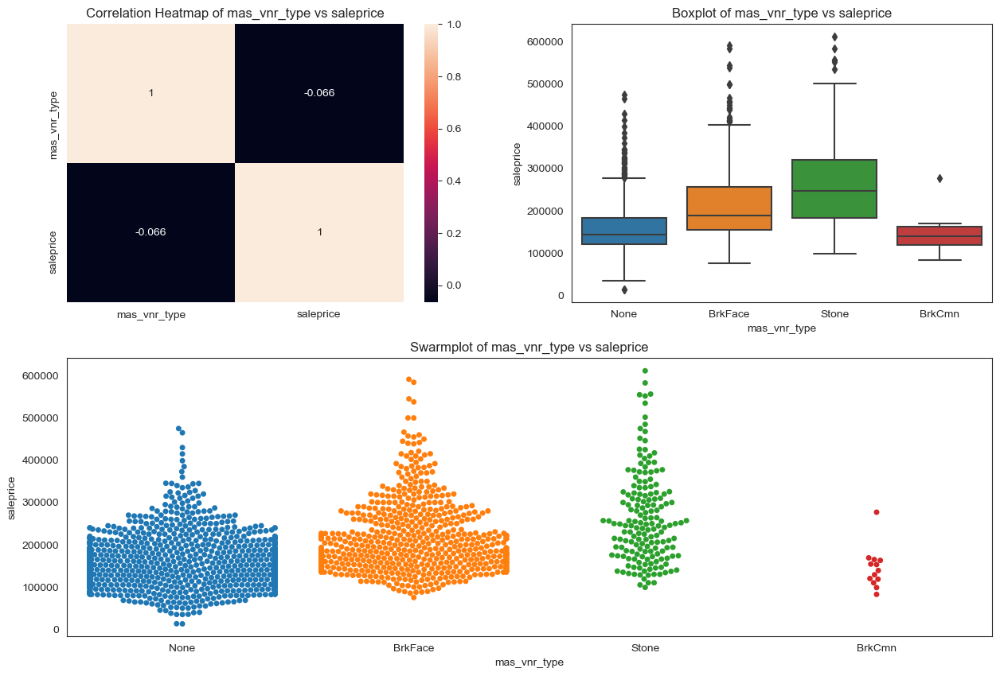

In [32]:
plot_non_num_col(rs, 'mas_vnr_type','saleprice')

<span style="color:orange">Conclusion</span>: 
- `mas_vnr_type` has very weak correlation to sale price
- From Swarmplot, top 2 elements is almost 90% of observations
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span> 

<a id='vnr_area'></a>
### mas_vnr_area
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
mas_vnr_area,2048.000,98.771,174.411,0.000,0.000,0.000,160.000,1600.000


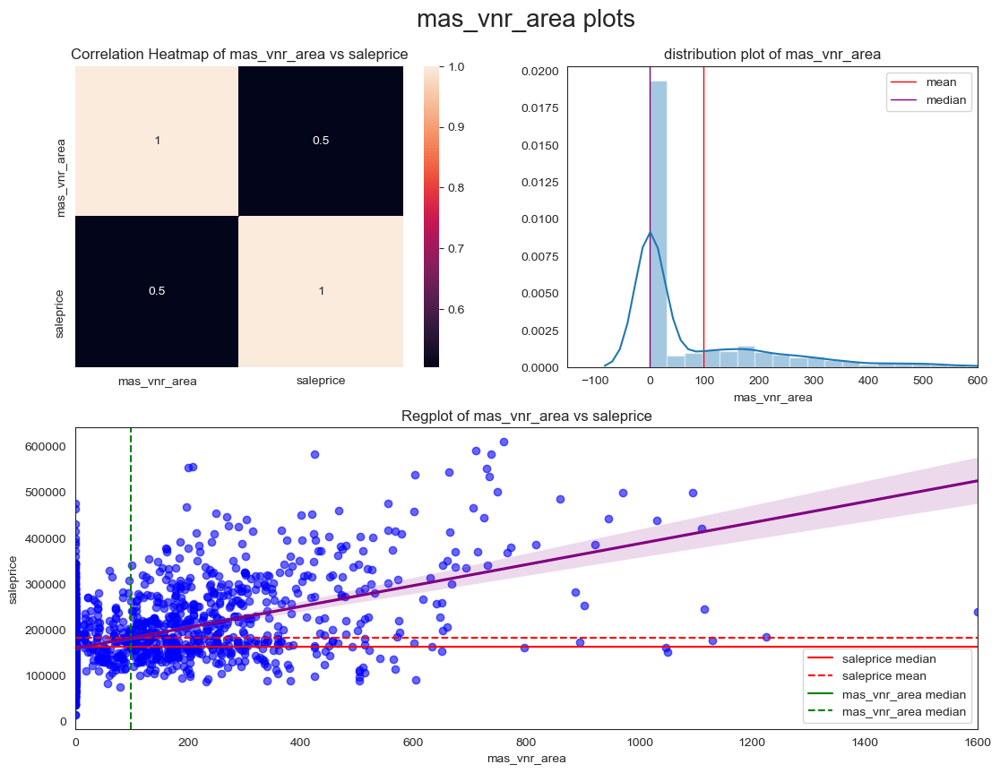

In [33]:
plot_num_col(rs, 'mas_vnr_area', 'saleprice',displot_min_xlim=-150, displot_max_xlim= 600)

<span style="color:orange">Conclusion</span>:
- From heatmap, `mas_vnr_area` exhibit moderate correlation wth saleprice
- Regplot do show a linear relationship between `mas_vnr_area` and `saleprice` but with alot of observations at 0 (no mas_vnr_area) 
- This is confirmed by the distplot where the data is left-skewed with median at 0.
- Variable will be used for modeling as it contradict business wisdom & data observation to discard as non-important

<a id='exter_qual'></a>
### Exter_qual
[Top](#plot_dictionary)

,TA,Gd,Ex,Fa
exter_qual val_count,1244.000,697.000,81.000,26.000
exter_qual weight,0.607,0.340,0.040,0.013


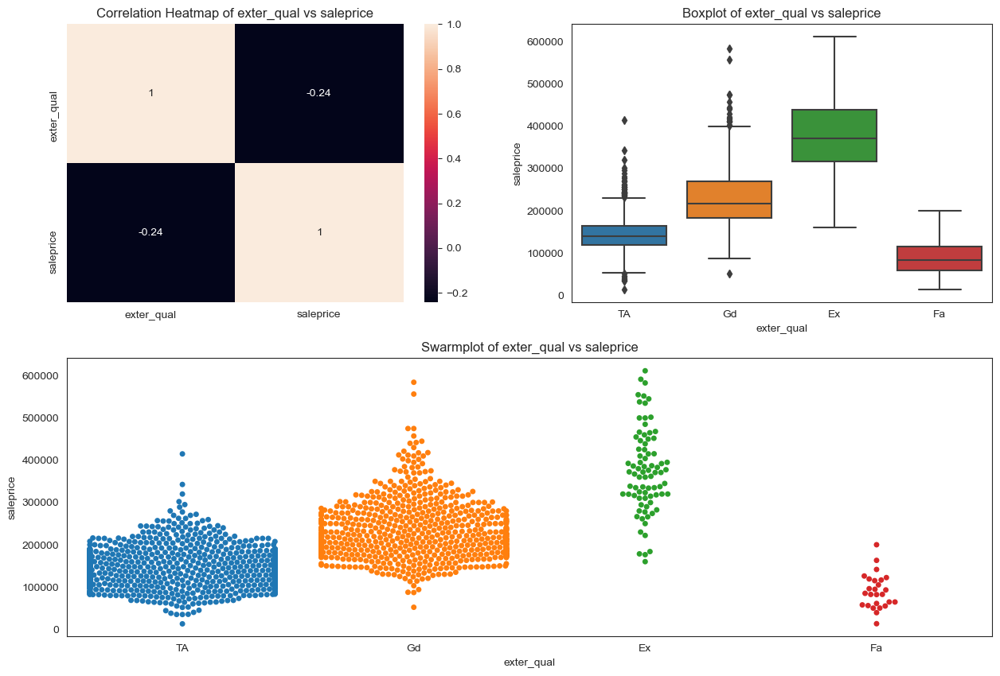

In [34]:
plot_non_num_col(rs, 'exter_qual','saleprice')

<span style="color:orange">Conclusion</span>:
- `exter_qual` has weak correlation to sale price.
- Boxplot shows a good spread of elements across price range
- Swarmplot shows that 2 of the elements made up almost 96% of all the observations.
- Variable will be used for modeling as it contradict business wisdom to discard as non-important.

<a id='exter_cond'></a>
### Exter_cond
[Top](#plot_dictionary)

,TA,Gd,Fa,Ex,Po
exter_cond val_count,1775.000,215.000,49.000,7.000,2.000
exter_cond weight,0.867,0.105,0.024,0.003,0.001


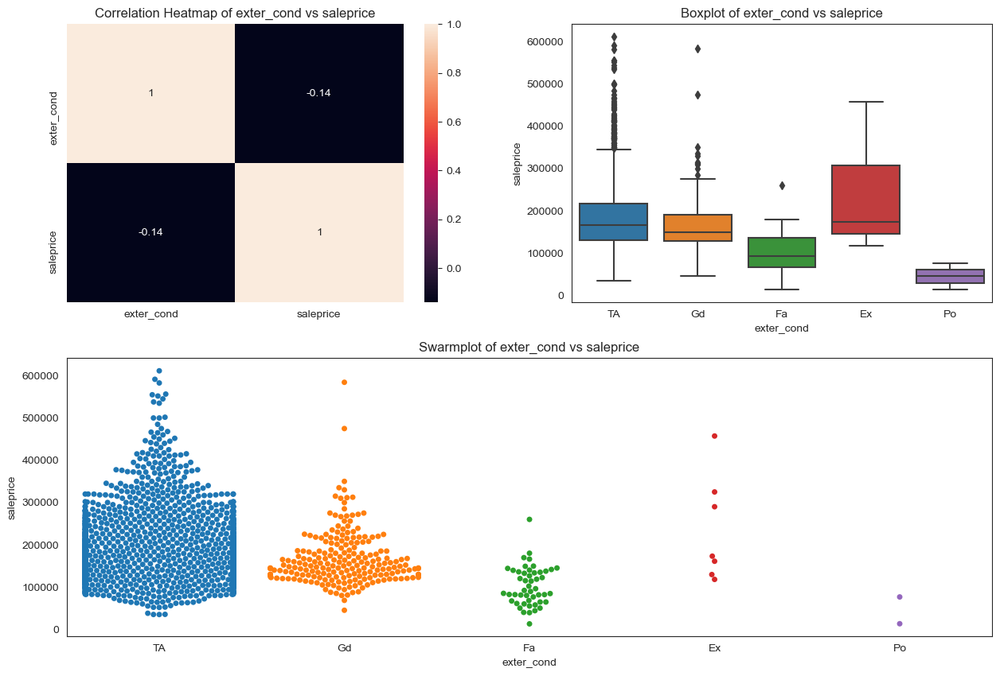

In [35]:
plot_non_num_col(rs, 'exter_cond','saleprice')

<a id='foundation'></a>
### Foundation
[Top](#plot_dictionary)

,PConc,CBlock,BrkTil,Slab,Stone,Wood
foundation val_count,925.000,863.000,220.000,33.000,5.000,2.000
foundation weight,0.452,0.421,0.107,0.016,0.002,0.001


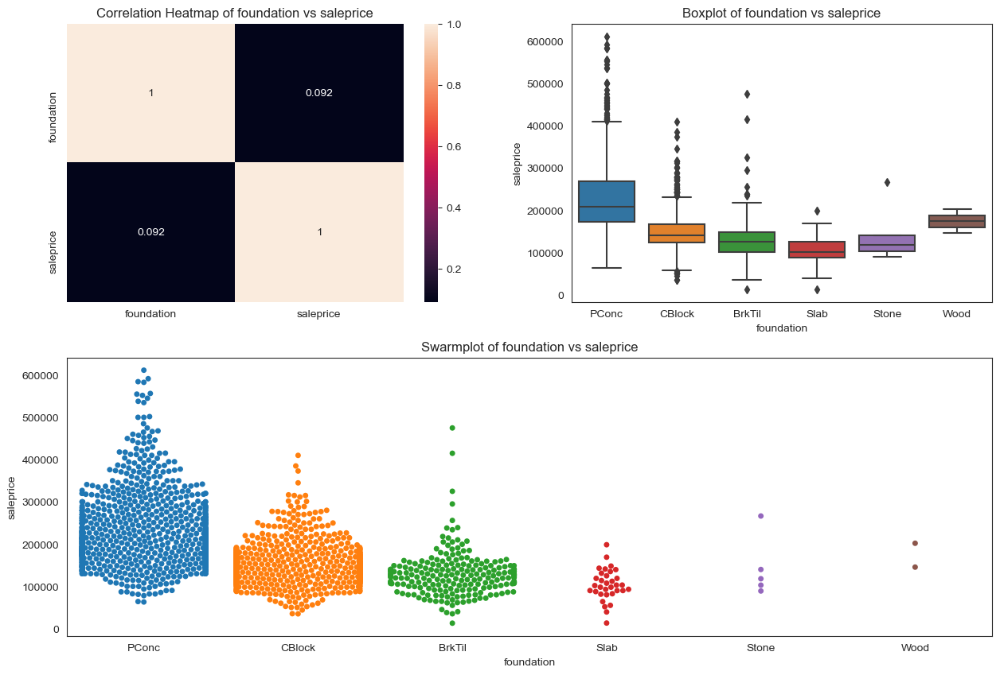

In [36]:
plot_non_num_col(rs, 'foundation','saleprice')

<span style="color:orange">Conclusion</span>:
- `foundation` has very weak correlation to sale price
- Boxplot shows that most of the elements are within a narrow range of price.
- Swarmplot show that there is a spread of observations across elements.
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='bsmt_qual'></a>
### bsmt_qual
[Top](#plot_dictionary)

,TA,Gd,Ex,Fa,None,Po
bsmt_qual val_count,887.000,863.000,184.000,60.000,53.000,1.000
bsmt_qual weight,0.433,0.421,0.090,0.029,0.026,0.000


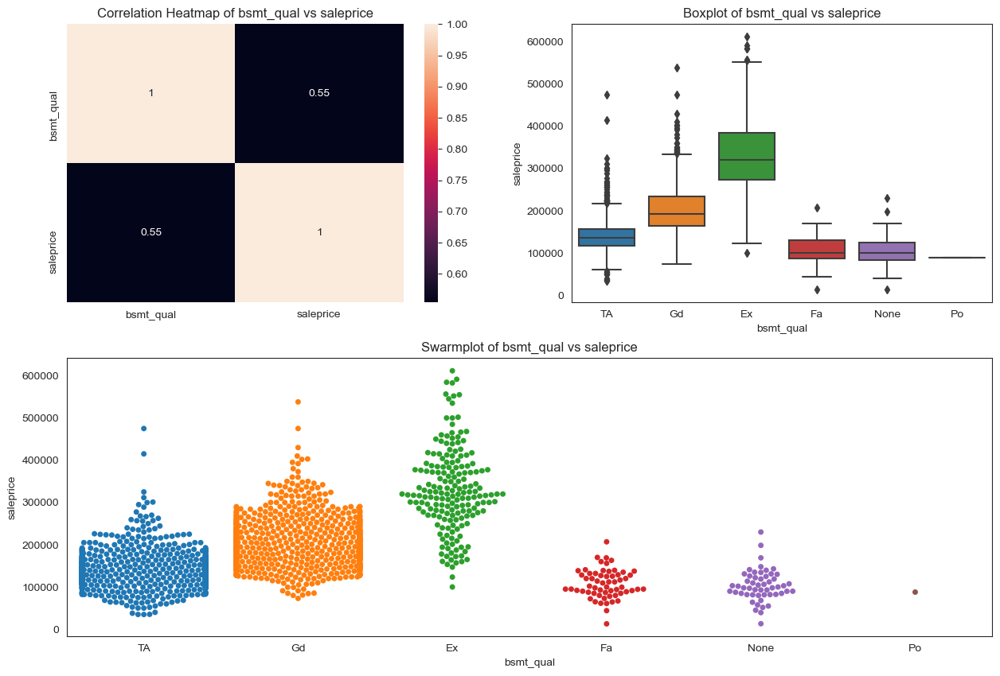

In [37]:
plot_non_num_col(rs, 'bsmt_qual','saleprice')

<span style="color:orange">Conclusion</span>: 
- `exter_cond` has weak correlation to sale price.
- Boxplot show a good spread across price range
- Swarmplot show a good distribution across elements. 
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='bsmt_cond'></a>
### bsmt_cond
[Top](#plot_dictionary)

,TA,Gd,Fa,None,Po,Ex
bsmt_cond val_count,1833.000,89.000,65.000,53.000,5.000,3.000
bsmt_cond weight,0.895,0.043,0.032,0.026,0.002,0.001


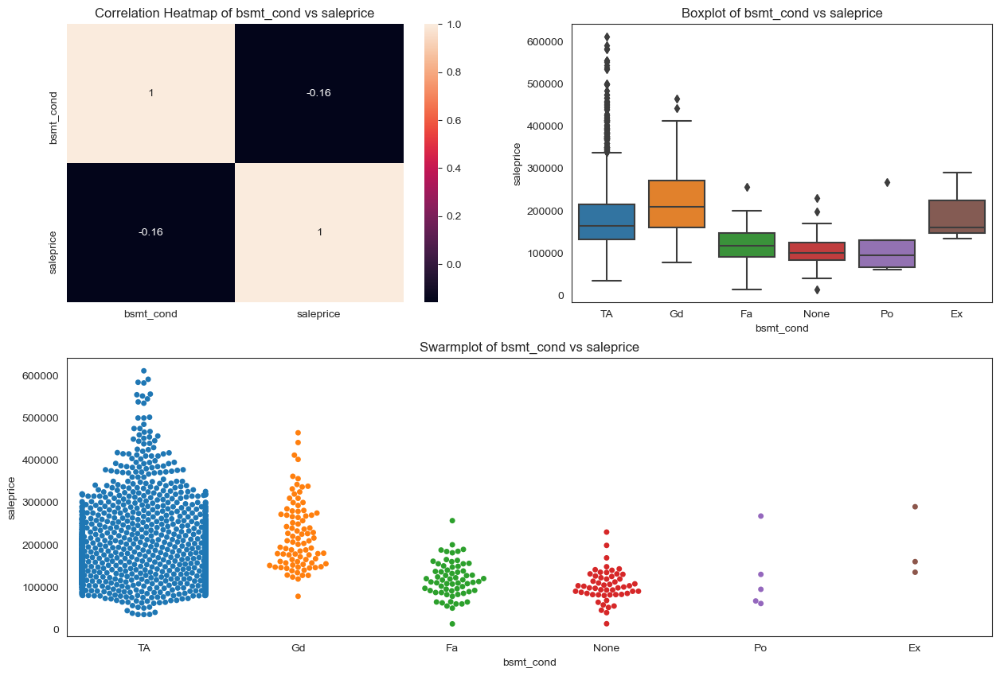

In [38]:
plot_non_num_col(rs, 'bsmt_cond','saleprice')

<span style="color:orange">Conclusion</span>: 
- `bsmt_cond` has low correlation to sale price
- Boxplot shows a good spread across price range
- From swarmplot the top 2 elements is almost 93% of observations,
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='bsmt_exposure'></a>
### bsmt_exposure
[Top](#plot_dictionary)

,No,Av,Gd,Mn,None
bsmt_exposure val_count,1338.000,288.000,203.000,163.000,56.000
bsmt_exposure weight,0.653,0.141,0.099,0.080,0.027


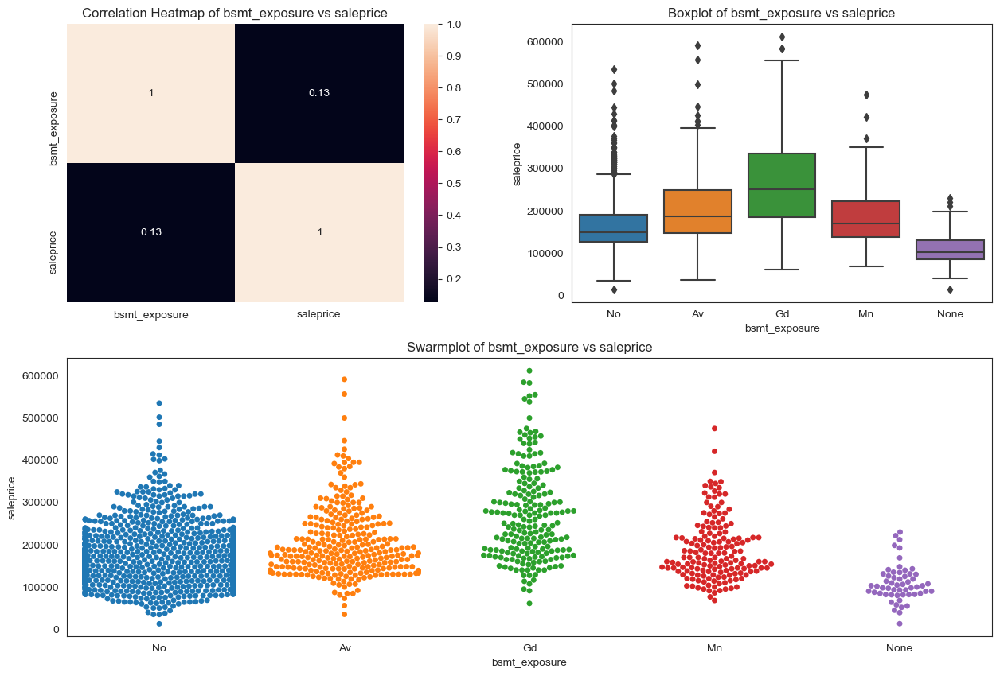

In [39]:
plot_non_num_col(rs, 'bsmt_exposure','saleprice')

<span style="color:orange">Conclusion</span>:
- `bsmt_exposure` has weak correlation to sale price
- Boxplot & Swarmplot show a good distribution across price and elements. 
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='bsmtfin_type_1'></a>
### bsmtfin_type_1
[Top](#plot_dictionary)

,GLQ,Unf,ALQ,BLQ,Rec,LwQ,None
bsmtfin_type_1 val_count,615.000,603.000,292.000,200.000,183.000,102.000,53.000
bsmtfin_type_1 weight,0.300,0.294,0.143,0.098,0.089,0.050,0.026


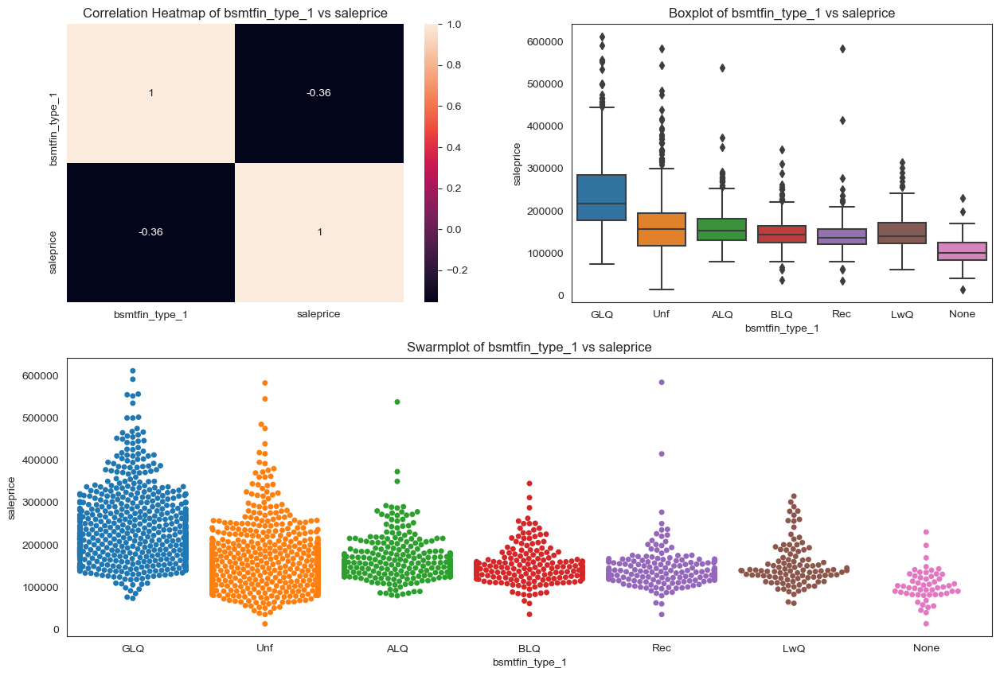

In [40]:
plot_non_num_col(rs, 'bsmtfin_type_1','saleprice')

<span style="color:orange">Conclusion</span>:
- `bsmtfin_type_1` has weak negative correlation to sale price
- Boxplot & Swarmplot show a good distribution across price and elements. 
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='bsmtfin_type_2'></a>
### bsmtfin_type_2
[Top](#plot_dictionary)

,Unf,Rec,LwQ,None,BLQ,ALQ,GLQ
bsmtfin_type_2 val_count,1748.000,80.000,60.000,54.000,48.000,35.000,23.000
bsmtfin_type_2 weight,0.854,0.039,0.029,0.026,0.023,0.017,0.011


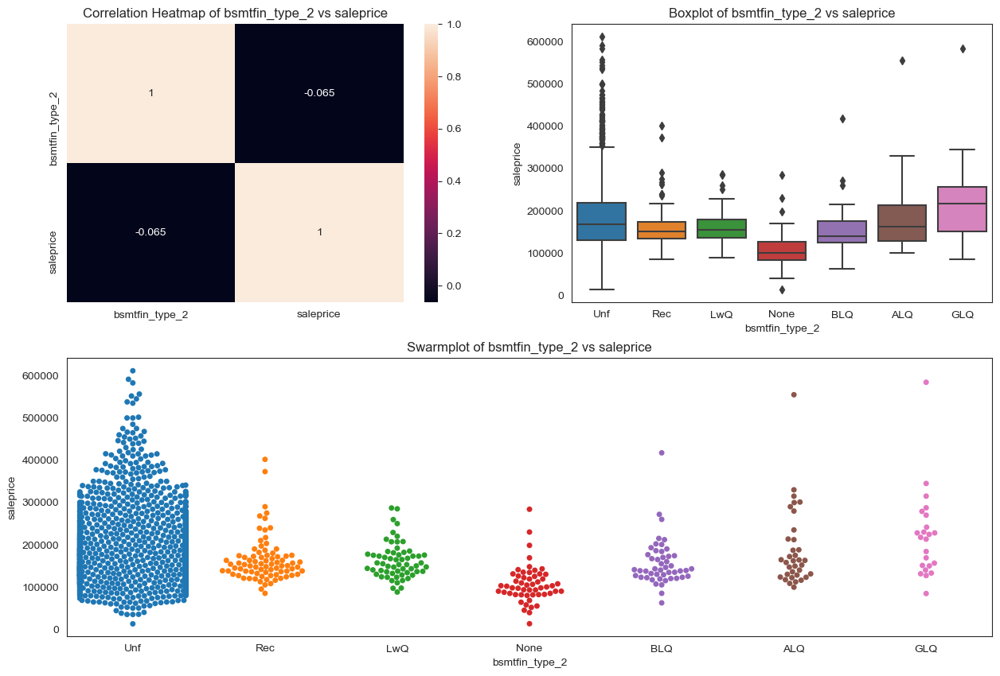

In [41]:
plot_non_num_col(rs, 'bsmtfin_type_2','saleprice')

<span style="color:orange">Conclusion</span>:
- `bsmtfin_type_2` has very weak correlation to sale price
- Boxplot show a good distribution across price
- Swarmplot shows that Unf made up most of the observation and the rest of the elements shows almost equal distribution among them.
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='bsmtfin_sf_1'></a>
### bsmtfin_sf_1
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
bsmtfin_sf_1,2048.000,442.465,461.320,0.000,0.000,368.000,734.000,5644.000


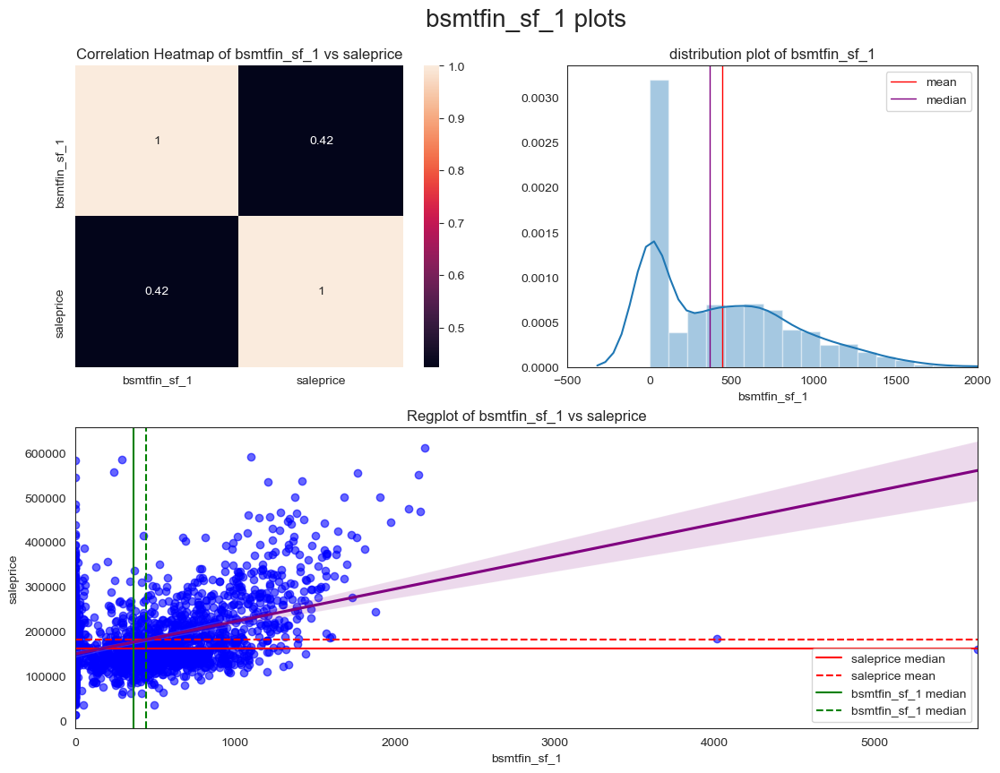

In [42]:
plot_num_col(rs, 'bsmtfin_sf_1', 'saleprice',displot_min_xlim=-500, displot_max_xlim= 2000)

<span style="color:orange">Conclusion</span>:
- From heatmap, `bsmtfin_sf_1` exhibit weak correlation wth saleprice. This may be due to the dependency of the feature eg. bsmtfin_sf_1 and bsmt full bath.
- Regplot do show a linear relationship between `bsmtfin_sf_1` and `saleprice` but with alot of observations at 0. 
- This is confirmed by the distplot where the data is left-skewed with median at 0.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='bsmt_sf_2'></a>
### bsmtfin_sf_2
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
bsmtfin_sf_2,2048.000,48.006,165.075,0.000,0.000,0.000,0.000,1474.000


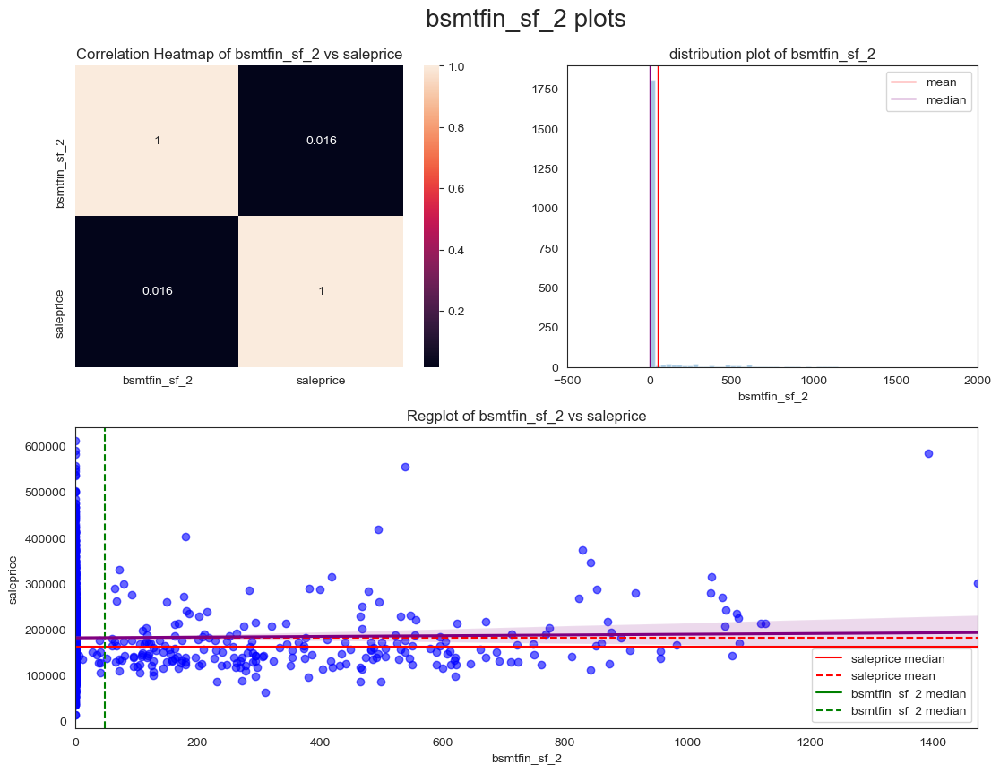

In [43]:
plot_num_col(rs, 'bsmtfin_sf_2', 'saleprice',displot_min_xlim=-500, displot_max_xlim= 2000, dist_kde=False)

<span style="color:orange">Conclusion</span>:
- From heatmap, `bsmtfin_sf_2` exhibit very weak correlation wth saleprice.
- Regplot shows that all values are at 0 and confirmed by distplot.
- Distplot shows almost not existent trend with saleprice.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='bsmt_unf_sf'></a>
### bsmt_unf_sf
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
bsmt_unf_sf,2048.000,568.131,444.959,0.000,220.000,475.000,811.000,2336.000


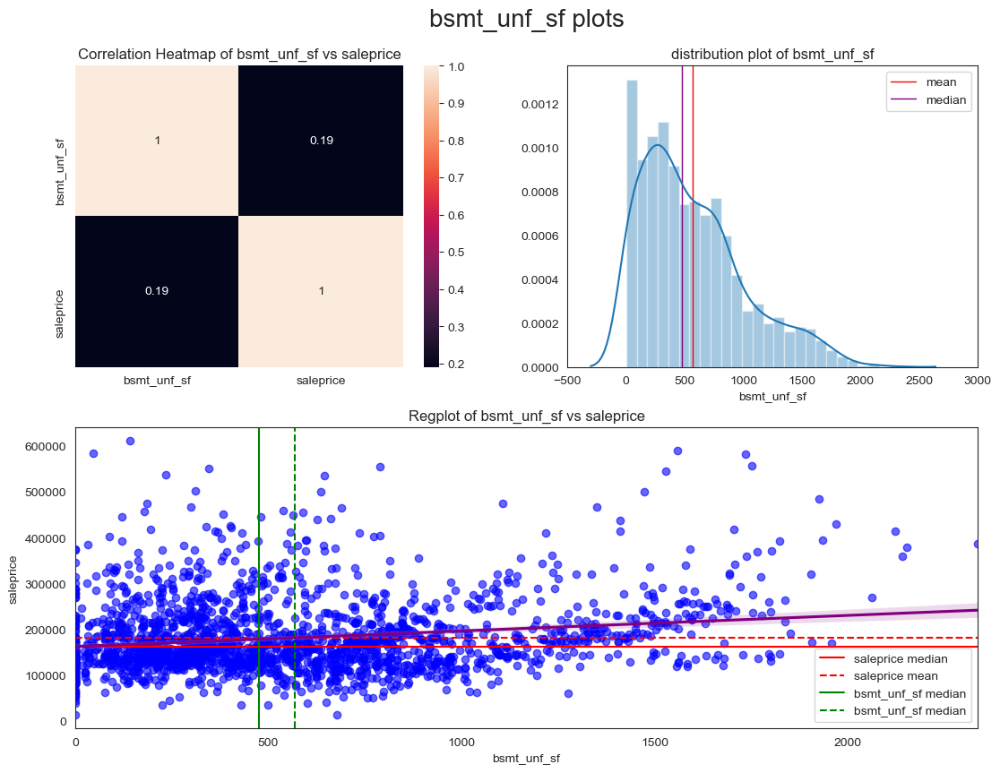

In [44]:
plot_num_col(rs, 'bsmt_unf_sf', 'saleprice',displot_min_xlim=-500, displot_max_xlim= 3000)

<span style="color:orange">Conclusion</span>:
- From heatmap, `bsmt_unf_sf` exhibit weak correlation wth saleprice. This may be due to the dependency of the feature eg. bsmt_unf_sf and bsmt full bath.
- Regplot do show a linear relationship between `bsmt_unf_sf` and `saleprice` but with most observations at 0.  
- This is confirmed by the distplot where the data is left-skewed with median at 0.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='total_bsmt_sf'></a>
### total_bsmt_sf
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
total_bsmt_sf,2048.000,1058.602,449.000,0.000,793.000,995.500,1319.000,6110.000


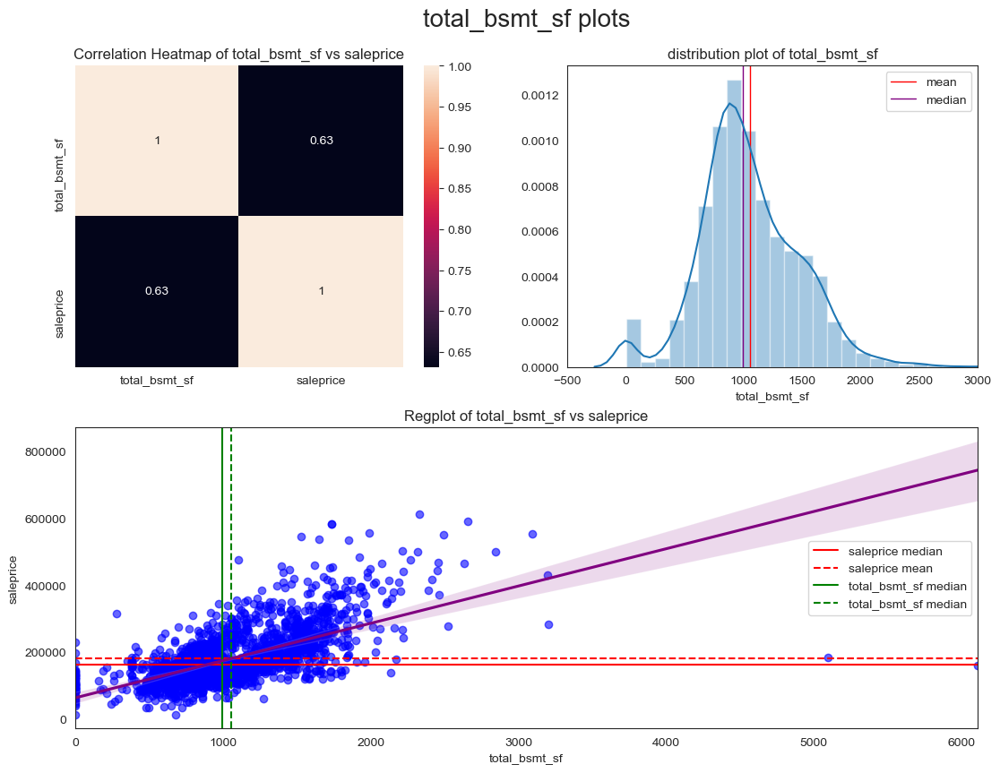

In [45]:
plot_num_col(rs, 'total_bsmt_sf', 'saleprice',displot_min_xlim=-500, displot_max_xlim= 3000)

<span style="color:orange">Conclusion</span>:
- From heatmap, `total_bsmt_sf` exhibit moderate correlation wth saleprice. 
- Regplot do show a linear relationship between `total_bsmt_sf` and `saleprice` but with observation clustering around the mean & median.
- This is confirmed by the distplot where the data is left-skewed but do display semblance to a normal distributed curve.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='heating'></a>
### heating
[Top](#plot_dictionary)

,GasA,GasW,Wall,Grav,OthW
heating val_count,2015.000,20.000,6.000,5.000,2.000
heating weight,0.984,0.010,0.003,0.002,0.001


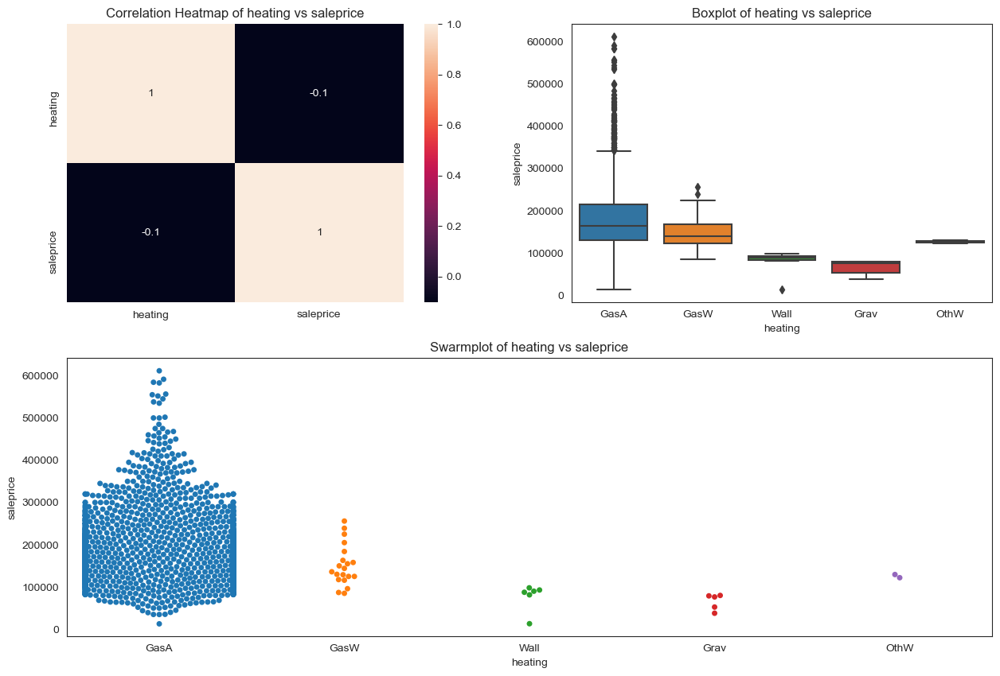

In [46]:
plot_non_num_col(rs, 'heating','saleprice')

<span style="color:orange">Conclusion</span>:
- `heating` has weak correlation to sale price
- Boxplot show distribution across a narrow range of price.
- Swarmplot show that GasA made up almost 98% of the observation.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='heating_qc'></a>
### heating_qc
[Top](#plot_dictionary)

,Ex,TA,Gd,Fa,Po
heating_qc val_count,1064.000,595.000,319.000,67.000,3.000
heating_qc weight,0.520,0.291,0.156,0.033,0.001


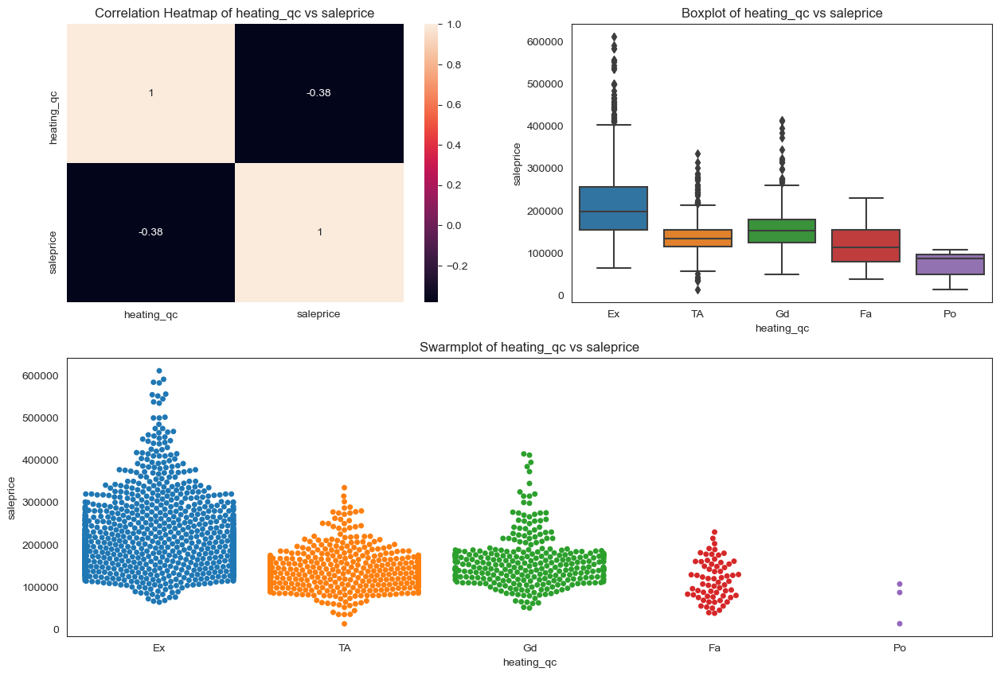

In [47]:
plot_non_num_col(rs, 'heating_qc','saleprice')

<span style="color:orange">Conclusion</span>: 
- `heating_qc` has weak negative correlation to sale price.
- Boxplot and swarmplot show good distribution across price and elements. 
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='central_air'></a>
### central_air
[Top](#plot_dictionary)

,Y,N
central_air val_count,1907.000,141.000
central_air weight,0.931,0.069


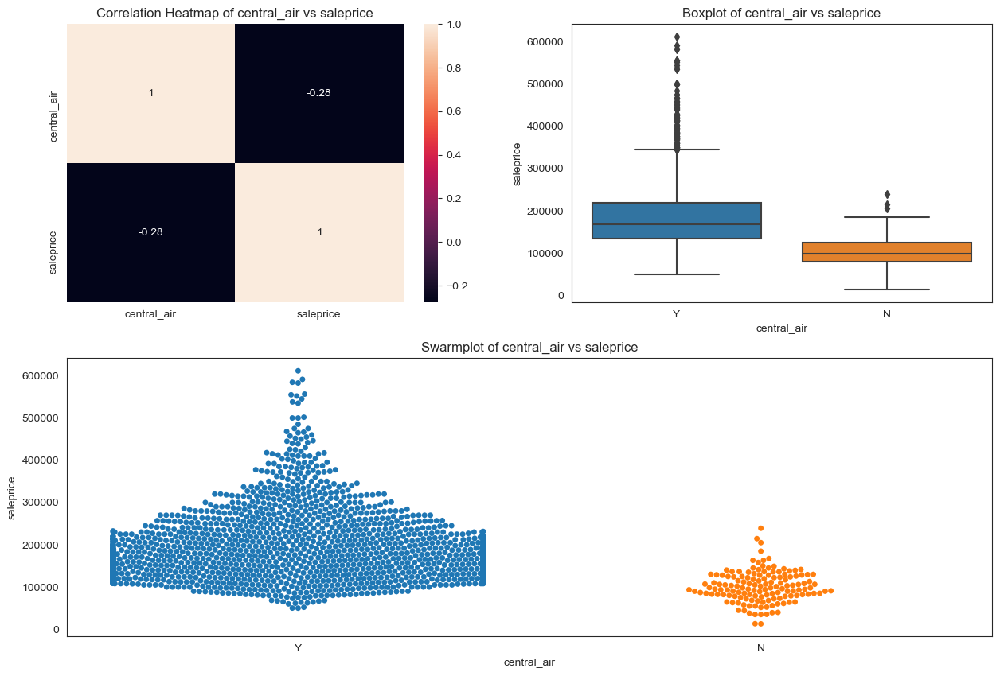

In [48]:
plot_non_num_col(rs, 'central_air','saleprice')

<span style="color:orange">Conclusion</span>: 
- `central_air` has weak negative correlation to sale price. 
- Boxplot and swarmplot show most observations are made up of 'Y'
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='electrical'></a>
### electrical
[Top](#plot_dictionary)

,SBrkr,FuseA,FuseF,FuseP,Mix
electrical val_count,1866.000,139.000,35.000,7.000,1.000
electrical weight,0.911,0.068,0.017,0.003,0.000


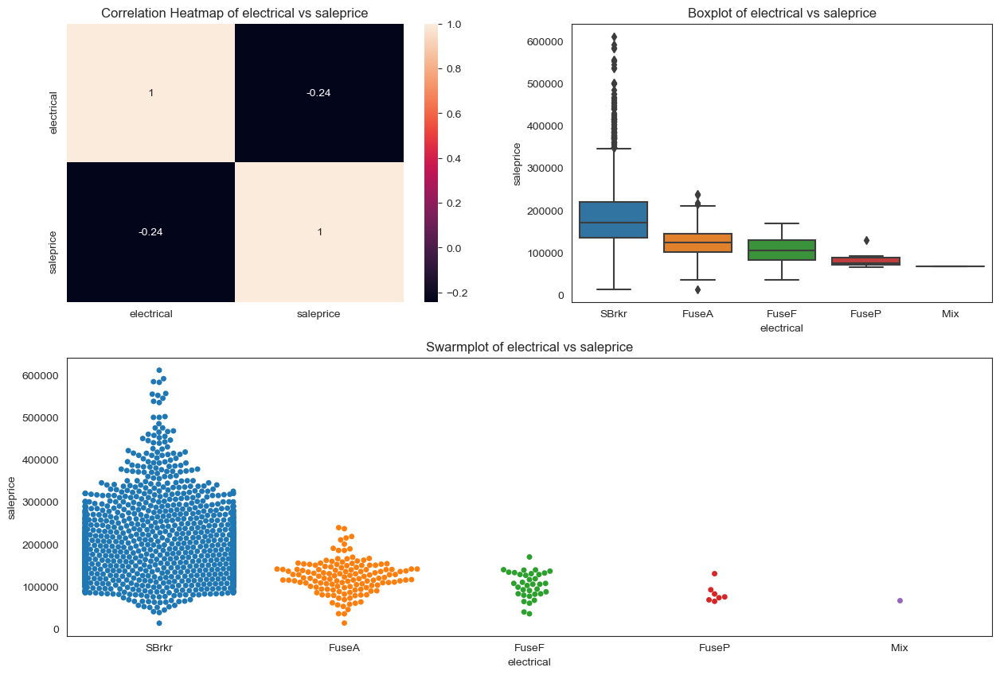

In [49]:
plot_non_num_col(rs, 'electrical','saleprice')

<span style="color:orange">Conclusion</span>: 
- `electrical` has weak negative correlation to sale price. 
- Boxplot and swarmplot show most observations are made up of SBrkr
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='1st_flr_sf'></a>
### 1st_flr_sf
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
1st_flr_sf,2048.000,1163.431,392.295,334.000,879.000,1093.000,1405.000,5095.000


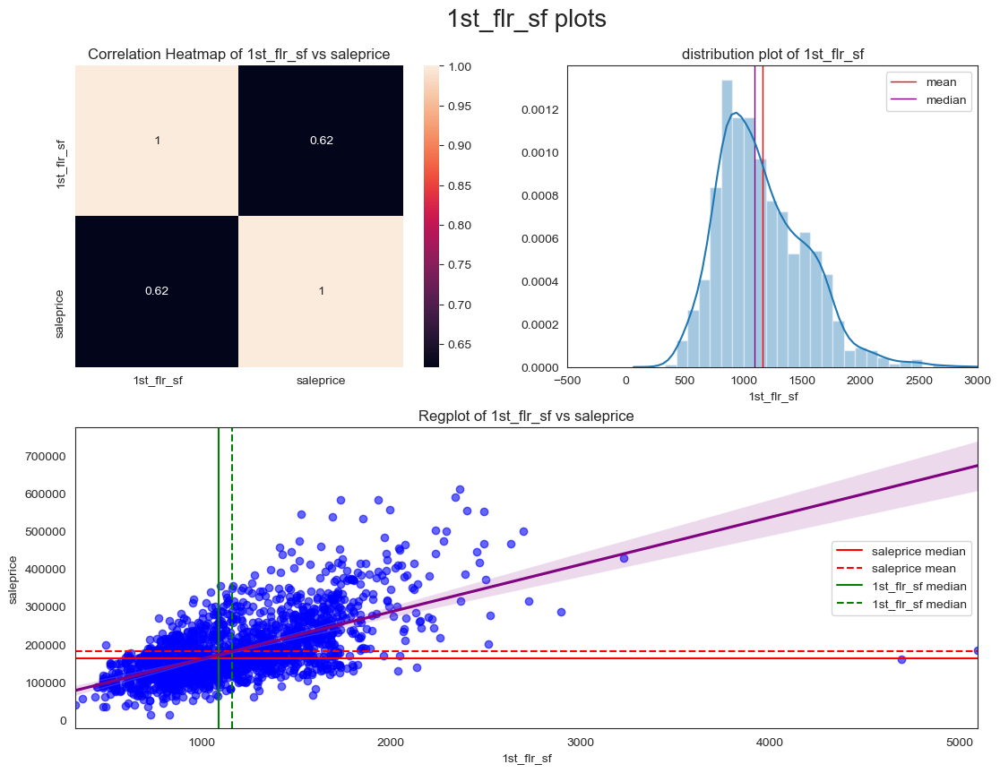

In [50]:
plot_num_col(rs, '1st_flr_sf', 'saleprice',displot_min_xlim=-500, displot_max_xlim= 3000)

<span style="color:orange">Conclusion</span>:
- From heatmap, `1st_flr_sf` exhibit moderate correlation wth saleprice.
- Regplot do show a linear relationship between `1st_flr_sf` and `saleprice` but with observation clustering around the mean & median.
- This is confirmed by the distplot where the data is left-skewed but do display semblance to a normal distributed curve.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='2nd_flr_sf'></a>
### 2nd_flr_sf
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
2nd_flr_sf,2048.000,329.379,425.681,0.000,0.000,0.000,691.750,1862.000


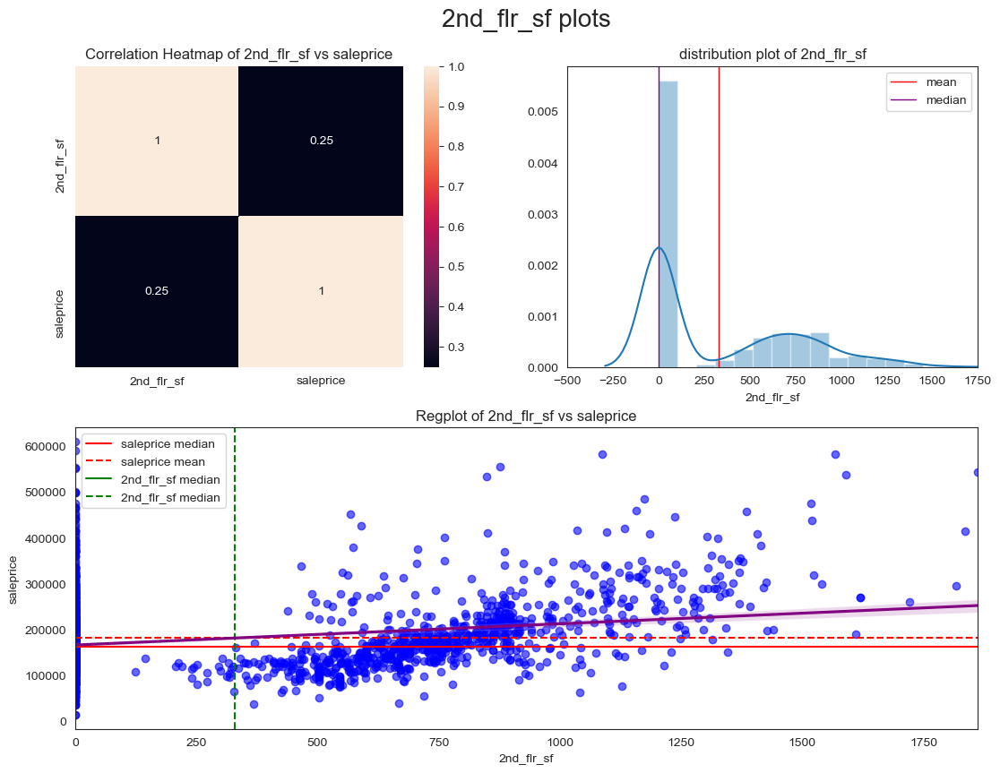

In [51]:
plot_num_col(rs, '2nd_flr_sf', 'saleprice',displot_min_xlim=-500, displot_max_xlim= 1750)

<span style="color:orange">Conclusion</span>:
- From heatmap, `2nd_flr_sf` exhibit weak correlation wth saleprice.
- Regplot do show a weak linear relationship between `2nd_flr_sf` and `saleprice` but with observation clustering around 0 and within 500-800 sf range.
- This is confirmed by the distplot where the data is left-skewed.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='low_qual_fin_sf'></a>
### low_qual_fin_sf
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
low_qual_fin_sf,2048.000,5.521,51.106,0.000,0.000,0.000,0.000,1064.000


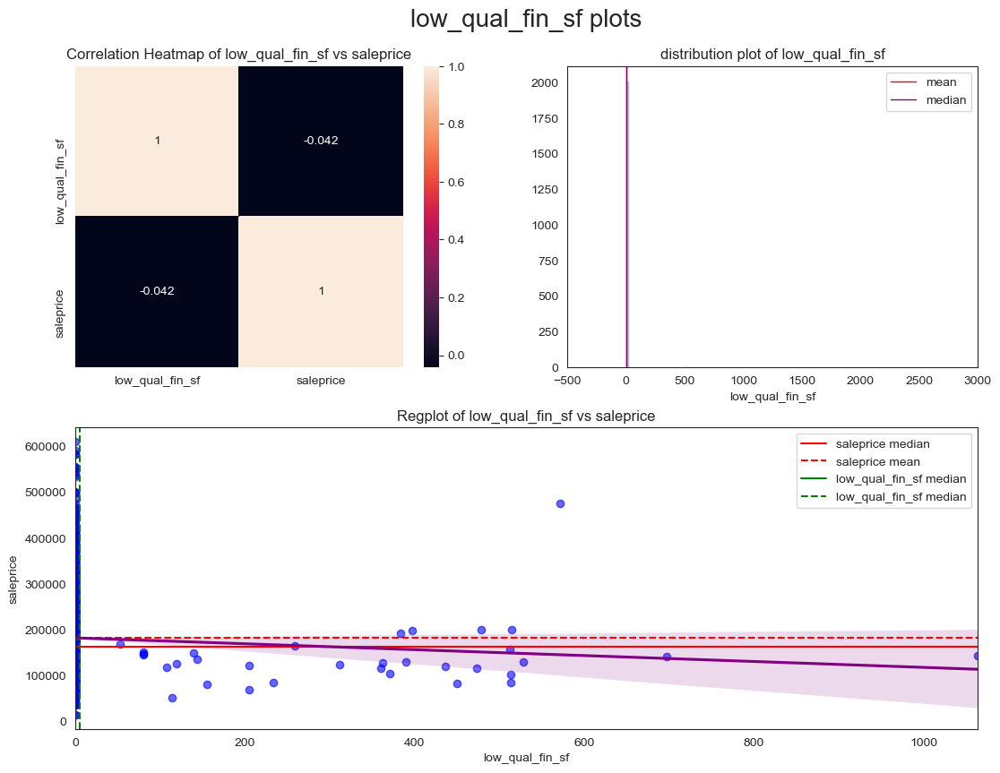

In [52]:
plot_num_col(rs, 'low_qual_fin_sf', 'saleprice',displot_min_xlim=-500, displot_max_xlim= 3000, dist_kde=False)

<span style="color:orange">Conclusion</span>:
- From heatmap, `low_qual_fin_sf` exhibit very weak correlation wth saleprice.
- Regplot do not show any linear relationship between `low_qual_fin_sf` and `saleprice`
- This is confirmed by the distplot where the observation are at 0.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='gr_liv_area'></a>
### gr_liv_area
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
gr_liv_area,2048.000,1498.331,497.948,334.000,1129.500,1444.000,1728.000,5642.000


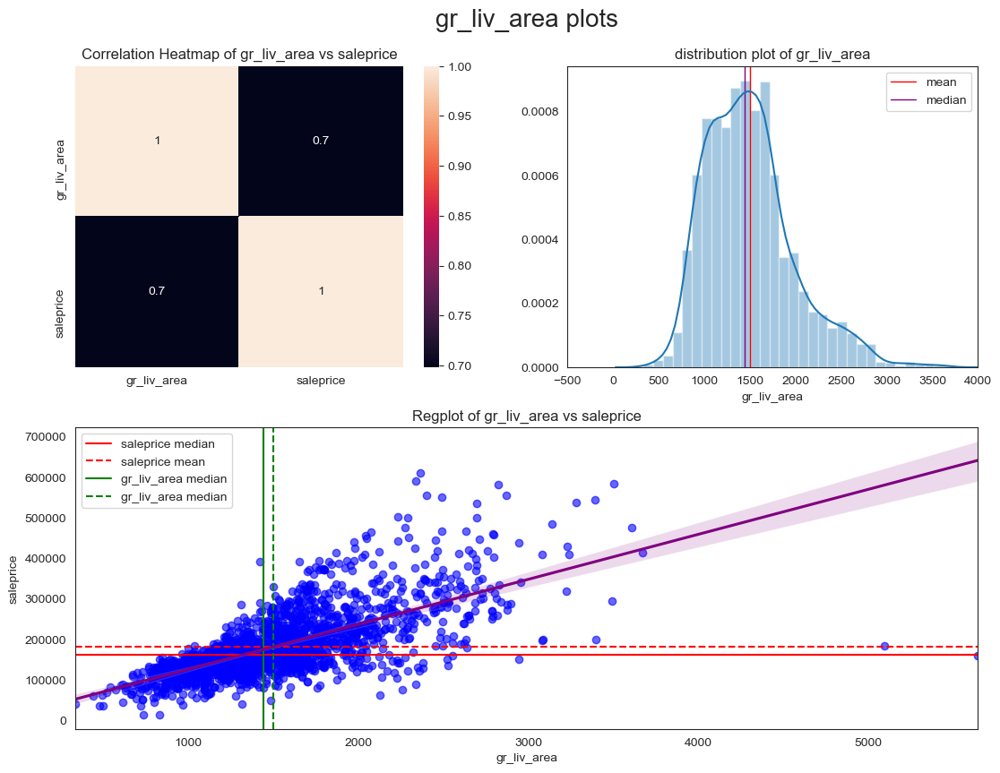

In [53]:
plot_num_col(rs, 'gr_liv_area', 'saleprice',displot_min_xlim=-500, displot_max_xlim= 4000)

<span style="color:orange">Conclusion</span>:
- From heatmap, `gr_liv_area` exhibit strong correlation wth saleprice.
- Regplot show linear relationship between `gr_liv_area` and `saleprice`
- This is confirmed by the distplot where the distribution of observations peaked close to the mean and median.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='bsmt_full_bath'></a>
### bsmt_full_bath
[Top](#plot_dictionary)

,0.000,1.000,2.000,3.000
bsmt_full_bath val_count,1199.000,824.000,23.000,2.000
bsmt_full_bath weight,0.585,0.402,0.011,0.001


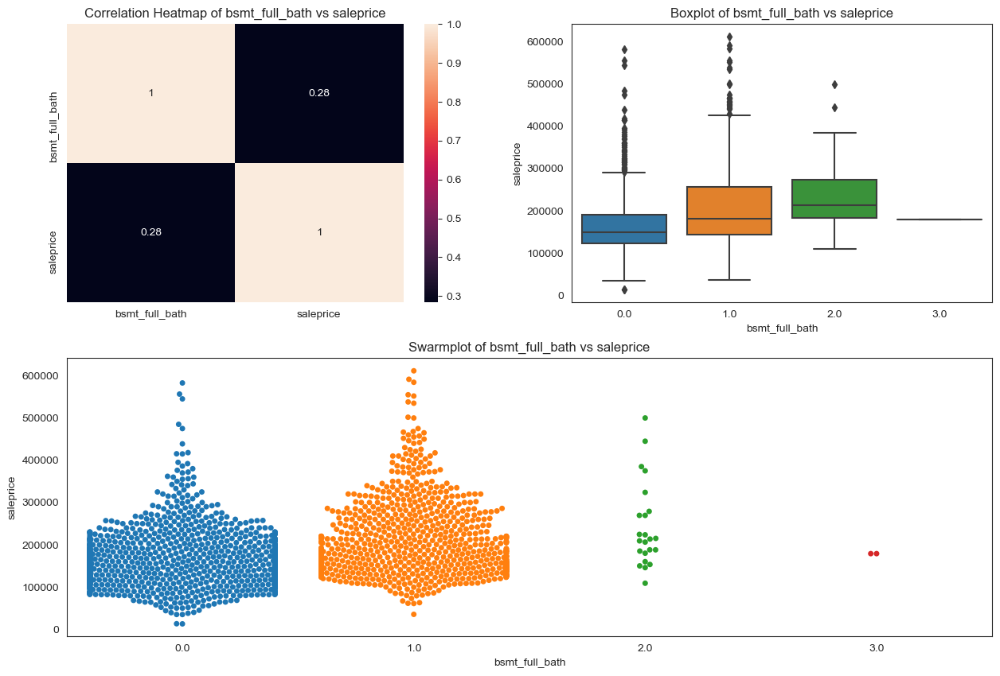

In [54]:
plot_non_num_col(rs, 'bsmt_full_bath', 'saleprice')

<span style="color:orange">Conclusion</span>:
- From heatmap, `bsmt_full_bath` exhibit weak correlation wth saleprice.
- Boxplot shows a good distribtion across price range. 
- Swarmpolt shows about 98% of the observations have either 0 or 1 bsmt full bath. 
- Variable will be used for modeling as it contradict business wisdom to discard as non-important

<a id='bsmt_half_bath'></a>
### bsmt_half_bath
[Top](#plot_dictionary)

,0.000,1.000,2.000
bsmt_half_bath val_count,1922.000,122.000,4.000
bsmt_half_bath weight,0.938,0.060,0.002


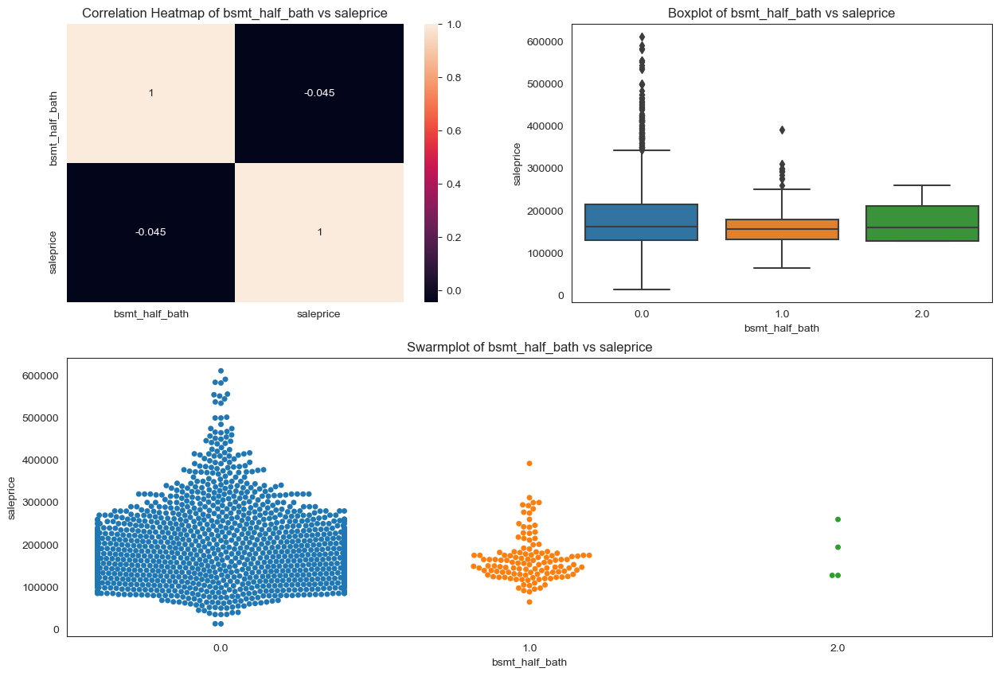

In [55]:
plot_non_num_col(rs, 'bsmt_half_bath', 'saleprice')

<span style="color:orange">Conclusion</span>:
- From heatmap, `bsmt_half_bath` exhibit very weak correlation wth saleprice.
- Swarmplot show that most observations are at 0. 
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='full_bath'></a>
### full_bath
[Top](#plot_dictionary)

,2,1,3,0,4
full_bath val_count,1095.000,899.000,44.000,8.000,2.000
full_bath weight,0.535,0.439,0.021,0.004,0.001


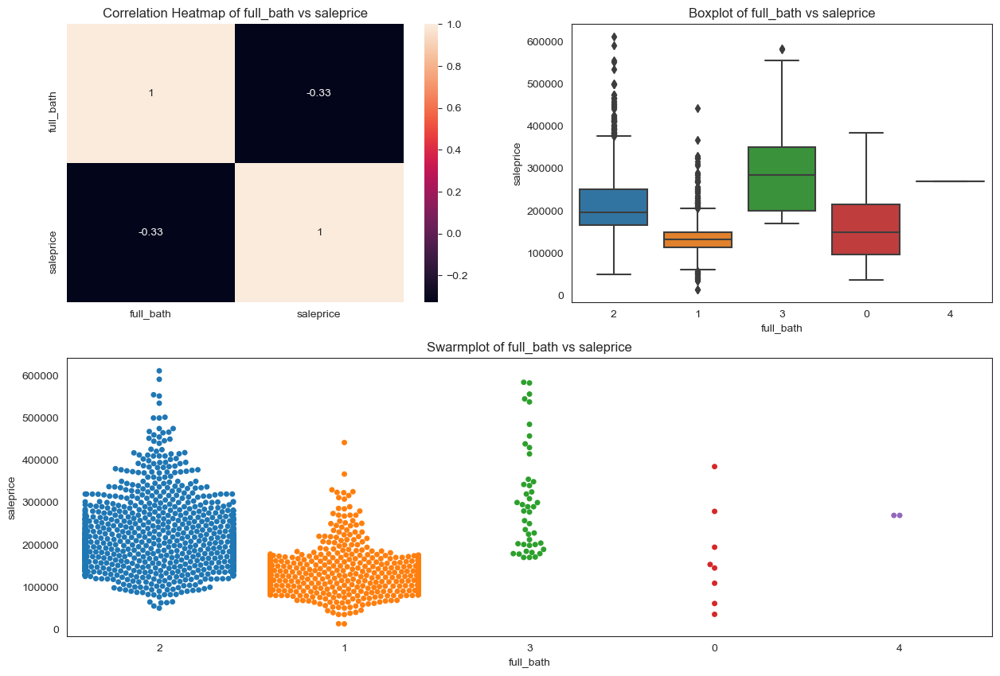

In [56]:
plot_non_num_col(rs, 'full_bath', 'saleprice')

<span style="color:orange">Conclusion</span>:
- From heatmap, `full_bath` exhibit moderate correlation wth saleprice. 
- Boxplot show a good distribution of observations across price range.
- Swarmplot show that most observations are either at 2 or 1 - this is expected as almost all hosues should have at least 1 full bath. 
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='half_bath'></a>
### half_bath
[Top](#plot_dictionary)

,0,1,2
half_bath val_count,1306.000,724.000,18.000
half_bath weight,0.638,0.354,0.009


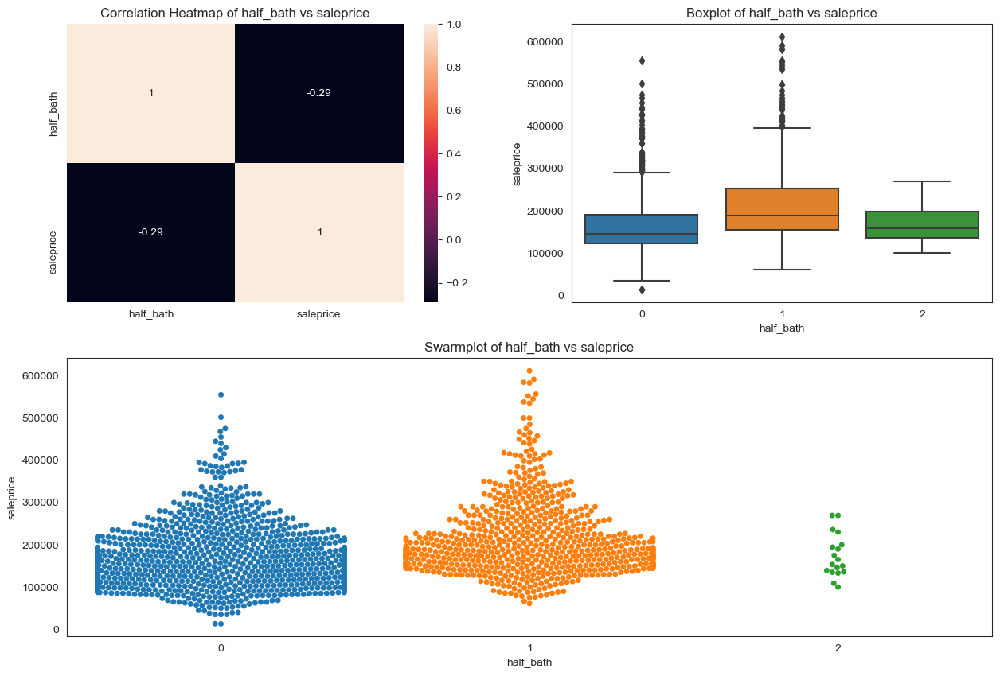

In [57]:
plot_non_num_col(rs, 'half_bath', 'saleprice')

<span style="color:orange">Conclusion</span>:
- From heatmap, `half_bath` exhibit weak correlation wth saleprice.
- Boxplot show a good distribution across price range.
- Swarmplot shows that almost all observations have either 0 or 1 half-bath, with most observations not having a half-bath.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='bedroom_abvgr'></a>
### bedroom_abvgr
[Top](#plot_dictionary)

,3,2,4,1,5,6,0,8
bedroom_abvgr val_count,1107.000,543.000,265.000,75.000,40.000,12.000,5.000,1.000
bedroom_abvgr weight,0.541,0.265,0.129,0.037,0.020,0.006,0.002,0.000


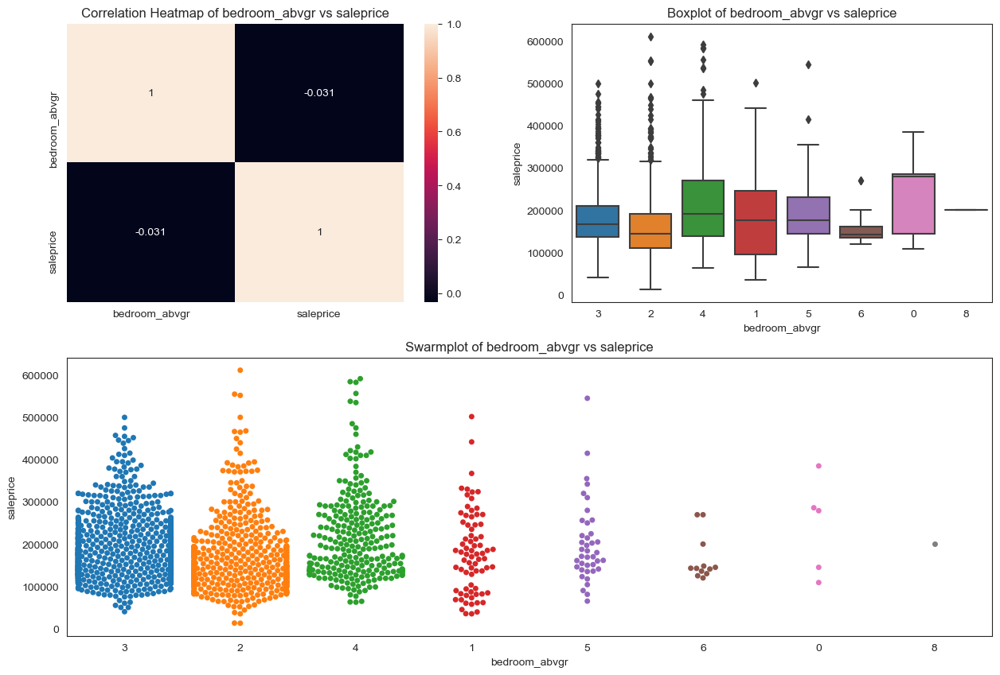

In [58]:
plot_non_num_col(rs, 'bedroom_abvgr', 'saleprice')

<span style="color:orange">Conclusion</span>:
- From heatmap, `bedroom_abvgr` exhibit weak correlation wth saleprice
- Boxplot & Swarmplot show a good distribution across price and elements.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='kitchen_abvgr'></a>
### kitchen_abvgr
[Top](#plot_dictionary)

,1,2,0,3
kitchen_abvgr val_count,1957.000,88.000,2.000,1.000
kitchen_abvgr weight,0.956,0.043,0.001,0.000


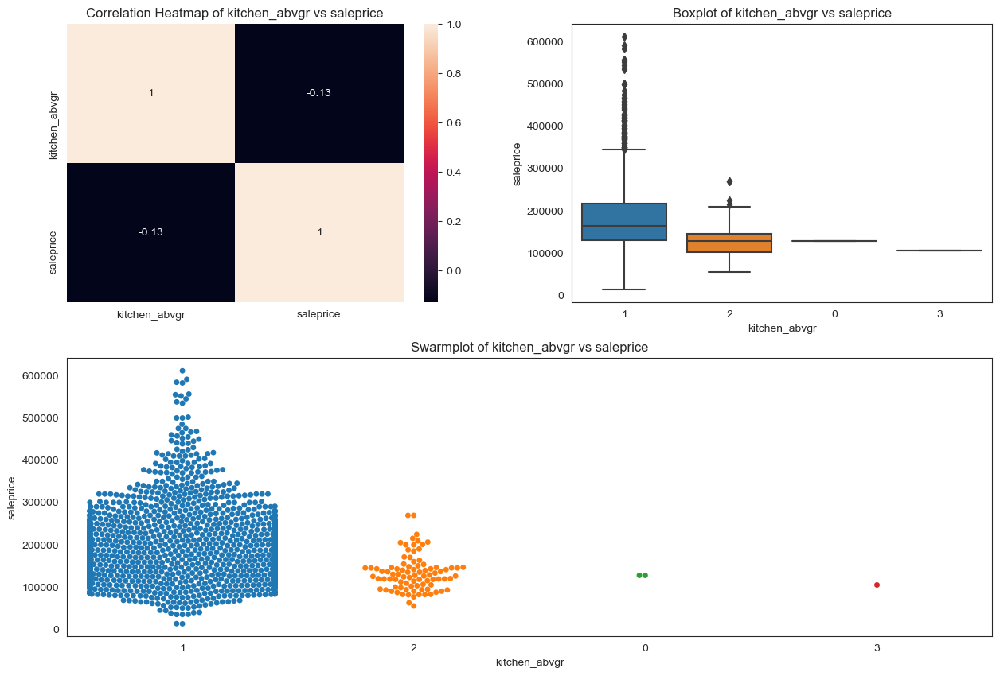

In [59]:
plot_non_num_col(rs, 'kitchen_abvgr', 'saleprice')

<span style="color:orange">Conclusion</span>:
- From heatmap, `kitchen_abvgr` exhibit very weak correlation wth saleprice.
- Boxplot show that 1 element have a good distribution across price range while the rest are almost non-existent. 
- Swarmplot show that almost 96% of the observations at 1 - This is expected as all houses should have at least 1 kitchen.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='kitchen_qual'></a>
### kitchen_qual
[Top](#plot_dictionary)

,TA,Gd,Ex,Fa
kitchen_qual val_count,1046.000,805.000,150.000,47.000
kitchen_qual weight,0.511,0.393,0.073,0.023


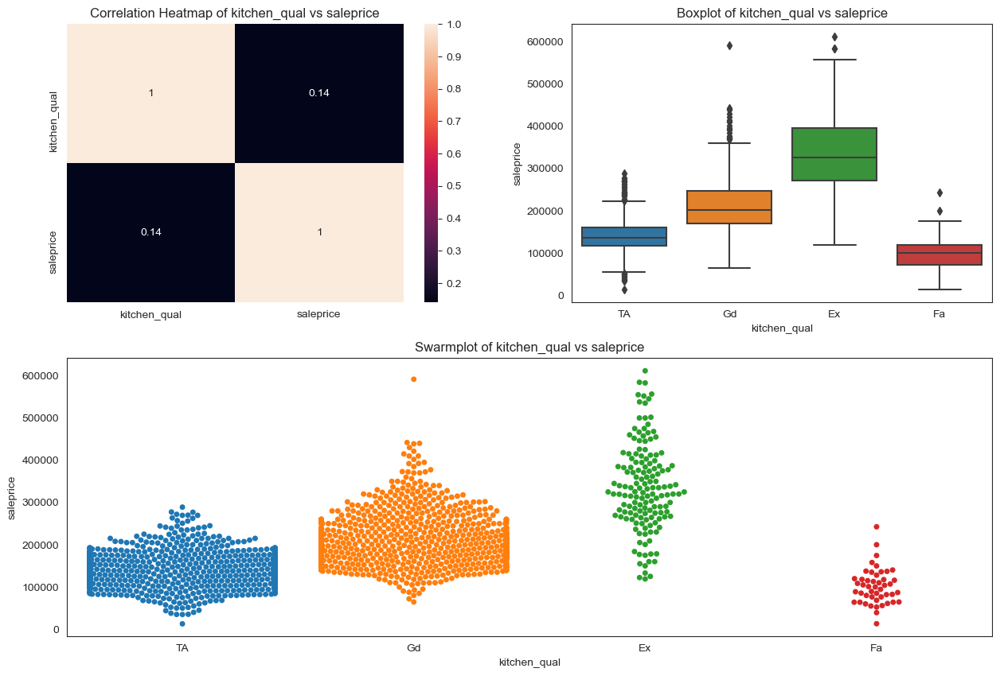

In [60]:
plot_non_num_col(rs, 'kitchen_qual','saleprice')

<span style="color:orange">Conclusion</span>:
- `kitchen_qual` has  weak correlation to sale price.
- Boxplot & Swarmplot show good distribution acorss price range and elements.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='totrms_abvgrd'></a>
### totrms_abvgrd
[Top](#plot_dictionary)

,6,7,5,8,4,9,10,11,12,3,15,14,13,2
totrms_abvgrd val_count,596.000,475.000,407.000,228.000,145.000,98.000,49.000,21.000,13.000,12.000,1.000,1.000,1.000,1.000
totrms_abvgrd weight,0.291,0.232,0.199,0.111,0.071,0.048,0.024,0.010,0.006,0.006,0.000,0.000,0.000,0.000


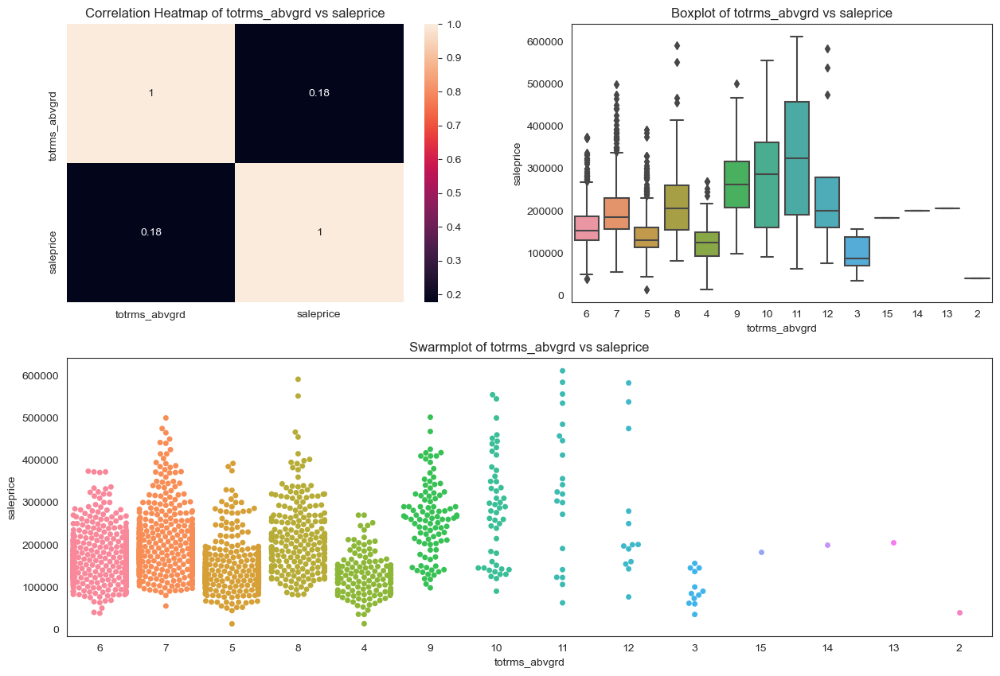

In [61]:
plot_non_num_col(rs, 'totrms_abvgrd', 'saleprice')

<span style="color:orange">Conclusion</span>:
- From heatmap, `totrms_abvgrd` exhibit moderate correlation wth saleprice
- Boxplot and swarmplot show good distribution across price range and elemetns. 
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='functional'></a>
### functional
[Top](#plot_dictionary)

,Typ,Min2,Min1,Mod,Maj1,Maj2,Sal,Sev
functional val_count,1912.000,42.000,42.000,29.000,12.000,7.000,2.000,2.000
functional weight,0.934,0.021,0.021,0.014,0.006,0.003,0.001,0.001


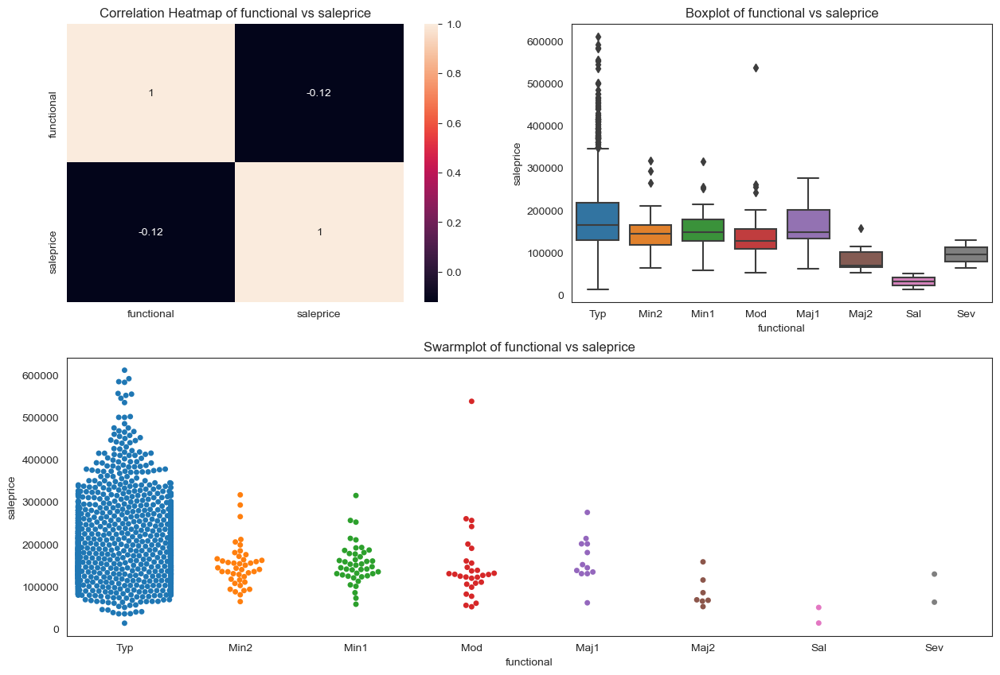

In [62]:
plot_non_num_col(rs, 'functional','saleprice')

<span style="color:orange">Conclusion</span>:
- `functional` has weak negative correlation to sale price.
- Boxplot show that most of the elements exist in a narrow price range 0- 200K
- Swamplot show that almost 93% of observations are Typ or average. 
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span> 

<a id='fireplaces'></a>
### fireplaces
[Top](#plot_dictionary)

,0,1,2,3,4
fireplaces val_count,998.000,898.000,145.000,6.000,1.000
fireplaces weight,0.487,0.438,0.071,0.003,0.000


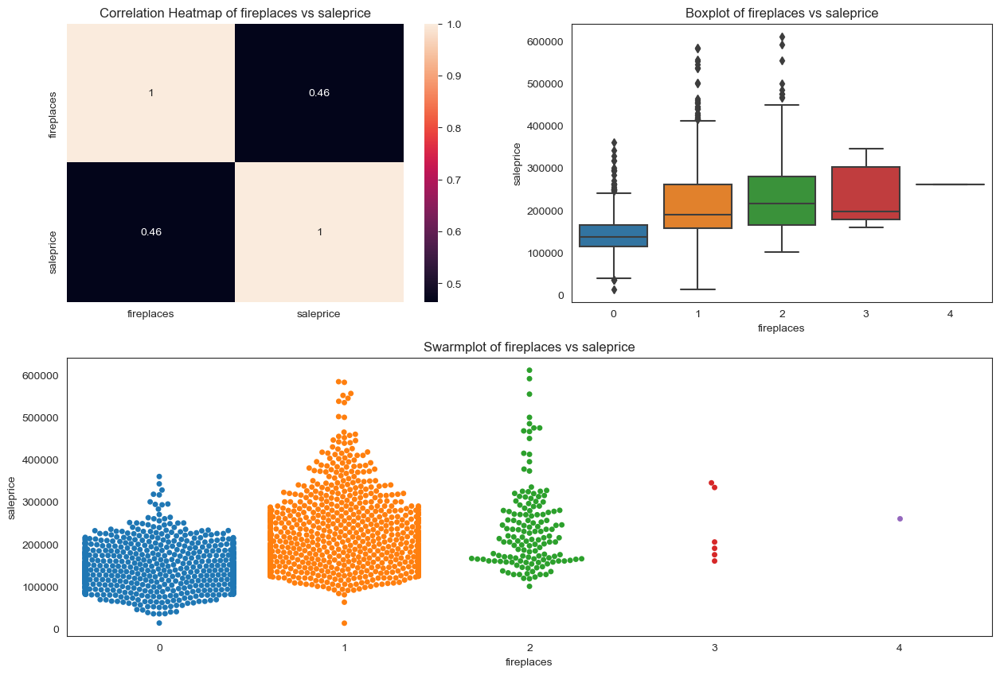

In [63]:
plot_non_num_col(rs, 'fireplaces', 'saleprice')

<span style="color:orange">Conclusion</span>:
- From heatmap, `fireplaces` exhibit weak correlation wth saleprice
- Boxplot show a good distribution of elements across price range.
- Swarmplot show that most of the observations are at either 0 or 1 - this is expected as most houses generally do not have more than 1 fireplace.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='fireplace_qu'></a>
### fireplace_qu
[Top](#plot_dictionary)

,None,Gd,TA,Fa,Ex,Po
fireplace_qu val_count,998.000,522.000,407.000,59.000,31.000,31.000
fireplace_qu weight,0.487,0.255,0.199,0.029,0.015,0.015


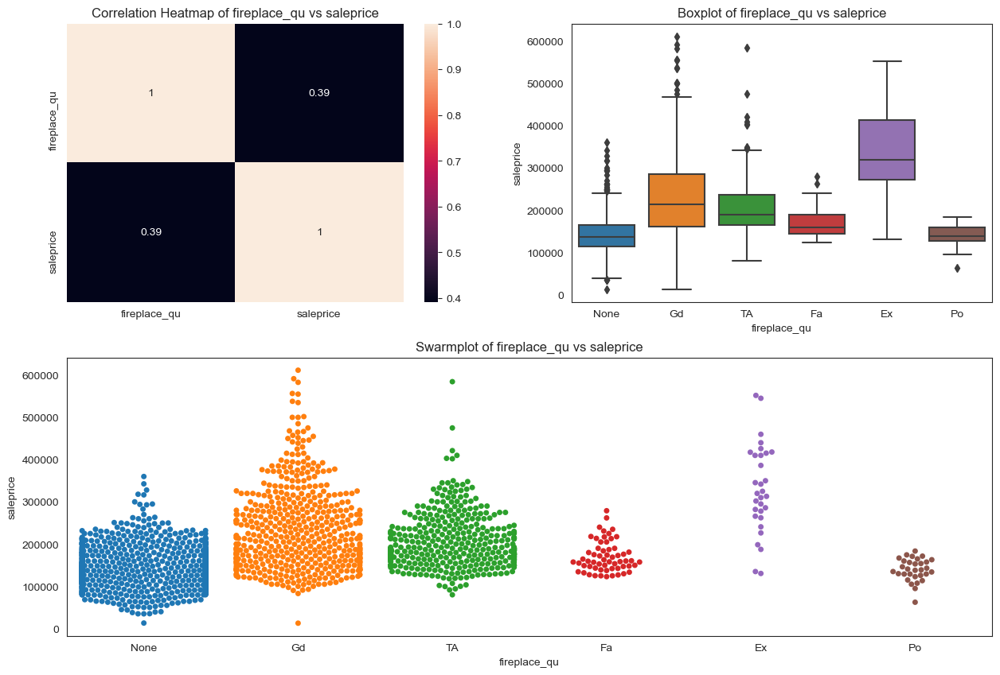

In [64]:
plot_non_num_col(rs, 'fireplace_qu','saleprice')

<span style="color:orange">Conclusion</span>:
- `fireplace_qu` has positive correlation to sale price.
- Boxplot & Swarmplot show good distribution across price range and elements.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='garage_type'></a>
### garage_type
[Top](#plot_dictionary)

,Attchd,Detchd,BuiltIn,None,Basment,2Types,CarPort
garage_type val_count,1212.000,534.000,132.000,113.000,27.000,19.000,11.000
garage_type weight,0.592,0.261,0.064,0.055,0.013,0.009,0.005


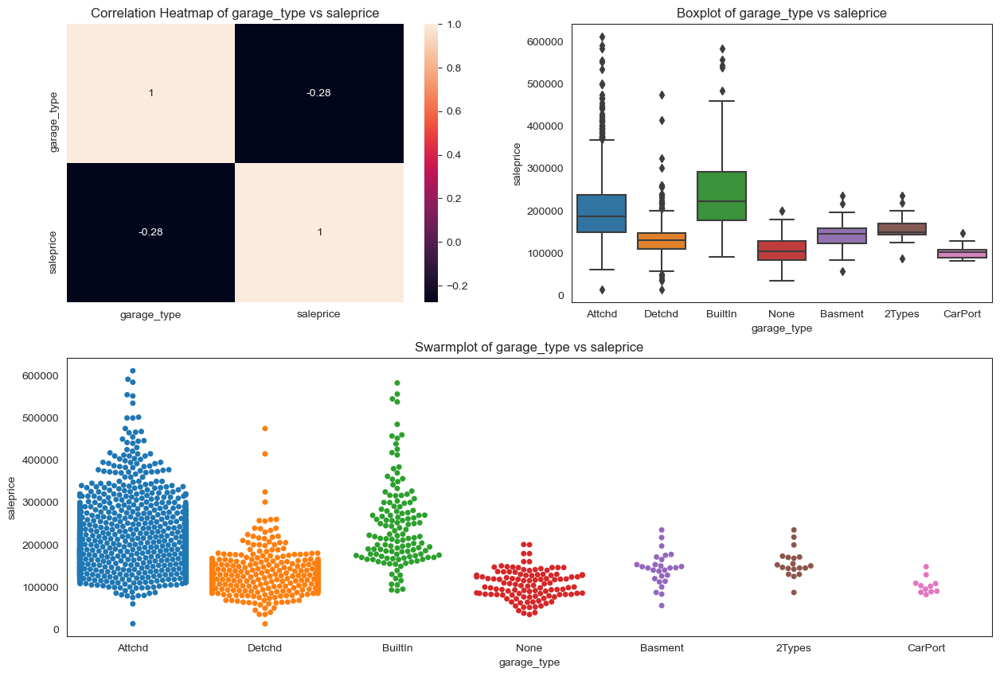

In [65]:
plot_non_num_col(rs, 'garage_type','saleprice')

<span style="color:orange">Conclusion</span>:
- `garage_type` has positive correlation to sale price.
- Boxplot & Swarmplot show good distribution across price range and elements.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='garage_yr_blt'></a>
### garage_yr_blt
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
garage_yr_blt,2048.000,1976.660,26.597,1872.000,1959.000,1978.000,2002.000,2010.000


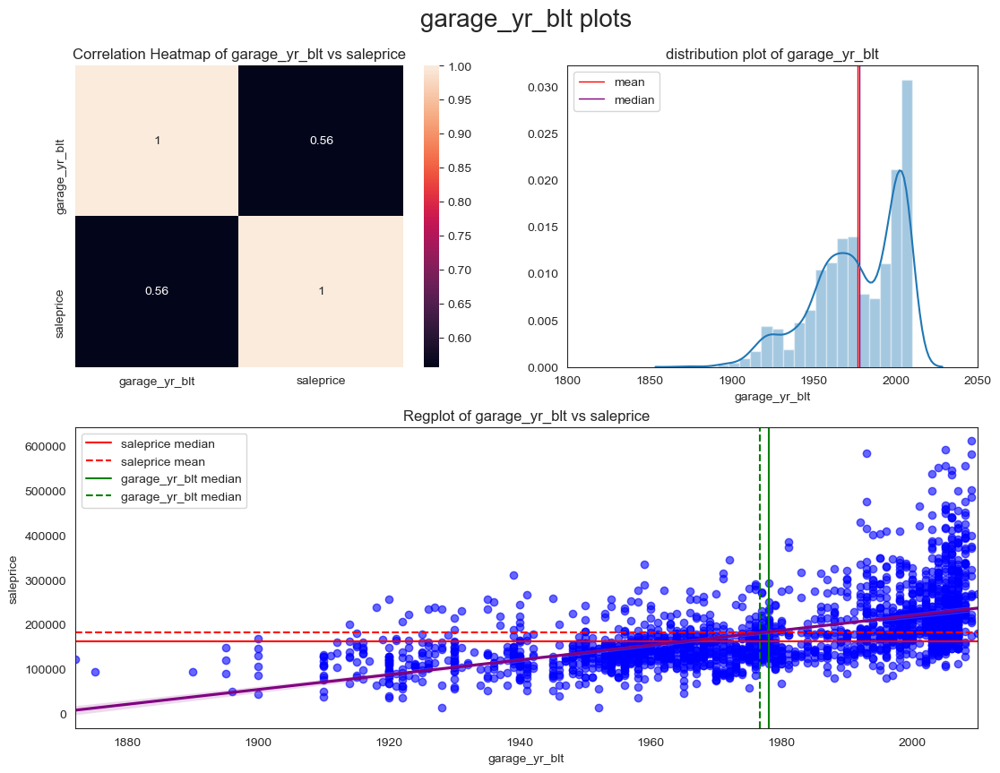

In [66]:
plot_num_col(rs, 'garage_yr_blt', 'saleprice',displot_min_xlim=1800, displot_max_xlim= 2050)

<span style="color:orange">Conclusion</span>:
- From heatmap, `garage_yr_blt` exhibit moderate correlation wth saleprice. 
- Regplot shows good spread of observation along regression line. There is an outlier at year more than 2200
- Observation are right skewed. 
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='garage_finish'></a>
### garage_finish
[Top](#plot_dictionary)

,Unf,RFn,Fin,None
garage_finish val_count,847.000,579.000,509.000,113.000
garage_finish weight,0.414,0.283,0.249,0.055


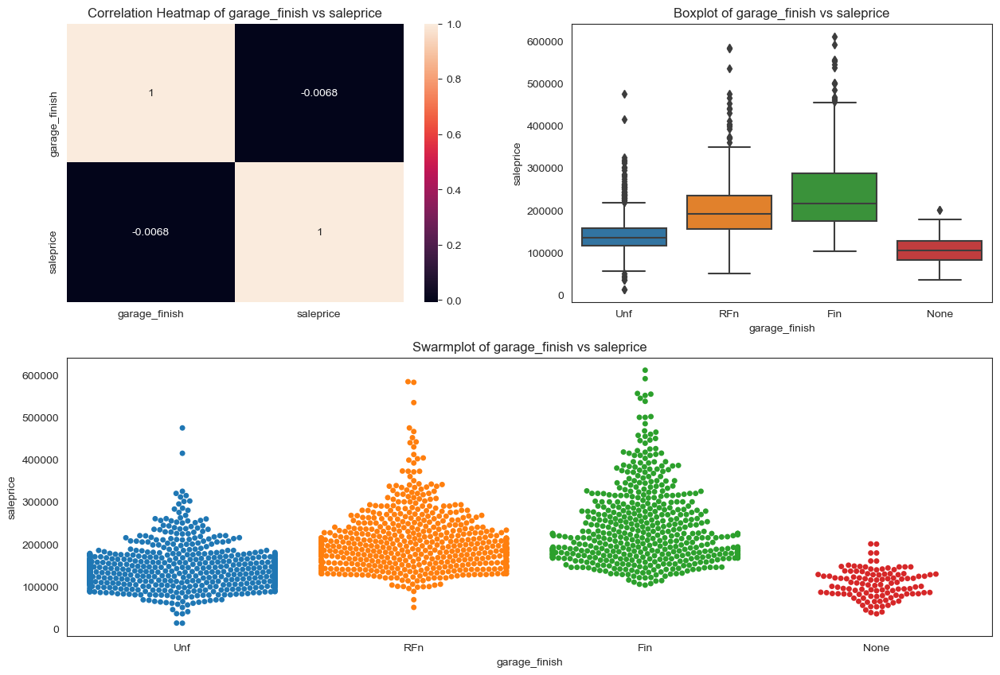

In [67]:
plot_non_num_col(rs, 'garage_finish','saleprice')

<span style="color:orange">Conclusion</span>:
- `garage_finish` has very weak negative correlation to sale price.
- Boxplot & Swarmplot shows a good distribution acorss price range and elements
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='garage_cars'></a>
### garage_cars
[Top](#plot_dictionary)

,2.000,1.000,3.000,0.000,4.000,5.000
garage_cars val_count,1135.000,523.000,263.000,113.000,13.000,1.000
garage_cars weight,0.554,0.255,0.128,0.055,0.006,0.000


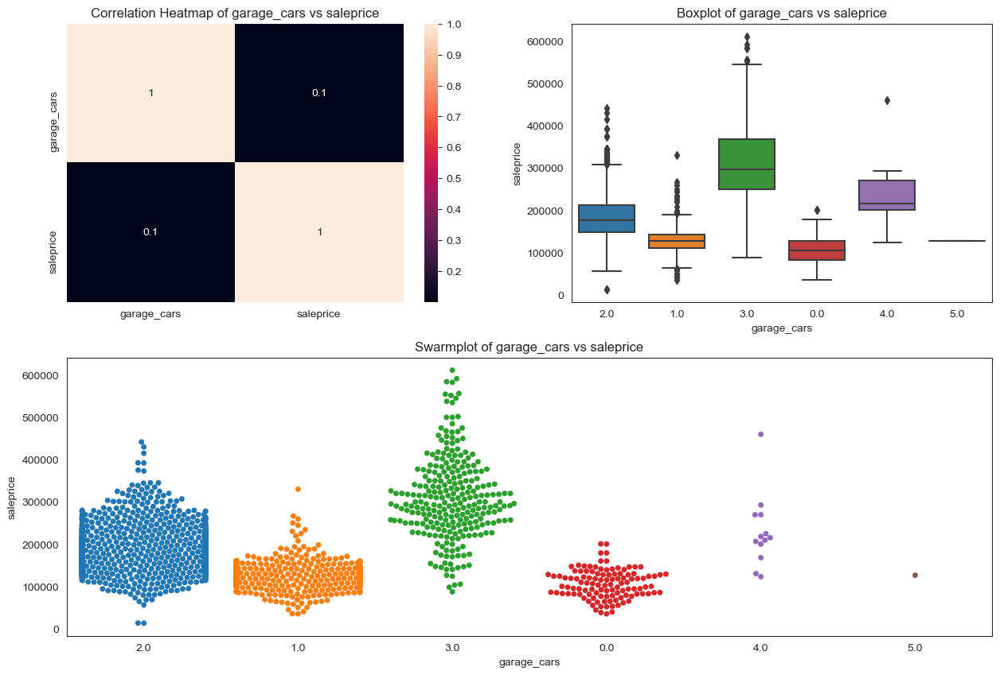

In [68]:
plot_non_num_col(rs, 'garage_cars', 'saleprice')

<span style="color:orange">Conclusion</span>: 
- `garage_cars` exhibit moderate correlation wth saleprice.
- Boxplot & Swarmplot shows a good distribution acorss price range and elements
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important 

<a id='garage_area'></a>
### garage_area
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
garage_area,2048.000,473.693,215.972,0.000,319.000,480.000,576.000,1418.000


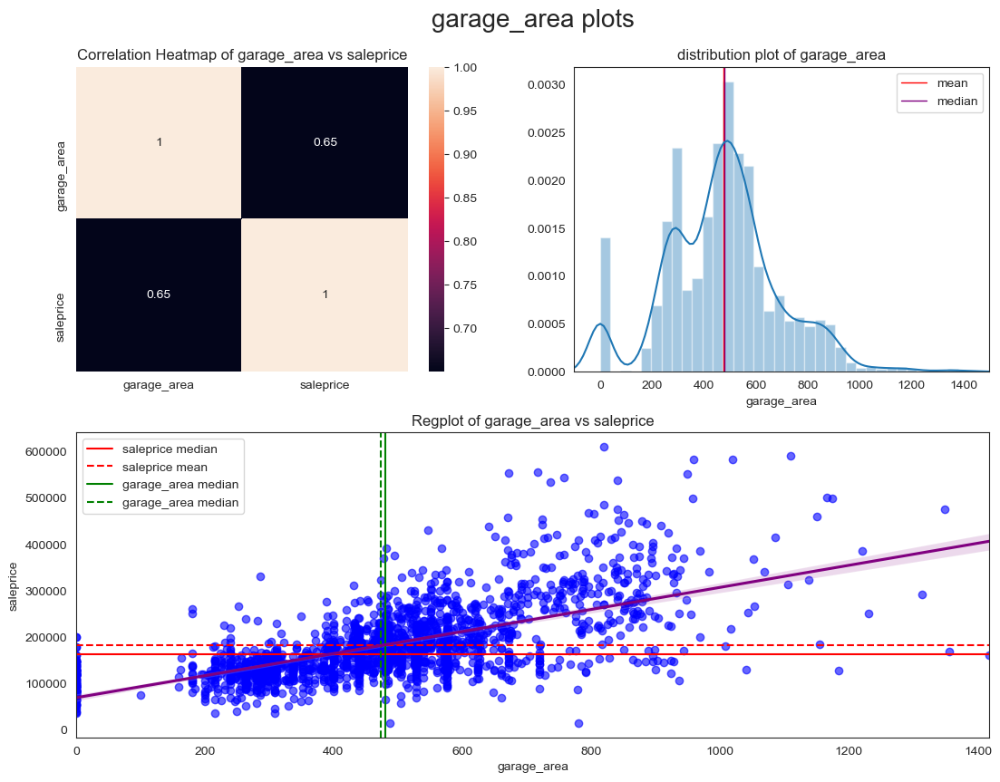

In [69]:
plot_num_col(rs, 'garage_area', 'saleprice',displot_min_xlim=-100, displot_max_xlim= 1500)

<span style="color:orange">Conclusion</span>:
- From heatmap, `garage_area` exhibit moderate correlation wth saleprice.
- Regplot shows good spread of observation along regression line.
- Observation are right skewed.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='garage_qual'></a>
### garage_qual
[Top](#plot_dictionary)

,TA,None,Fa,Gd,Ex,Po
garage_qual val_count,1830.000,113.000,82.000,18.000,3.000,2.000
garage_qual weight,0.894,0.055,0.040,0.009,0.001,0.001


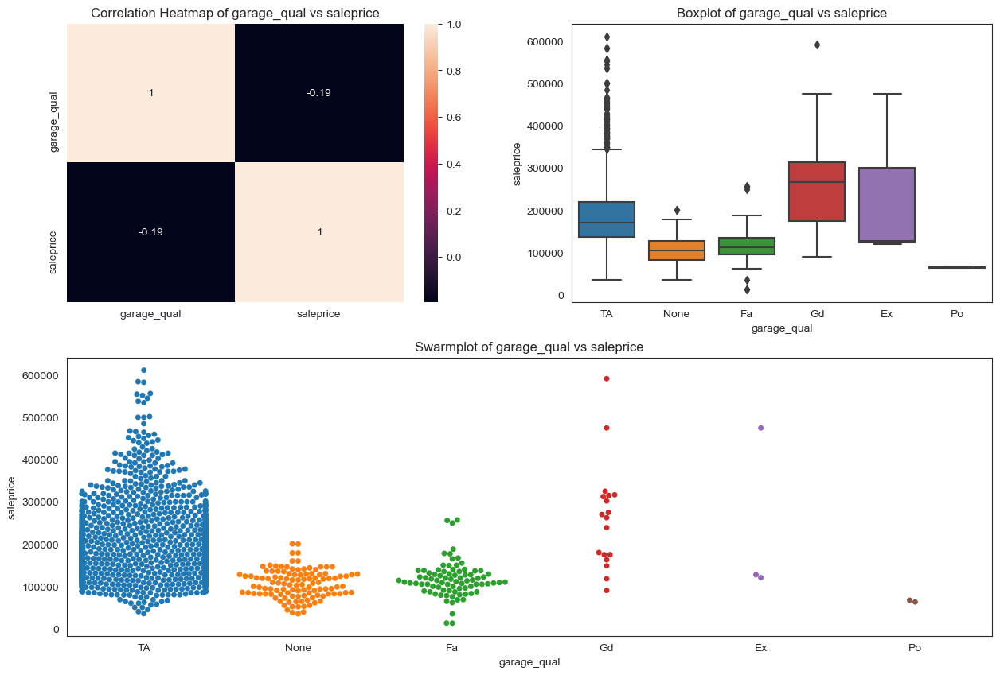

In [70]:
plot_non_num_col(rs, 'garage_qual', 'saleprice')

<span style="color:orange">Conclusion</span>:
- `garage_qual` has negative correlation to sale price. 
- From Swarmplot - Typical or no garage made up almost 94% of total observations.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='garage_cond'></a>
### garage_cond
[Top](#plot_dictionary)

,TA,None,Fa,Gd,Po,Ex
garage_cond val_count,1866.000,113.000,47.000,12.000,8.000,2.000
garage_cond weight,0.911,0.055,0.023,0.006,0.004,0.001


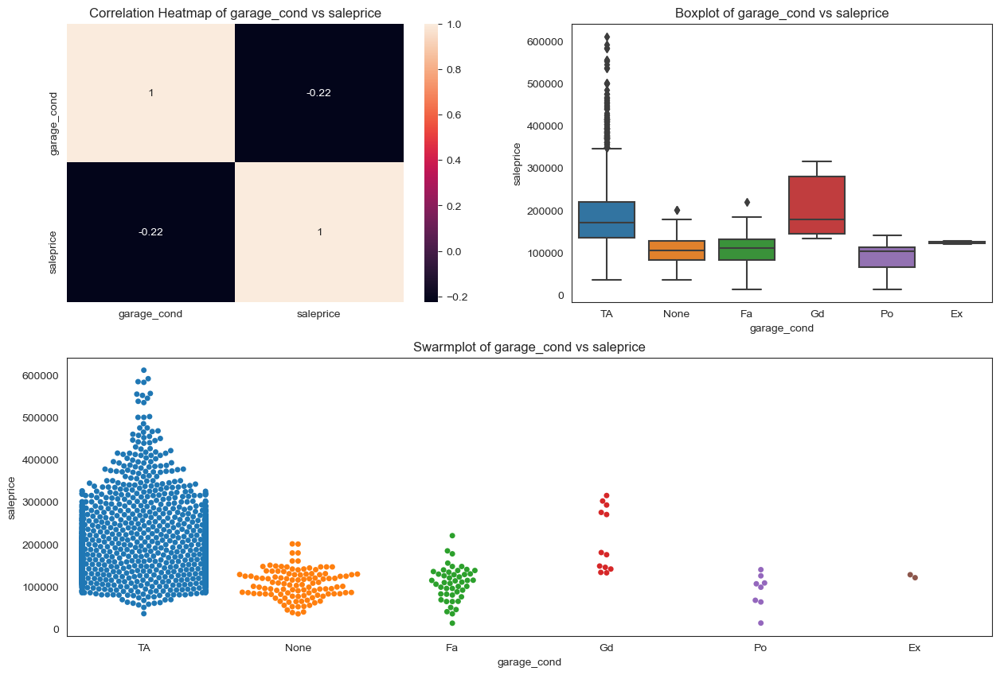

In [71]:
plot_non_num_col(rs, 'garage_cond','saleprice')

<span style="color:orange">Conclusion</span>:
- `garage_cond` has negative correlation to sale price. 
- Boxplot show a good distribution across price range.
- From Swarmplot - Typical or no garage made up almost 91% of total observations.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='paved_drive'></a>
### paved_drive
[Top](#plot_dictionary)

,Y,N,P
paved_drive val_count,1858.000,151.000,39.000
paved_drive weight,0.907,0.074,0.019


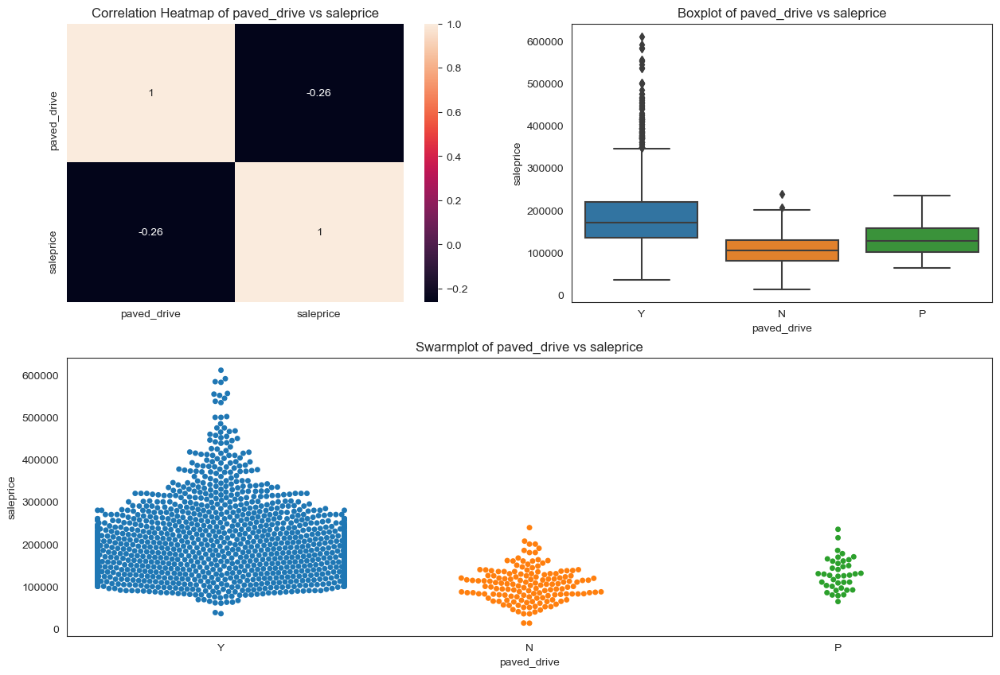

In [72]:
plot_non_num_col(rs, 'paved_drive','saleprice')

<span style="color:orange">Conclusion</span>:
- `paved_drive` has negative correlation to sale price. 
- Boxplot show a 'Y' having a good distribution across price range but the rest of the element exist in a narrow range.
- From Swarmplot - Y made up almost 91% of total observations.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='wood_deck_sf'></a>
### wood_deck_sf
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
wood_deck_sf,2048.000,93.886,128.598,0.000,0.000,0.000,168.000,1424.000


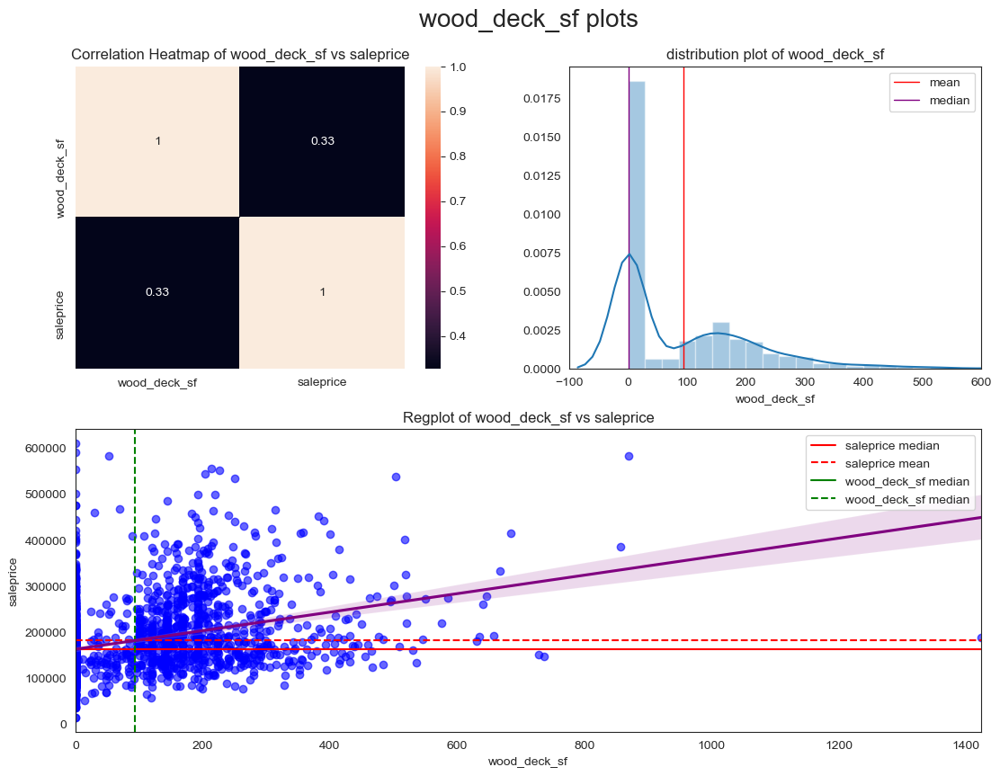

In [73]:
plot_num_col(rs, 'wood_deck_sf', 'saleprice',displot_min_xlim=-100, displot_max_xlim= 600)

<span style="color:orange">Conclusion</span>:
- From heatmap, `wood_deck_sf` exhibit weak correlation wth saleprice.
- Regplot most observation at 0 which is confirmed by displot with median at 0 and left skewed.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='open_porch_sf'></a>
### open_porch_sf
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
open_porch_sf,2048.000,47.445,66.393,0.000,0.000,27.000,70.000,547.000


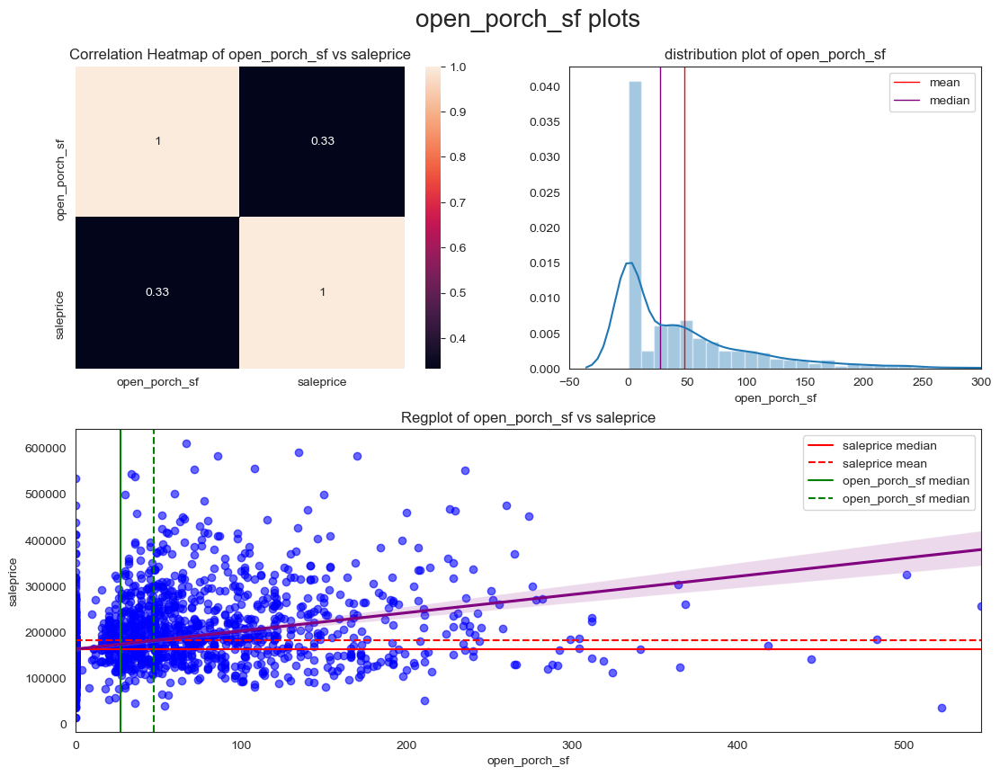

In [74]:
plot_num_col(rs,  'open_porch_sf', 'saleprice',displot_min_xlim=-50, displot_max_xlim= 300)

<span style="color:orange">Conclusion</span>:
- From heatmap, `wood_deck_sf` exhibit weak correlation wth saleprice.
- Regplot most observation at 0 which is confirmed by displot with median at 0 and left skewed.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='open_porch_sf'></a>
### open_porch_sf
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
open_porch_sf,2048.000,47.445,66.393,0.000,0.000,27.000,70.000,547.000


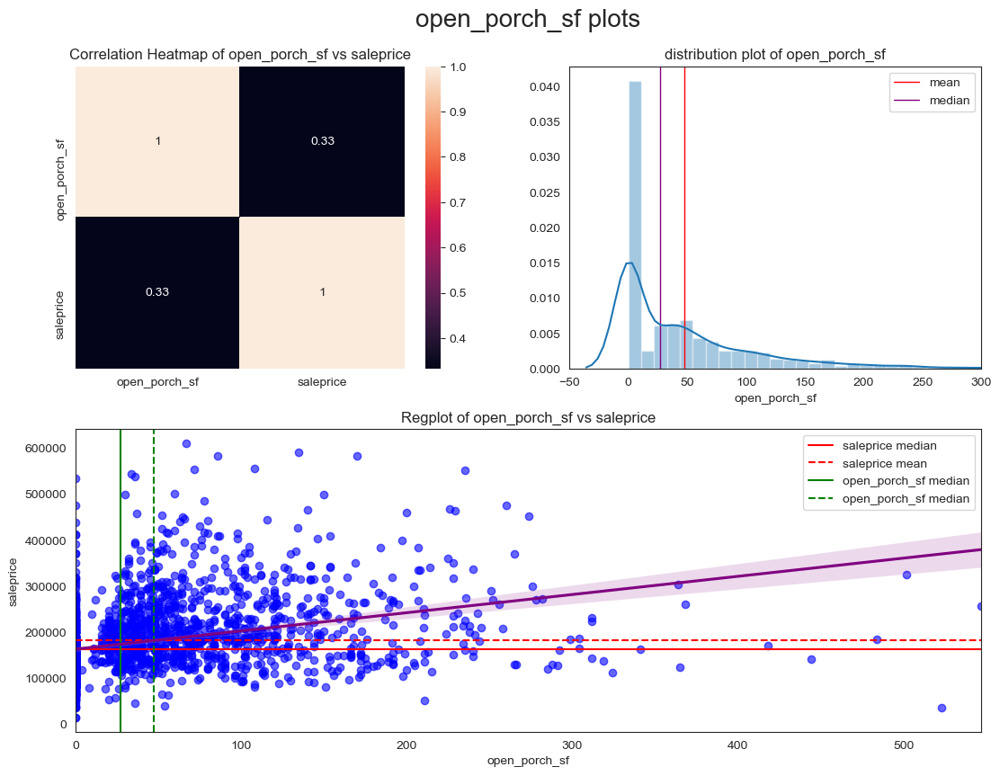

In [75]:
plot_num_col(rs, 'open_porch_sf', 'saleprice',displot_min_xlim=-50, displot_max_xlim= 300)

<span style="color:orange">Conclusion</span>:
- From heatmap, `open_porch_sf` exhibit weak correlation wth saleprice. 
- Regplot shows most observation at 0 which is confirmed by displot to be left skewed with 0 at highest frequency.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='enclosed_porch'></a>
### enclosed_porch
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
enclosed_porch,2048.000,22.501,59.738,0.000,0.000,0.000,0.000,432.000


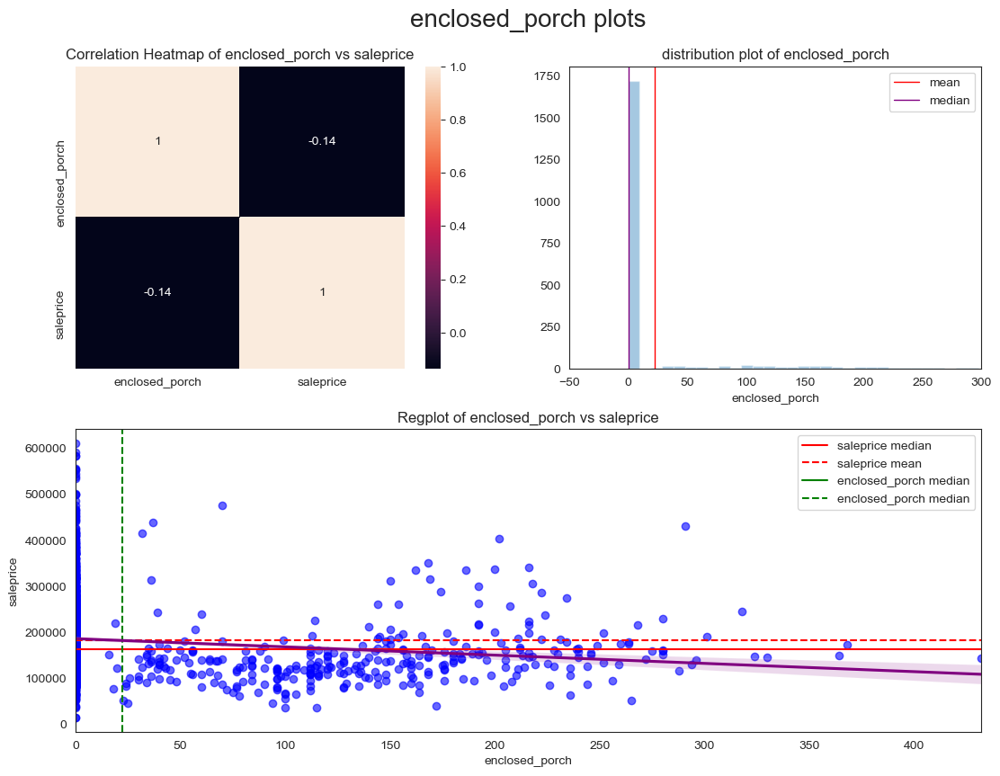

In [76]:
plot_num_col(rs, 'enclosed_porch', 'saleprice',displot_min_xlim=-50, displot_max_xlim= 300, dist_kde=False)

<span style="color:orange">Conclusion</span>:
- From heatmap, `enclosed_porch` exhibit very weak correlation wth saleprice.
- Regplot shows most observation at 0 which is confirmed by displot with median at 0 and left skewed.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='3ssn_porch'></a>
### 3ssn_porch
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
3ssn_porch,2048.000,2.595,25.248,0.000,0.000,0.000,0.000,508.000


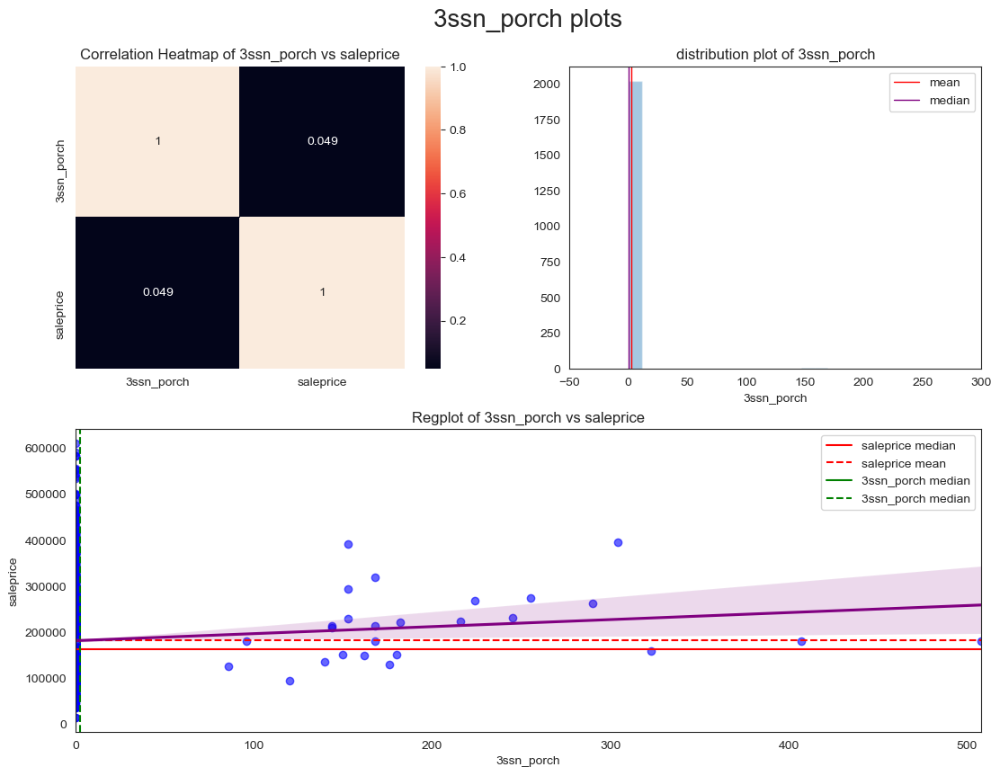

In [77]:
plot_num_col(rs, '3ssn_porch', 'saleprice',displot_min_xlim=-50, displot_max_xlim= 300, dist_kde=False)

<span style="color:orange">Conclusion</span>:
- From heatmap, `3ssn_porch` exhibit very weak correlation wth saleprice.
- Regplot shows most observation at 0 which is confirmed by displot with median at 0 and left skewed.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='screen_porch'></a>
### screen_porch
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
screen_porch,2048.000,16.536,57.413,0.000,0.000,0.000,0.000,490.000


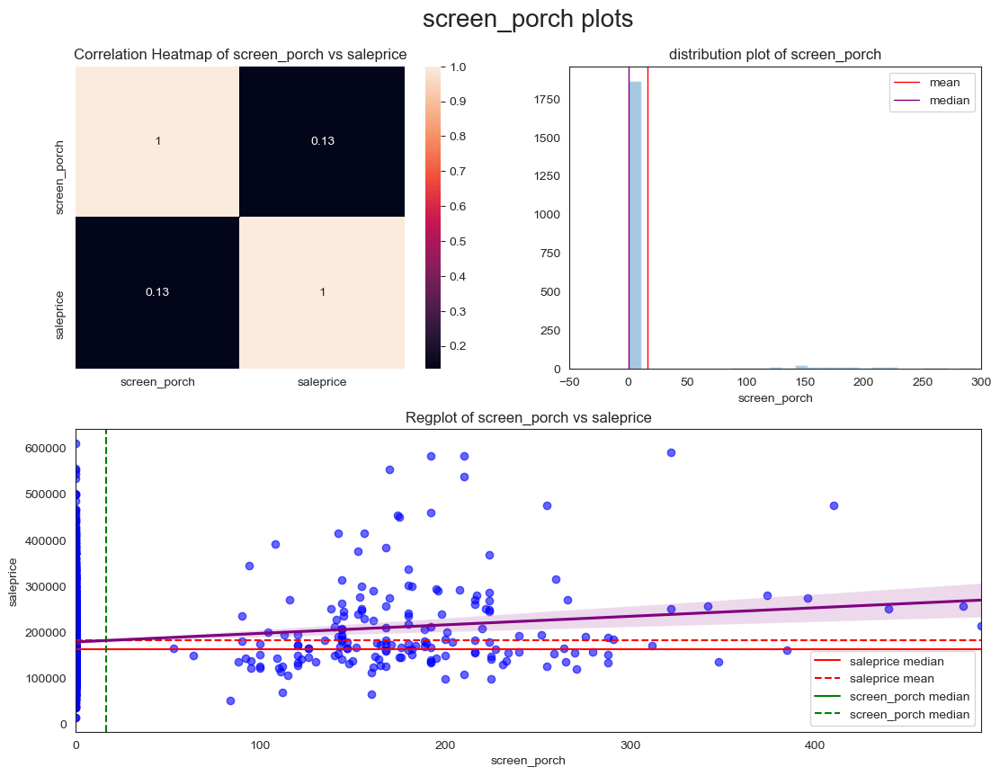

In [78]:
plot_num_col(rs, 'screen_porch', 'saleprice',displot_min_xlim=-50, displot_max_xlim= 300, dist_kde=False)

<span style="color:orange">Conclusion</span>:
- From heatmap, `screen_porch` exhibit weak correlation wth saleprice.
- Regplot shows most observation at 0 which is confirmed by displot with median at 0 and left skewed.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='pool_area'></a>
### pool_area
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
pool_area,2048.000,2.401,37.810,0.000,0.000,0.000,0.000,800.000


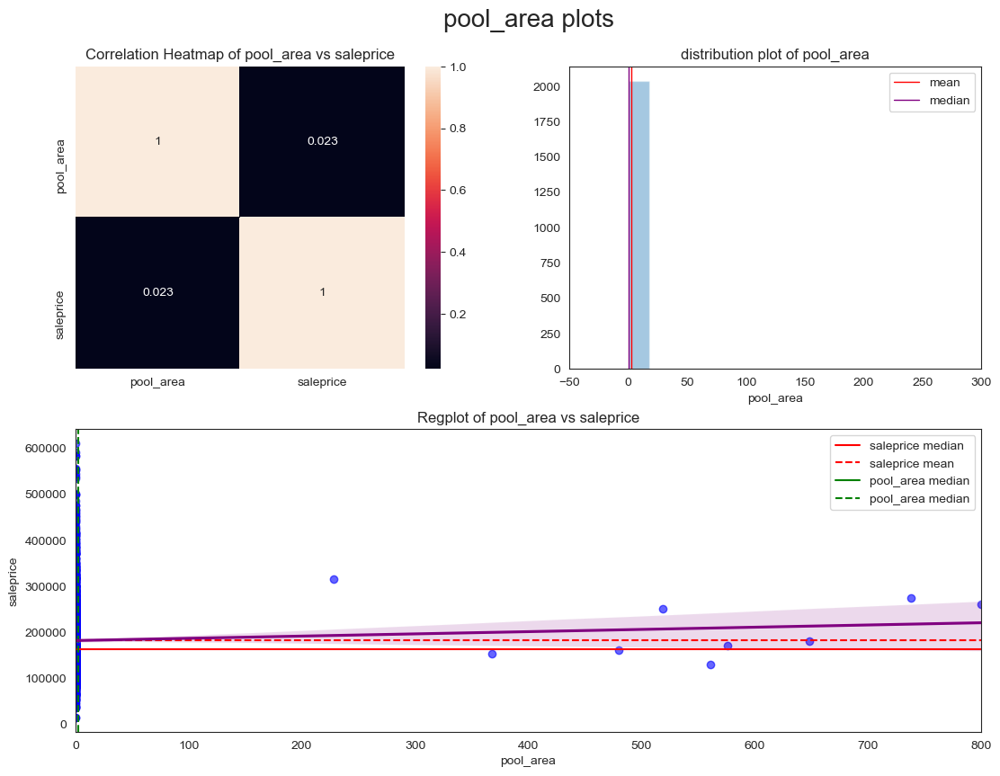

In [79]:
plot_num_col(rs, 'pool_area', 'saleprice',displot_min_xlim=-50, displot_max_xlim= 300, dist_kde=False)

<span style="color:orange">Conclusion</span>:
- From heatmap, `pool area` exhibit very weak correlation wth saleprice.
- Regplot shows most observation at 0 which is confirmed by displot.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='pool_qc'></a>
### pool_qc
[Top](#plot_dictionary)

,None,Gd,TA,Fa,Ex
pool_qc val_count,2039.000,4.000,2.000,2.000,1.000
pool_qc weight,0.996,0.002,0.001,0.001,0.000


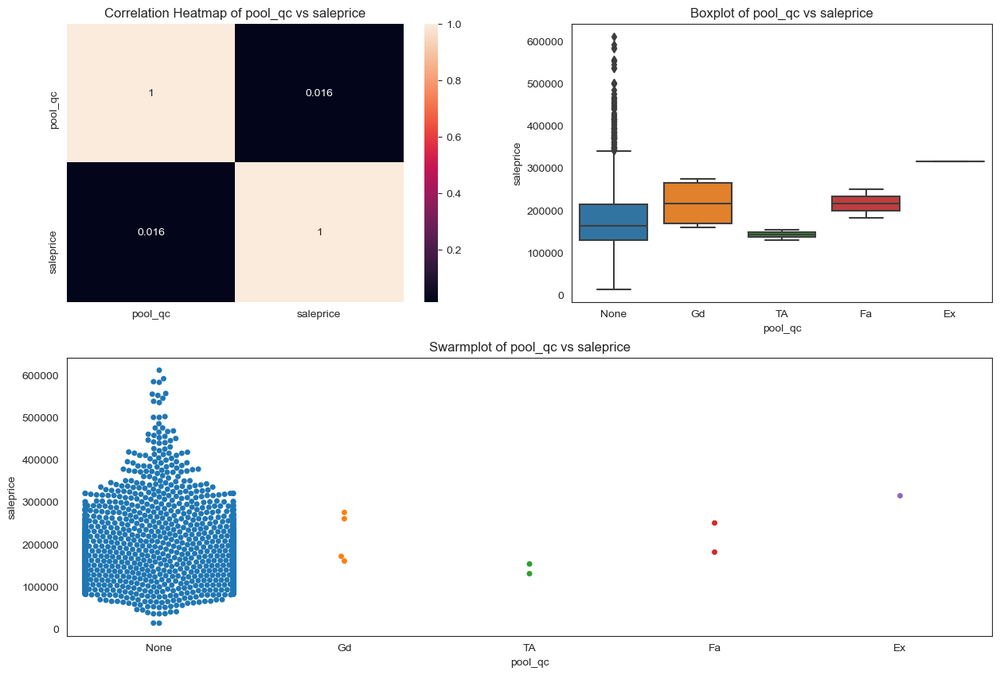

In [80]:
plot_non_num_col(rs, 'pool_qc','saleprice')

<span style="color:orange">Conclusion</span>: 
- `pool_qc` has very low correlation to sale price. 
- Boxplot show that only 1 single element has a good distribution across price range.
- Swarmplot show that No Pool made up almost 96% of total observations.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='fence'></a>
### fence
[Top](#plot_dictionary)

,None,MnPrv,GdPrv,GdWo,MnWw
fence val_count,1650.000,225.000,83.000,80.000,10.000
fence weight,0.806,0.110,0.041,0.039,0.005


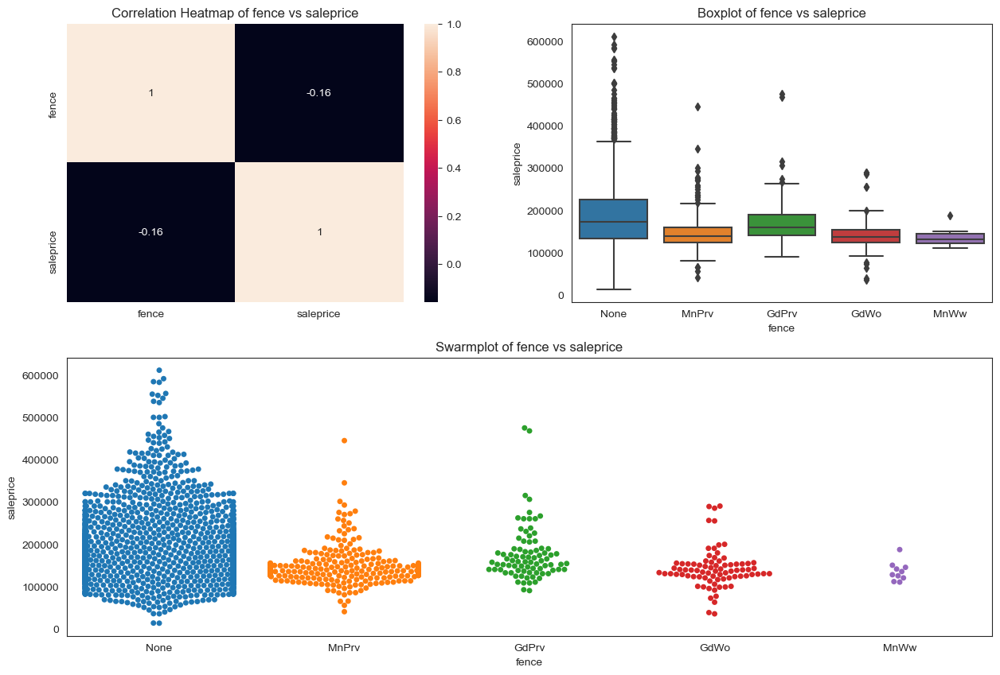

In [81]:
plot_non_num_col(rs, 'fence','saleprice')

<span style="color:orange">Conclusion</span>: 
- `fence` has negative correlation to sale price. 
- Boxplot shows that only 1 single element has good distribution across price range while the rest of the elements exist in a narrow price range 0- 300K
- Swarmplot hsow tha tMinimum Privacy or No Fence  made up almost 92% of total observations. 
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='misc_feature'></a>
### misc_feature
[Top](#plot_dictionary)

,None,Shed,Gar2,Othr,Elev,TenC
misc_feature val_count,1983.000,56.000,4.000,3.000,1.000,1.000
misc_feature weight,0.968,0.027,0.002,0.001,0.000,0.000


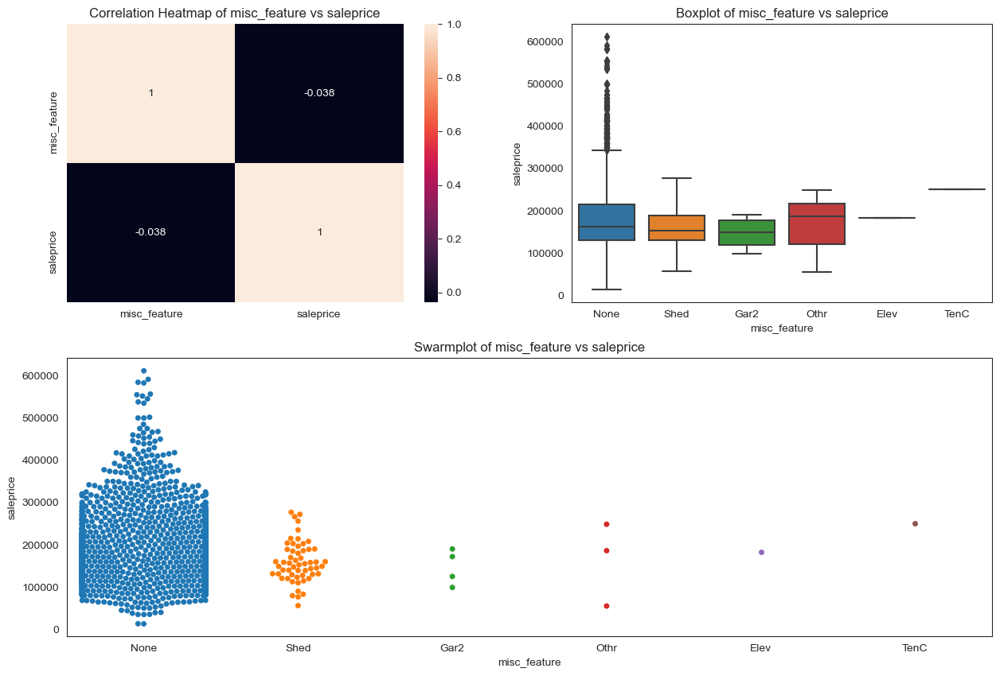

In [82]:
plot_non_num_col(rs, 'misc_feature', 'saleprice')

<span style="color:orange">Conclusion</span>:
- `misc_feature` has very low correlation to sale price. 
- Boxplot shows that only 1 single element has good distribution across price range while the rest of the elements exist in a narrow price range 0- 300K
- Swarmplot show that No Misc Features made up almost 97% of total observations.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='misc_val'></a>
### misc_val
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
misc_val,2048.000,51.650,573.811,0.000,0.000,0.000,0.000,17000.000


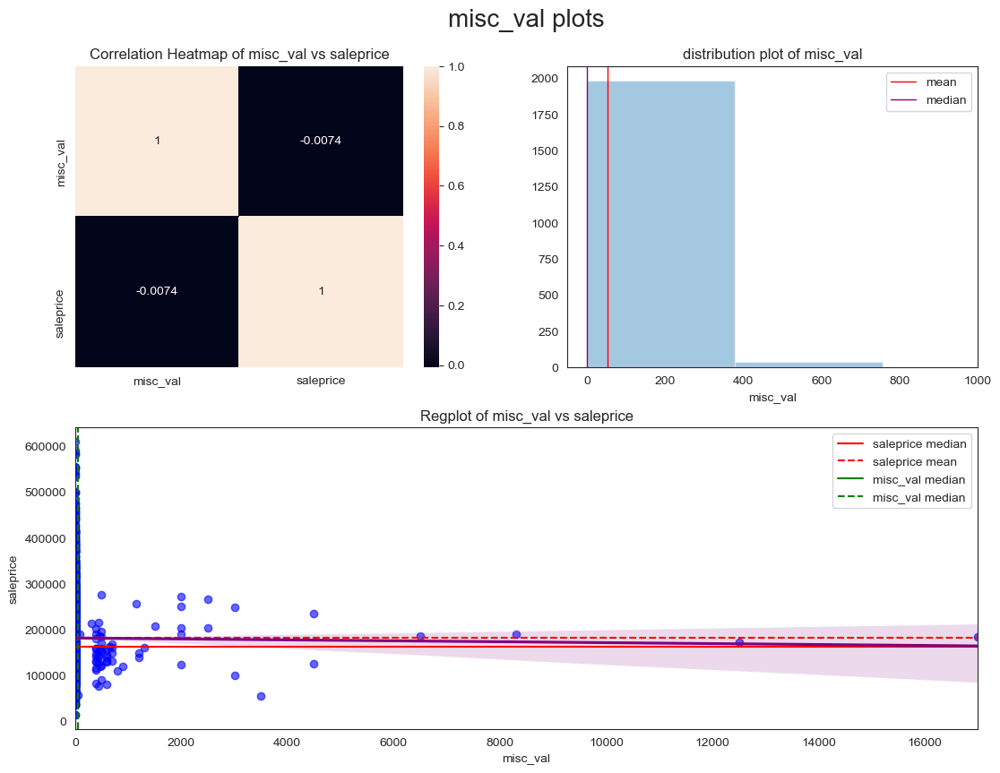

In [83]:
plot_num_col(rs, 'misc_val', 'saleprice',displot_min_xlim=-50, displot_max_xlim= 1000,dist_kde=False)

<span style="color:orange">Conclusion</span>:
- From heatmap, `misc_val` exhibit very weak correlation wth saleprice. 
- Regplot shows most observation at 0 which is confirmed by displot. It show 4 outliers beyond 8K range. 
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='mo_sold'></a>
### mo_sold
[Top](#plot_dictionary)

,6,7,5,4,8,3,10,9,2,11,1,12
mo_sold val_count,352.000,302.000,257.000,207.000,167.000,167.000,123.000,109.000,104.000,103.000,79.000,78.000
mo_sold weight,0.172,0.147,0.125,0.101,0.082,0.082,0.060,0.053,0.051,0.050,0.039,0.038


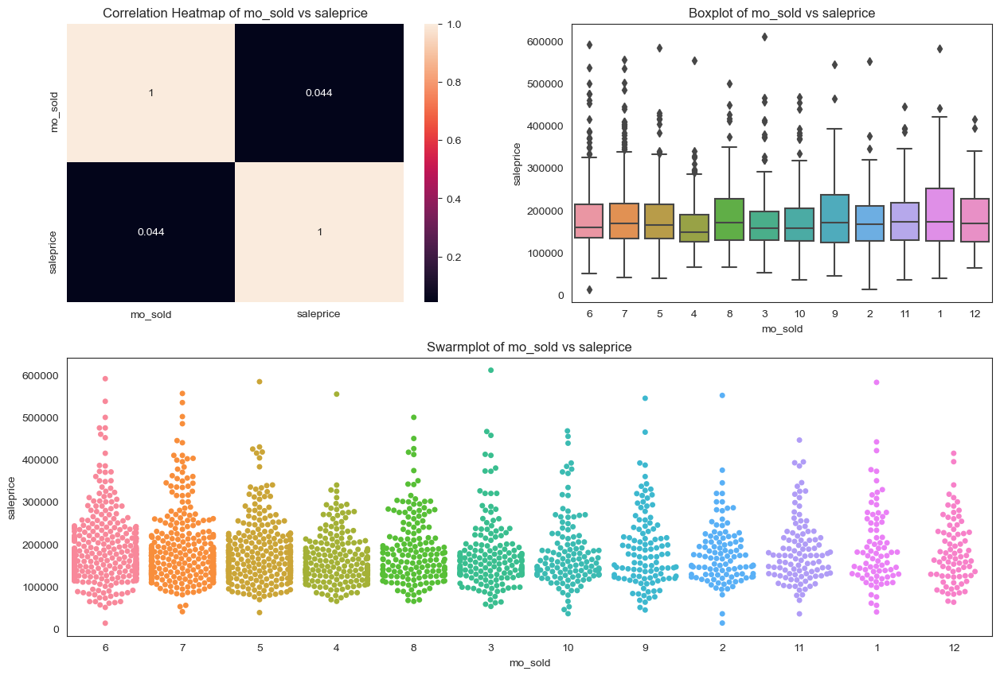

In [84]:
plot_non_num_col(rs, 'mo_sold', 'saleprice')

<span style="color:orange">Conclusion</span>:
- From heatmap, `mo_sold` exhibit very weak correlation wth saleprice
- Boxplot and Swarmplot show a good distribution across price range and elements.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='yr_sold'></a>
### yr_sold
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
yr_sold,2048.000,2007.776,1.313,2006.000,2007.000,2008.000,2009.000,2010.000


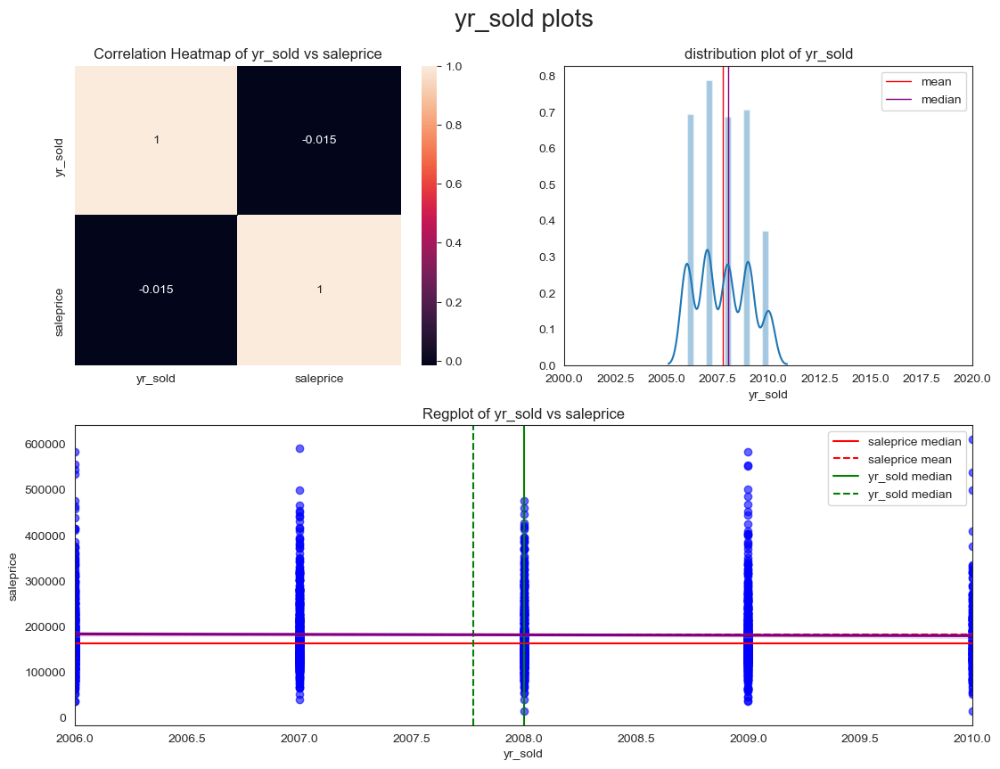

In [85]:
plot_num_col(rs,'yr_sold', 'saleprice',displot_min_xlim=2000, displot_max_xlim= 2020)

<span style="color:orange">Conclusion</span>:
- From heatmap, `yr_sold` exhibit very weak correlation wth saleprice.
- Regplot shows almost no relationship with sale price.
- <span style="color:red">Variable can be dropped without affecting the predictability of the model</span>

<a id='sale_type'></a>
### sale_type
[Top](#plot_dictionary)

,WD,New,COD,ConLD,CWD,ConLI,ConLw,Oth,Con
sale_type val_count,1779.000,160.000,63.000,16.000,10.000,7.000,5.000,4.000,4.000
sale_type weight,0.869,0.078,0.031,0.008,0.005,0.003,0.002,0.002,0.002


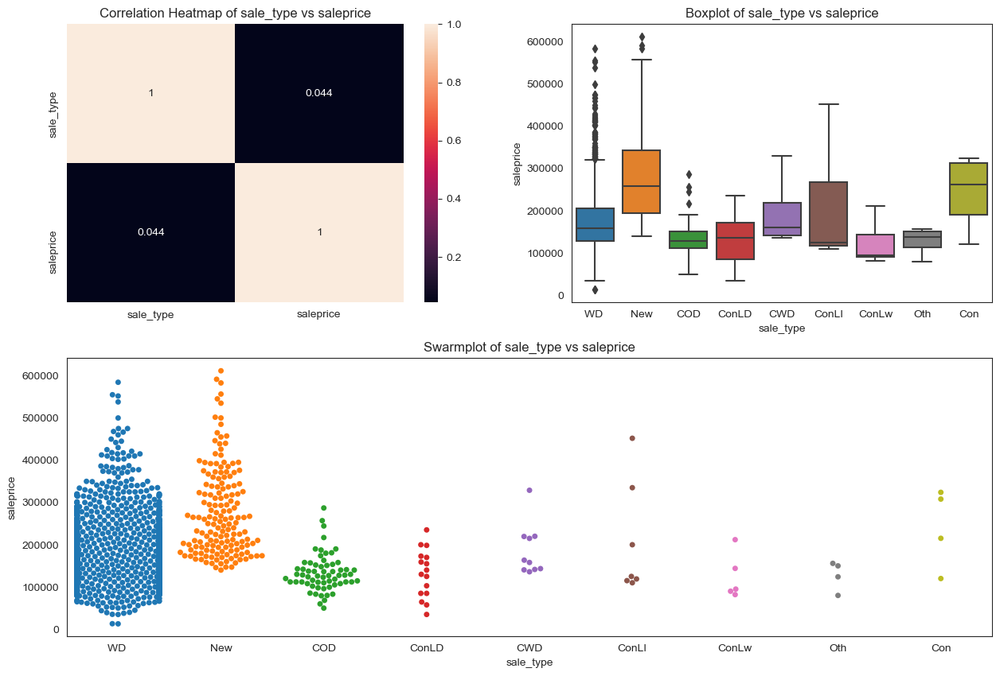

In [86]:
plot_non_num_col(rs, 'sale_type','saleprice')

<span style="color:orange">Conclusion</span>:
- `sale_type` has very low correlation to sale price.
- Boxplot show a good distribution across price range.
- Swarmplot show that most of the observations are Warranty Deed.
- Variable will be used for modeling as it contradict business wisdom & data observed to discard as non-important

<a id='saleprice'></a>
### saleprice
[Top](#plot_dictionary)

,count,mean,std,min,25%,50%,75%,max
saleprice,2048.000,181484.252,79248.658,12789.000,129837.500,162500.000,214000.000,611657.000


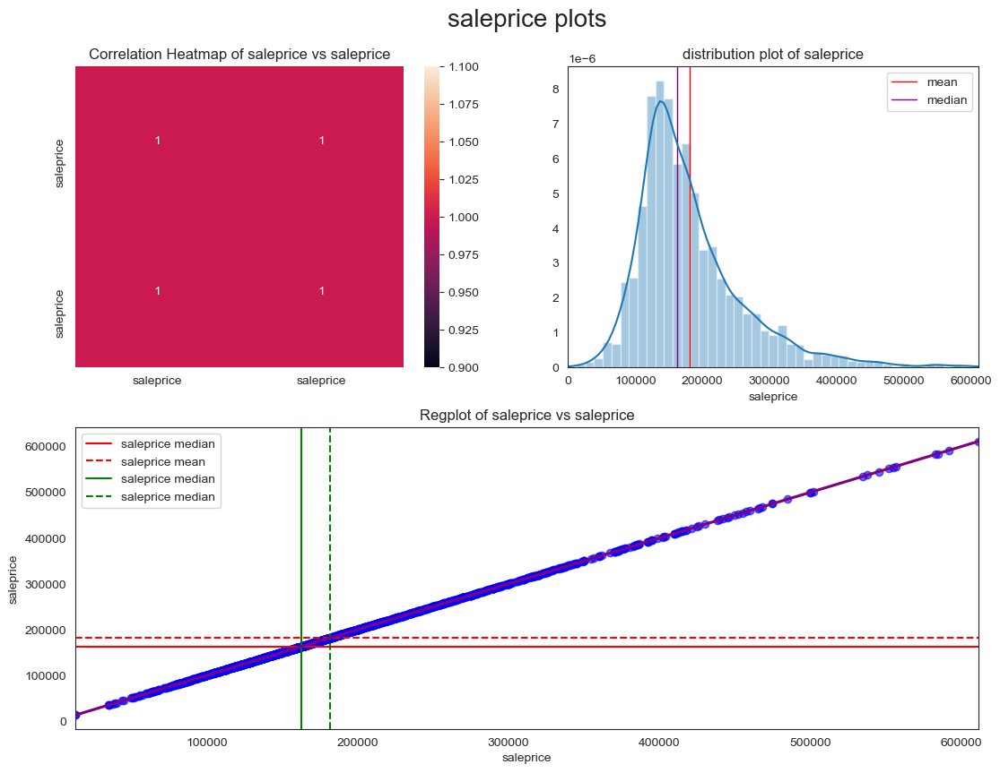

In [87]:
plot_num_col(rs, 'saleprice','saleprice')

<span style="color:orange">Conclusion</span>:
- From distplot, it seems that we can discount houses that are price beyond 500K. This will reduce the predictability of our model if we include these extreme observations. 
- From Regplot, observations beyonds 500K range should to be little. It should not affect the quality of our data if we remove them.
- Further analysis required in the outlier section.